In [1]:
# back to project root
%cd ~/research

import argparse
import gc
import os
import sys
import time
from glob import glob

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch
from tqdm import tqdm
import yaml
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
from torch import nn, optim

sys.path.append("src")
from group.passing.dataset import make_data_loaders, make_all_data
from group.passing.lstm_model import LSTMModel
from utility.activity_loader import load_individuals
from utility.logger import logger
from tools.train_passing import init_model, init_loss, init_optim, train, test

/raid6/home/yokoyama/research


/home/yokoyama/research/.venv/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams["font.size"] = 24
plt.rcParams['xtick.direction'] = 'in'  # x axis in
plt.rcParams['ytick.direction'] = 'in'  # y axis in

In [3]:
os.environ["CUDA_VISIBLE_DEVICES"] = "9"
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [4]:
cfg_path = "config/passing/pass_train.yaml"
with open(cfg_path, "r") as f:
    train_cfg = yaml.safe_load(f)
with open(train_cfg["config_path"]["individual"], "r") as f:
    ind_cfg = yaml.safe_load(f)
with open(train_cfg["config_path"]["group"], "r") as f:
    grp_cfg = yaml.safe_load(f)

In [5]:
data_dirs_all = {}
for room_num, surgery_items in train_cfg["dataset"]["setting"].items():
    for surgery_num in surgery_items.keys():
        dirs = sorted(glob(os.path.join("data", room_num, surgery_num, "passing", "*")))
        data_dirs_all[f"{room_num}_{surgery_num}"] = dirs

inds = {}
for key_prefix, dirs in tqdm(data_dirs_all.items()):
    for model_path in dirs:
        num = model_path.split("/")[-1]
        json_path = os.path.join(model_path, ".json", "individual.json")
        tmp_inds = load_individuals(json_path, ind_cfg)
        for pid, ind in tmp_inds.items():
            inds[f"{key_prefix}_{num}_{pid}"] = ind

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [01:06<00:00, 11.03s/it]


# グリッドサーチ

In [6]:
# create data loader
dataset_cfg = train_cfg["dataset"]
passing_defs = grp_cfg["passing"]["default"]
train_loader, val_loader, test_loader = make_data_loaders(
    inds, dataset_cfg, passing_defs, logger
)

2022-07-18 13:55:07,269 => createing time series 02_001
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:04<00:00,  3.91it/s]
2022-07-18 13:55:11,627 => createing time series 07_001
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:30<00:00,  1.55it/s]
2022-07-18 13:55:42,507 => createing time series 08_001
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:05<00:00,  6.54it/s]
2022-07-18 13:55:48,325 => createing time series 08_002
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:32<00:00,  1.39it/s]
2022-07-18 13:56:20,631 => createing time series 09_

In [7]:
# model config
mdl_cfg = {
    "dropouts": [0.1, 0],
    "hidden_dims": [128, 64],
    "n_classes": 2,
    "n_linears": 2,
    "rnn_dropout": 0.1,
    "size": 4,
}

# grid search parameters
params = {
    'n_rnns': [1, 2, 3],
    'rnn_hidden_dim': [128, 256],
    'pos_weight': [8, 16, 32]
}

# epoch
epoch_len = train_cfg["optim"]["epoch"]

In [8]:
max_acc = [[0, 0, 0, 0], None]
max_pre = [[0, 0, 0, 0], None]
max_rcl = [[0, 0, 0, 0], None]
max_f1 = [[0, 0, 0, 0], None]
max_models = [None for _ in range(4)]

for n_rnns in params['n_rnns']:
    for dim in params['rnn_hidden_dim']:
        for weight in params['pos_weight']:
            param = dict(n_rnns=n_rnns, rnn_hidden_dim=dim, weight=weight)
            print(param)
            
            # update config
            config = {}
            for key, val in mdl_cfg.items():
                config[key] = val
            for key, val in param.items():
                config[key] = val
            pos_weight = param["weight"]
                
            # init model, loss, optim
            model = init_model(config, device)
            criterion = init_loss([1, pos_weight], device)
            optimizer, scheduler = init_optim(
                model, train_cfg["optim"]["lr"], train_cfg["optim"]["lr_rate"]
            )
            
            # training
            model, epoch, history = train(
                model, train_loader, val_loader,
                criterion, optimizer, scheduler,
                epoch_len, logger, device
            )
            
            # test
            score = test(model, test_loader, logger, device)
            acc, pre, rcl, f1 = score
            
            # update max scores
            if acc > max_acc[0][0]:
                max_acc[0] = score
                max_acc[1] = param
                max_models[0] = model
            if pre > max_pre[0][1]:
                max_pre[0] = score
                max_pre[1] = param
                max_models[1] = model
            if rcl > max_rcl[0][2]:
                max_rcl[0] = score
                max_rcl[1] = param
                max_models[2] = model
            if f1 > max_f1[0][3]:
                max_f1[0] = score
                max_f1[1] = param
                max_models[3] = model
                
            torch.cuda.empty_cache()

{'n_rnns': 1, 'rnn_hidden_dim': 128, 'weight': 8}


2022-07-18 14:00:01,021 => start training
2022-07-18 14:00:12,535 Epoch[1/100] train loss: 0.44874, val loss: nan, lr: 0.0010000, time: 11.51
2022-07-18 14:00:23,311 Epoch[2/100] train loss: 0.39819, val loss: nan, lr: 0.0010000, time: 10.77
2022-07-18 14:00:34,774 Epoch[3/100] train loss: 0.39589, val loss: nan, lr: 0.0010000, time: 11.46
2022-07-18 14:00:46,323 Epoch[4/100] train loss: 0.39465, val loss: nan, lr: 0.0010000, time: 11.55
2022-07-18 14:00:57,836 Epoch[5/100] train loss: 0.39342, val loss: nan, lr: 0.0010000, time: 11.51
2022-07-18 14:01:08,862 Epoch[6/100] train loss: 0.39240, val loss: nan, lr: 0.0010000, time: 11.02
2022-07-18 14:01:20,984 Epoch[7/100] train loss: 0.39166, val loss: nan, lr: 0.0010000, time: 12.12
2022-07-18 14:01:32,321 Epoch[8/100] train loss: 0.39118, val loss: nan, lr: 0.0010000, time: 11.33
2022-07-18 14:01:44,318 Epoch[9/100] train loss: 0.39065, val loss: nan, lr: 0.0010000, time: 12.00
2022-07-18 14:01:56,241 Epoch[10/100] train loss: 0.38844,

{'n_rnns': 1, 'rnn_hidden_dim': 128, 'weight': 16}


2022-07-18 14:19:39,117 Epoch[1/100] train loss: 0.46316, val loss: nan, lr: 0.0010000, time: 11.67
2022-07-18 14:19:50,535 Epoch[2/100] train loss: 0.42948, val loss: nan, lr: 0.0010000, time: 11.42
2022-07-18 14:20:01,485 Epoch[3/100] train loss: 0.42584, val loss: nan, lr: 0.0010000, time: 10.95
2022-07-18 14:20:12,811 Epoch[4/100] train loss: 0.42414, val loss: nan, lr: 0.0010000, time: 11.32
2022-07-18 14:20:23,942 Epoch[5/100] train loss: 0.42266, val loss: nan, lr: 0.0010000, time: 11.13
2022-07-18 14:20:35,316 Epoch[6/100] train loss: 0.42059, val loss: nan, lr: 0.0010000, time: 11.37
2022-07-18 14:20:46,858 Epoch[7/100] train loss: 0.41862, val loss: nan, lr: 0.0010000, time: 11.54
2022-07-18 14:20:58,368 Epoch[8/100] train loss: 0.41774, val loss: nan, lr: 0.0010000, time: 11.51
2022-07-18 14:21:09,634 Epoch[9/100] train loss: 0.41672, val loss: nan, lr: 0.0010000, time: 11.26
2022-07-18 14:21:21,018 Epoch[10/100] train loss: 0.41552, val loss: nan, lr: 0.0010000, time: 11.38

{'n_rnns': 1, 'rnn_hidden_dim': 128, 'weight': 32}


2022-07-18 14:38:49,977 Epoch[1/100] train loss: 0.52282, val loss: nan, lr: 0.0010000, time: 11.20
2022-07-18 14:39:01,190 Epoch[2/100] train loss: 0.48121, val loss: nan, lr: 0.0010000, time: 11.21
2022-07-18 14:39:12,185 Epoch[3/100] train loss: 0.47847, val loss: nan, lr: 0.0010000, time: 10.99
2022-07-18 14:39:23,597 Epoch[4/100] train loss: 0.47697, val loss: nan, lr: 0.0010000, time: 11.41
2022-07-18 14:39:35,112 Epoch[5/100] train loss: 0.47336, val loss: nan, lr: 0.0010000, time: 11.51
2022-07-18 14:39:46,254 Epoch[6/100] train loss: 0.47271, val loss: nan, lr: 0.0010000, time: 11.14
2022-07-18 14:39:57,468 Epoch[7/100] train loss: 0.46967, val loss: nan, lr: 0.0010000, time: 11.21
2022-07-18 14:40:08,397 Epoch[8/100] train loss: 0.46782, val loss: nan, lr: 0.0010000, time: 10.93
2022-07-18 14:40:19,511 Epoch[9/100] train loss: 0.46592, val loss: nan, lr: 0.0010000, time: 11.11
2022-07-18 14:40:30,532 Epoch[10/100] train loss: 0.46410, val loss: nan, lr: 0.0010000, time: 11.02

{'n_rnns': 1, 'rnn_hidden_dim': 256, 'weight': 8}


2022-07-18 14:57:54,899 Epoch[1/100] train loss: 0.45198, val loss: nan, lr: 0.0010000, time: 12.75
2022-07-18 14:58:07,737 Epoch[2/100] train loss: 0.39862, val loss: nan, lr: 0.0010000, time: 12.84
2022-07-18 14:58:20,564 Epoch[3/100] train loss: 0.39652, val loss: nan, lr: 0.0010000, time: 12.82
2022-07-18 14:58:33,410 Epoch[4/100] train loss: 0.39472, val loss: nan, lr: 0.0010000, time: 12.84
2022-07-18 14:58:46,215 Epoch[5/100] train loss: 0.39433, val loss: nan, lr: 0.0010000, time: 12.80
2022-07-18 14:58:59,213 Epoch[6/100] train loss: 0.39421, val loss: nan, lr: 0.0010000, time: 13.00
2022-07-18 14:59:12,043 Epoch[7/100] train loss: 0.39266, val loss: nan, lr: 0.0010000, time: 12.83
2022-07-18 14:59:24,895 Epoch[8/100] train loss: 0.39219, val loss: nan, lr: 0.0010000, time: 12.85
2022-07-18 14:59:38,173 Epoch[9/100] train loss: 0.39014, val loss: nan, lr: 0.0010000, time: 13.28
2022-07-18 14:59:51,146 Epoch[10/100] train loss: 0.38978, val loss: nan, lr: 0.0010000, time: 12.97

{'n_rnns': 1, 'rnn_hidden_dim': 256, 'weight': 16}


2022-07-18 15:20:05,088 Epoch[1/100] train loss: 0.48871, val loss: nan, lr: 0.0010000, time: 12.81
2022-07-18 15:20:17,851 Epoch[2/100] train loss: 0.42995, val loss: nan, lr: 0.0010000, time: 12.76
2022-07-18 15:20:30,670 Epoch[3/100] train loss: 0.42682, val loss: nan, lr: 0.0010000, time: 12.82
2022-07-18 15:20:43,596 Epoch[4/100] train loss: 0.42539, val loss: nan, lr: 0.0010000, time: 12.92
2022-07-18 15:20:56,399 Epoch[5/100] train loss: 0.42330, val loss: nan, lr: 0.0010000, time: 12.80
2022-07-18 15:21:09,283 Epoch[6/100] train loss: 0.42144, val loss: nan, lr: 0.0010000, time: 12.88
2022-07-18 15:21:22,136 Epoch[7/100] train loss: 0.41965, val loss: nan, lr: 0.0010000, time: 12.85
2022-07-18 15:21:35,017 Epoch[8/100] train loss: 0.41840, val loss: nan, lr: 0.0010000, time: 12.88
2022-07-18 15:21:47,799 Epoch[9/100] train loss: 0.41750, val loss: nan, lr: 0.0010000, time: 12.78
2022-07-18 15:22:00,556 Epoch[10/100] train loss: 0.41702, val loss: nan, lr: 0.0010000, time: 12.75

{'n_rnns': 1, 'rnn_hidden_dim': 256, 'weight': 32}


2022-07-18 15:42:15,723 Epoch[1/100] train loss: 0.54575, val loss: nan, lr: 0.0010000, time: 13.18
2022-07-18 15:42:28,934 Epoch[2/100] train loss: 0.48550, val loss: nan, lr: 0.0010000, time: 13.21
2022-07-18 15:42:42,170 Epoch[3/100] train loss: 0.47854, val loss: nan, lr: 0.0010000, time: 13.23
2022-07-18 15:42:55,256 Epoch[4/100] train loss: 0.47618, val loss: nan, lr: 0.0010000, time: 13.08
2022-07-18 15:43:08,542 Epoch[5/100] train loss: 0.47400, val loss: nan, lr: 0.0010000, time: 13.28
2022-07-18 15:43:21,755 Epoch[6/100] train loss: 0.47299, val loss: nan, lr: 0.0010000, time: 13.21
2022-07-18 15:43:34,811 Epoch[7/100] train loss: 0.47007, val loss: nan, lr: 0.0010000, time: 13.05
2022-07-18 15:43:47,917 Epoch[8/100] train loss: 0.46632, val loss: nan, lr: 0.0010000, time: 13.10
2022-07-18 15:44:00,866 Epoch[9/100] train loss: 0.46585, val loss: nan, lr: 0.0010000, time: 12.95
2022-07-18 15:44:13,855 Epoch[10/100] train loss: 0.46249, val loss: nan, lr: 0.0010000, time: 12.99

{'n_rnns': 2, 'rnn_hidden_dim': 128, 'weight': 8}


2022-07-18 16:04:32,944 Epoch[1/100] train loss: 0.46279, val loss: nan, lr: 0.0010000, time: 11.63
2022-07-18 16:04:44,330 Epoch[2/100] train loss: 0.39918, val loss: nan, lr: 0.0010000, time: 11.38
2022-07-18 16:04:55,825 Epoch[3/100] train loss: 0.39628, val loss: nan, lr: 0.0010000, time: 11.49
2022-07-18 16:05:07,226 Epoch[4/100] train loss: 0.39541, val loss: nan, lr: 0.0010000, time: 11.40
2022-07-18 16:05:18,462 Epoch[5/100] train loss: 0.39491, val loss: nan, lr: 0.0010000, time: 11.23
2022-07-18 16:05:29,977 Epoch[6/100] train loss: 0.39404, val loss: nan, lr: 0.0010000, time: 11.51
2022-07-18 16:05:41,343 Epoch[7/100] train loss: 0.39336, val loss: nan, lr: 0.0010000, time: 11.36
2022-07-18 16:05:52,803 Epoch[8/100] train loss: 0.39200, val loss: nan, lr: 0.0010000, time: 11.46
2022-07-18 16:06:04,138 Epoch[9/100] train loss: 0.39090, val loss: nan, lr: 0.0010000, time: 11.33
2022-07-18 16:06:15,628 Epoch[10/100] train loss: 0.39017, val loss: nan, lr: 0.0010000, time: 11.49

{'n_rnns': 2, 'rnn_hidden_dim': 128, 'weight': 16}


2022-07-18 16:24:17,615 Epoch[1/100] train loss: 0.51318, val loss: nan, lr: 0.0010000, time: 11.62
2022-07-18 16:24:29,043 Epoch[2/100] train loss: 0.43380, val loss: nan, lr: 0.0010000, time: 11.43
2022-07-18 16:24:41,148 Epoch[3/100] train loss: 0.42959, val loss: nan, lr: 0.0010000, time: 12.10
2022-07-18 16:24:52,715 Epoch[4/100] train loss: 0.42620, val loss: nan, lr: 0.0010000, time: 11.56
2022-07-18 16:25:04,009 Epoch[5/100] train loss: 0.42450, val loss: nan, lr: 0.0010000, time: 11.29
2022-07-18 16:25:16,124 Epoch[6/100] train loss: 0.42394, val loss: nan, lr: 0.0010000, time: 12.11
2022-07-18 16:25:28,005 Epoch[7/100] train loss: 0.42328, val loss: nan, lr: 0.0010000, time: 11.88
2022-07-18 16:25:39,937 Epoch[8/100] train loss: 0.42280, val loss: nan, lr: 0.0010000, time: 11.93
2022-07-18 16:25:51,741 Epoch[9/100] train loss: 0.42144, val loss: nan, lr: 0.0010000, time: 11.80
2022-07-18 16:26:03,471 Epoch[10/100] train loss: 0.41955, val loss: nan, lr: 0.0010000, time: 11.73

{'n_rnns': 2, 'rnn_hidden_dim': 128, 'weight': 32}


2022-07-18 16:43:54,441 Epoch[1/100] train loss: 0.51666, val loss: nan, lr: 0.0010000, time: 11.46
2022-07-18 16:44:05,986 Epoch[2/100] train loss: 0.48307, val loss: nan, lr: 0.0010000, time: 11.54
2022-07-18 16:44:17,604 Epoch[3/100] train loss: 0.47830, val loss: nan, lr: 0.0010000, time: 11.62
2022-07-18 16:44:28,913 Epoch[4/100] train loss: 0.47613, val loss: nan, lr: 0.0010000, time: 11.31
2022-07-18 16:44:40,814 Epoch[5/100] train loss: 0.47517, val loss: nan, lr: 0.0010000, time: 11.90
2022-07-18 16:44:52,253 Epoch[6/100] train loss: 0.47431, val loss: nan, lr: 0.0010000, time: 11.44
2022-07-18 16:45:03,830 Epoch[7/100] train loss: 0.47030, val loss: nan, lr: 0.0010000, time: 11.57
2022-07-18 16:45:15,499 Epoch[8/100] train loss: 0.46924, val loss: nan, lr: 0.0010000, time: 11.67
2022-07-18 16:45:27,014 Epoch[9/100] train loss: 0.46630, val loss: nan, lr: 0.0010000, time: 11.51
2022-07-18 16:45:38,564 Epoch[10/100] train loss: 0.46343, val loss: nan, lr: 0.0010000, time: 11.55

{'n_rnns': 2, 'rnn_hidden_dim': 256, 'weight': 8}


2022-07-18 17:03:54,866 Epoch[1/100] train loss: 0.46567, val loss: nan, lr: 0.0010000, time: 23.36
2022-07-18 17:04:18,619 Epoch[2/100] train loss: 0.40083, val loss: nan, lr: 0.0010000, time: 23.75
2022-07-18 17:04:42,203 Epoch[3/100] train loss: 0.39811, val loss: nan, lr: 0.0010000, time: 23.58
2022-07-18 17:05:05,802 Epoch[4/100] train loss: 0.39825, val loss: nan, lr: 0.0010000, time: 23.60
2022-07-18 17:05:29,426 Epoch[5/100] train loss: 0.39653, val loss: nan, lr: 0.0010000, time: 23.62
2022-07-18 17:05:53,026 Epoch[6/100] train loss: 0.39525, val loss: nan, lr: 0.0010000, time: 23.60
2022-07-18 17:06:16,661 Epoch[7/100] train loss: 0.39486, val loss: nan, lr: 0.0010000, time: 23.63
2022-07-18 17:06:40,268 Epoch[8/100] train loss: 0.39444, val loss: nan, lr: 0.0010000, time: 23.60
2022-07-18 17:07:04,037 Epoch[9/100] train loss: 0.39229, val loss: nan, lr: 0.0010000, time: 23.77
2022-07-18 17:07:27,704 Epoch[10/100] train loss: 0.39149, val loss: nan, lr: 0.0010000, time: 23.66

{'n_rnns': 2, 'rnn_hidden_dim': 256, 'weight': 16}


2022-07-18 17:43:52,410 Epoch[1/100] train loss: 0.46998, val loss: nan, lr: 0.0010000, time: 23.78
2022-07-18 17:44:16,290 Epoch[2/100] train loss: 0.43055, val loss: nan, lr: 0.0010000, time: 23.88
2022-07-18 17:44:40,173 Epoch[3/100] train loss: 0.42893, val loss: nan, lr: 0.0010000, time: 23.88
2022-07-18 17:45:04,039 Epoch[4/100] train loss: 0.42691, val loss: nan, lr: 0.0010000, time: 23.86
2022-07-18 17:45:27,926 Epoch[5/100] train loss: 0.42536, val loss: nan, lr: 0.0010000, time: 23.88
2022-07-18 17:45:51,743 Epoch[6/100] train loss: 0.42417, val loss: nan, lr: 0.0010000, time: 23.81
2022-07-18 17:46:15,591 Epoch[7/100] train loss: 0.42284, val loss: nan, lr: 0.0010000, time: 23.85
2022-07-18 17:46:39,511 Epoch[8/100] train loss: 0.42134, val loss: nan, lr: 0.0010000, time: 23.92
2022-07-18 17:47:03,431 Epoch[9/100] train loss: 0.42124, val loss: nan, lr: 0.0010000, time: 23.92
2022-07-18 17:47:27,437 Epoch[10/100] train loss: 0.42060, val loss: nan, lr: 0.0010000, time: 24.00

{'n_rnns': 2, 'rnn_hidden_dim': 256, 'weight': 32}


2022-07-18 18:24:12,189 Epoch[1/100] train loss: 0.52667, val loss: nan, lr: 0.0010000, time: 23.59
2022-07-18 18:24:35,930 Epoch[2/100] train loss: 0.48570, val loss: nan, lr: 0.0010000, time: 23.74
2022-07-18 18:24:59,760 Epoch[3/100] train loss: 0.48432, val loss: nan, lr: 0.0010000, time: 23.83
2022-07-18 18:25:23,499 Epoch[4/100] train loss: 0.47927, val loss: nan, lr: 0.0010000, time: 23.74
2022-07-18 18:25:47,277 Epoch[5/100] train loss: 0.48134, val loss: nan, lr: 0.0010000, time: 23.78
2022-07-18 18:26:11,192 Epoch[6/100] train loss: 0.47546, val loss: nan, lr: 0.0010000, time: 23.91
2022-07-18 18:26:35,033 Epoch[7/100] train loss: 0.47448, val loss: nan, lr: 0.0010000, time: 23.84
2022-07-18 18:26:59,057 Epoch[8/100] train loss: 0.47163, val loss: nan, lr: 0.0010000, time: 24.02
2022-07-18 18:27:22,706 Epoch[9/100] train loss: 0.47009, val loss: nan, lr: 0.0010000, time: 23.65
2022-07-18 18:27:46,368 Epoch[10/100] train loss: 0.46603, val loss: nan, lr: 0.0010000, time: 23.66

{'n_rnns': 3, 'rnn_hidden_dim': 128, 'weight': 8}


2022-07-18 19:04:20,134 Epoch[1/100] train loss: 0.45646, val loss: nan, lr: 0.0010000, time: 16.22
2022-07-18 19:04:36,324 Epoch[2/100] train loss: 0.40097, val loss: nan, lr: 0.0010000, time: 16.19
2022-07-18 19:04:52,611 Epoch[3/100] train loss: 0.39840, val loss: nan, lr: 0.0010000, time: 16.29
2022-07-18 19:05:08,809 Epoch[4/100] train loss: 0.39683, val loss: nan, lr: 0.0010000, time: 16.20
2022-07-18 19:05:25,036 Epoch[5/100] train loss: 0.39623, val loss: nan, lr: 0.0010000, time: 16.22
2022-07-18 19:05:41,453 Epoch[6/100] train loss: 0.39683, val loss: nan, lr: 0.0010000, time: 16.42
2022-07-18 19:05:58,200 Epoch[7/100] train loss: 0.39534, val loss: nan, lr: 0.0010000, time: 16.74
2022-07-18 19:06:14,476 Epoch[8/100] train loss: 0.39430, val loss: nan, lr: 0.0010000, time: 16.27
2022-07-18 19:06:30,855 Epoch[9/100] train loss: 0.39348, val loss: nan, lr: 0.0010000, time: 16.38
2022-07-18 19:06:47,055 Epoch[10/100] train loss: 0.39256, val loss: nan, lr: 0.0010000, time: 16.20

{'n_rnns': 3, 'rnn_hidden_dim': 128, 'weight': 16}


2022-07-18 19:31:53,553 Epoch[1/100] train loss: 0.47314, val loss: nan, lr: 0.0010000, time: 15.98
2022-07-18 19:32:09,591 Epoch[2/100] train loss: 0.43211, val loss: nan, lr: 0.0010000, time: 16.03
2022-07-18 19:32:25,722 Epoch[3/100] train loss: 0.42891, val loss: nan, lr: 0.0010000, time: 16.13
2022-07-18 19:32:41,789 Epoch[4/100] train loss: 0.42681, val loss: nan, lr: 0.0010000, time: 16.06
2022-07-18 19:32:57,927 Epoch[5/100] train loss: 0.42588, val loss: nan, lr: 0.0010000, time: 16.14
2022-07-18 19:33:14,071 Epoch[6/100] train loss: 0.42631, val loss: nan, lr: 0.0010000, time: 16.14
2022-07-18 19:33:30,192 Epoch[7/100] train loss: 0.42537, val loss: nan, lr: 0.0010000, time: 16.12
2022-07-18 19:33:46,331 Epoch[8/100] train loss: 0.42252, val loss: nan, lr: 0.0010000, time: 16.14
2022-07-18 19:34:02,553 Epoch[9/100] train loss: 0.42326, val loss: nan, lr: 0.0010000, time: 16.22
2022-07-18 19:34:18,638 Epoch[10/100] train loss: 0.42886, val loss: nan, lr: 0.0010000, time: 16.08

{'n_rnns': 3, 'rnn_hidden_dim': 128, 'weight': 32}


2022-07-18 19:59:16,325 Epoch[1/100] train loss: 0.51230, val loss: nan, lr: 0.0010000, time: 16.09
2022-07-18 19:59:32,549 Epoch[2/100] train loss: 0.48571, val loss: nan, lr: 0.0010000, time: 16.22
2022-07-18 19:59:48,692 Epoch[3/100] train loss: 0.48357, val loss: nan, lr: 0.0010000, time: 16.14
2022-07-18 20:00:04,969 Epoch[4/100] train loss: 0.47912, val loss: nan, lr: 0.0010000, time: 16.27
2022-07-18 20:00:21,223 Epoch[5/100] train loss: 0.47620, val loss: nan, lr: 0.0010000, time: 16.25
2022-07-18 20:00:37,320 Epoch[6/100] train loss: 0.47491, val loss: nan, lr: 0.0010000, time: 16.10
2022-07-18 20:00:53,483 Epoch[7/100] train loss: 0.47417, val loss: nan, lr: 0.0010000, time: 16.16
2022-07-18 20:01:09,599 Epoch[8/100] train loss: 0.47199, val loss: nan, lr: 0.0010000, time: 16.11
2022-07-18 20:01:25,673 Epoch[9/100] train loss: 0.46997, val loss: nan, lr: 0.0010000, time: 16.07
2022-07-18 20:01:41,738 Epoch[10/100] train loss: 0.46708, val loss: nan, lr: 0.0010000, time: 16.06

{'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 8}


2022-07-18 20:27:10,323 Epoch[1/100] train loss: 0.45343, val loss: nan, lr: 0.0010000, time: 37.69
2022-07-18 20:27:48,074 Epoch[2/100] train loss: 0.40157, val loss: nan, lr: 0.0010000, time: 37.75
2022-07-18 20:28:25,790 Epoch[3/100] train loss: 0.39824, val loss: nan, lr: 0.0010000, time: 37.71
2022-07-18 20:29:03,490 Epoch[4/100] train loss: 0.39645, val loss: nan, lr: 0.0010000, time: 37.70
2022-07-18 20:29:41,354 Epoch[5/100] train loss: 0.39505, val loss: nan, lr: 0.0010000, time: 37.86
2022-07-18 20:30:19,306 Epoch[6/100] train loss: 0.39830, val loss: nan, lr: 0.0010000, time: 37.95
2022-07-18 20:30:57,039 Epoch[7/100] train loss: 0.39777, val loss: nan, lr: 0.0010000, time: 37.73
2022-07-18 20:31:34,804 Epoch[8/100] train loss: 0.39552, val loss: nan, lr: 0.0010000, time: 37.76
2022-07-18 20:32:12,473 Epoch[9/100] train loss: 0.39402, val loss: nan, lr: 0.0010000, time: 37.67
2022-07-18 20:32:50,241 Epoch[10/100] train loss: 0.39384, val loss: nan, lr: 0.0010000, time: 37.77

{'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 16}


2022-07-18 21:30:22,525 Epoch[1/100] train loss: 0.49598, val loss: nan, lr: 0.0010000, time: 37.67
2022-07-18 21:31:00,316 Epoch[2/100] train loss: 0.43968, val loss: nan, lr: 0.0010000, time: 37.79
2022-07-18 21:31:37,830 Epoch[3/100] train loss: 0.44002, val loss: nan, lr: 0.0010000, time: 37.51
2022-07-18 21:32:15,601 Epoch[4/100] train loss: 0.43347, val loss: nan, lr: 0.0010000, time: 37.77
2022-07-18 21:32:53,412 Epoch[5/100] train loss: 0.43268, val loss: nan, lr: 0.0010000, time: 37.81
2022-07-18 21:33:31,077 Epoch[6/100] train loss: 0.42982, val loss: nan, lr: 0.0010000, time: 37.66
2022-07-18 21:34:08,747 Epoch[7/100] train loss: 0.42854, val loss: nan, lr: 0.0010000, time: 37.67
2022-07-18 21:34:46,421 Epoch[8/100] train loss: 0.42909, val loss: nan, lr: 0.0010000, time: 37.67
2022-07-18 21:35:24,187 Epoch[9/100] train loss: 0.42795, val loss: nan, lr: 0.0010000, time: 37.76
2022-07-18 21:36:01,873 Epoch[10/100] train loss: 0.42538, val loss: nan, lr: 0.0010000, time: 37.68

{'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 32}


2022-07-18 22:33:18,747 Epoch[1/100] train loss: 0.54122, val loss: nan, lr: 0.0010000, time: 37.33
2022-07-18 22:33:56,223 Epoch[2/100] train loss: 0.48875, val loss: nan, lr: 0.0010000, time: 37.47
2022-07-18 22:34:33,724 Epoch[3/100] train loss: 0.48279, val loss: nan, lr: 0.0010000, time: 37.50
2022-07-18 22:35:11,100 Epoch[4/100] train loss: 0.47830, val loss: nan, lr: 0.0010000, time: 37.37
2022-07-18 22:35:48,527 Epoch[5/100] train loss: 0.47594, val loss: nan, lr: 0.0010000, time: 37.42
2022-07-18 22:36:25,878 Epoch[6/100] train loss: 0.47674, val loss: nan, lr: 0.0010000, time: 37.35
2022-07-18 22:37:03,404 Epoch[7/100] train loss: 0.47949, val loss: nan, lr: 0.0010000, time: 37.52
2022-07-18 22:37:40,773 Epoch[8/100] train loss: 0.47438, val loss: nan, lr: 0.0010000, time: 37.37
2022-07-18 22:38:18,164 Epoch[9/100] train loss: 0.47176, val loss: nan, lr: 0.0010000, time: 37.39
2022-07-18 22:38:55,616 Epoch[10/100] train loss: 0.47088, val loss: nan, lr: 0.0010000, time: 37.45

In [9]:
print(f"epoch={epoch}")
print('max accuracy: ', max_acc[1])
acc, pre, rcl, f1 = max_acc[0]
print('accuracy: {:.3f}'.format(acc), 'precision: {:.3f}'.format(pre), 'recall: {:.3f}'.format(rcl), 'f1_score: {:.3f}'.format(f1))

print('max precision: ', max_pre[1])
acc, pre, rcl, f1 = max_pre[0]
print('accuracy: {:.3f}'.format(acc), 'precision: {:.3f}'.format(pre), 'recall: {:.3f}'.format(rcl), 'f1_score: {:.3f}'.format(f1))

print('max recall: ', max_rcl[1])
acc, pre, rcl, f1 = max_rcl[0]
print('accuracy: {:.3f}'.format(acc), 'precision: {:.3f}'.format(pre), 'recall: {:.3f}'.format(rcl), 'f1_score: {:.3f}'.format(f1))

print('max f1: ', max_f1[1])
acc, pre, rcl, f1 = max_f1[0]
print('accuracy: {:.3f}'.format(acc), 'precision: {:.3f}'.format(pre), 'recall: {:.3f}'.format(rcl), 'f1_score: {:.3f}'.format(f1))

epoch=100
max accuracy:  {'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 16}
accuracy: 0.996 precision: 0.550 recall: 0.391 f1_score: 0.457
max precision:  {'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 16}
accuracy: 0.996 precision: 0.550 recall: 0.391 f1_score: 0.457
max recall:  {'n_rnns': 3, 'rnn_hidden_dim': 128, 'weight': 32}
accuracy: 0.990 precision: 0.274 recall: 0.619 f1_score: 0.380
max f1:  {'n_rnns': 2, 'rnn_hidden_dim': 256, 'weight': 16}
accuracy: 0.995 precision: 0.480 recall: 0.490 f1_score: 0.485


## モデル保存

In [10]:
# select max recall
model = max_models[2]
param = max_rcl[1]
config = {}
for key, val in mdl_cfg.items():
    config[key] = val
for key, val in param.items():
    config[key] = val

In [11]:
model_path = f'models/passing/pass_model_lstm_recall_ep{epoch}.pth'
torch.save(model.state_dict(), model_path)

In [12]:
config["pretrained_path"] = model_path
with open(f'config/passing/pass_model_lstm_recall_ep{epoch}.yaml', 'w') as f:
    yaml.dump(config, f)

In [13]:
# select max f1
model = max_models[3]
param = max_f1[1]
config = {}
for key, val in mdl_cfg.items():
    config[key] = val
for key, val in param.items():
    config[key] = val

In [14]:
model_path = f'models/passing/pass_model_lstm_f1_ep{epoch}.pth'
torch.save(model.state_dict(), model_path)

In [15]:
config["pretrained_path"] = model_path
with open(f'config/passing/pass_model_lstm_f1_ep{epoch}.yaml', 'w') as f:
    yaml.dump(config, f)

# 検証
## モデルロード

In [16]:
# load model
epoch = 100
rcl_f1 = "f1"

try:
    torch.cuda.empty_cache()
    del model
    gc.collect()
except NameError:
    pass

mdl_cfg_path = f'config/passing/pass_model_lstm_{rcl_f1}_ep{epoch}.yaml'
with open(mdl_cfg_path, "r") as f:
    mdl_cfg = yaml.safe_load(f)
model = init_model(mdl_cfg, device)

param = torch.load(mdl_cfg["pretrained_path"])
model.load_state_dict(param)

<All keys matched successfully>

## データロード

In [17]:
# setting random seed
np.random.seed(train_cfg["dataset"]["random_seed"])

x_dict, y_dict = make_all_data(inds, train_cfg["dataset"]["setting"], grp_cfg["passing"]["default"], logger)

random_keys = np.random.choice(
    list(x_dict.keys()),
    size=len(x_dict),
    replace=False
)

train_ratio = train_cfg["dataset"]["train_ratio"] + train_cfg["dataset"]["val_ratio"]
train_len = int(len(x_dict) * train_ratio)

train_keys = random_keys[:train_len]
test_keys = random_keys[train_len:]

seq_len = grp_cfg["passing"]["default"]["seq_len"]
size = mdl_cfg["size"]

2022-07-18 23:35:32,368 => createing time series 02_001
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:02<00:00,  7.15it/s]
2022-07-18 23:35:34,750 => createing time series 07_001
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:29<00:00,  1.62it/s]
2022-07-18 23:36:04,448 => createing time series 08_001
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:01<00:00, 19.26it/s]
2022-07-18 23:36:06,425 => createing time series 08_002
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:30<00:00,  1.46it/s]
2022-07-18 23:36:37,273 => createing time series 09_

In [18]:
def create_sequence(x_lst, y_lst, seq_len=30, size=4):
    x_seq = []
    y_seq = []
    for i in range(len(x_lst) - seq_len + 1):
        x = x_lst[i:i + seq_len]
        x_seq.append(x)
        y_seq.append(y_lst[i + seq_len - 1])
    
    return x_seq, y_seq


columns = ["distance", "body_direction", "arm_ave", "wrist_distance"]
def plot(x_lst, y_lst, pred, seq_len=30, path=None):
    x_lst = [[0 for _ in range(x_lst.shape[1])]] + [[np.nan for _ in range(x_lst.shape[1])] for i in range(seq_len - 1)] + x_lst.tolist()
    y_lst = [0] + [np.nan for i in range(seq_len - 1)] + y_lst
    pred = [0] + [np.nan for i in range(seq_len - 1)] + pred.tolist()
    
    fig = plt.figure(figsize=(13, 4))
    ax = fig.add_axes((0.04, 0.17, 0.80, 0.81))
    
    ax.plot(pred, label='pred')
    ax.plot(y_lst, linestyle=':', label='ground truth')
    for i, feature in enumerate(np.array(x_lst).T):
        ax.plot(feature, alpha=0.4, label=columns[i])

    ax.set_ylim((-0.05, 1.05))
    ax.set_xlabel('frame')
    ax.legend(
        bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0,
        fontsize=20, handlelength=0.8, handletextpad=0.2
    )
    
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
    if path is not None:
        fig.savefig(path)
    plt.show()

## トレインデータ

In [19]:
save_keys = [
    '02_06_1_3',
]

2022-07-18 23:40:08,505 findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.
2022-07-18 23:40:08,533 findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


07_001_18_293_297


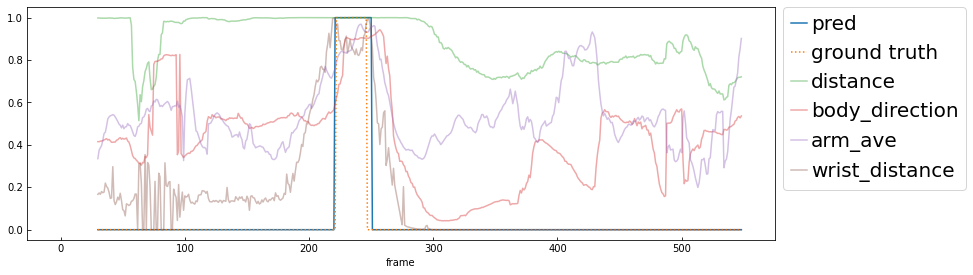

07_001_45_633_652


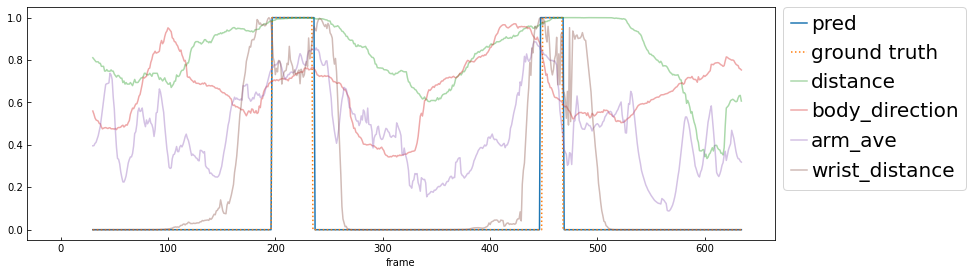

07_001_15_232_247


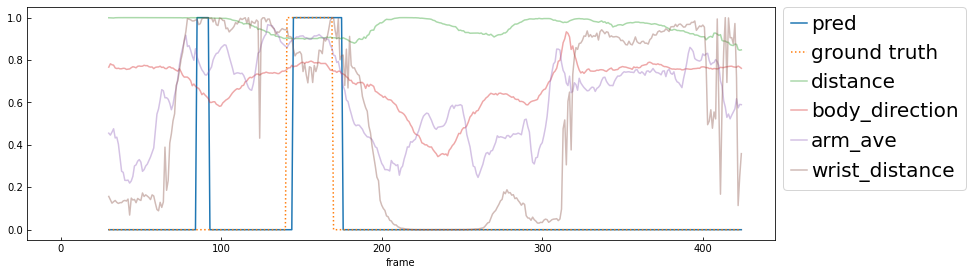

09_002_12_92_99


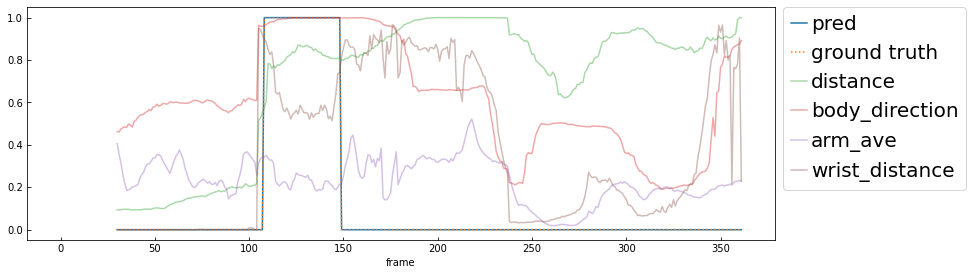

09_002_03_27_26


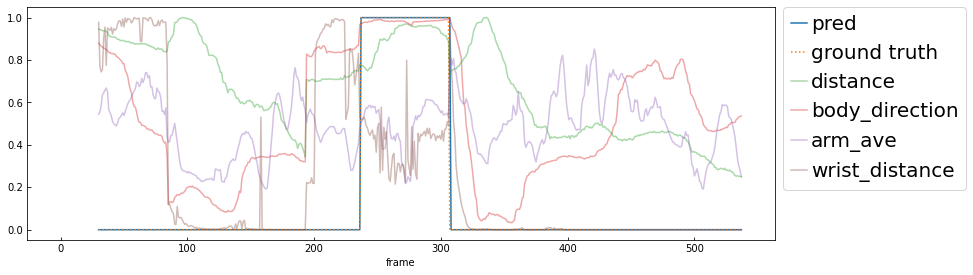

07_001_30_453_459


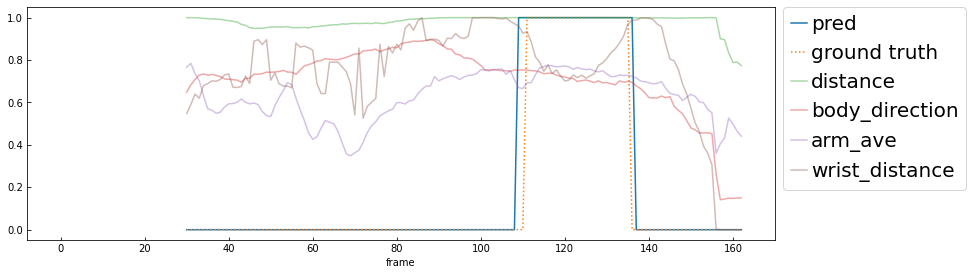

08_002_09_72_106


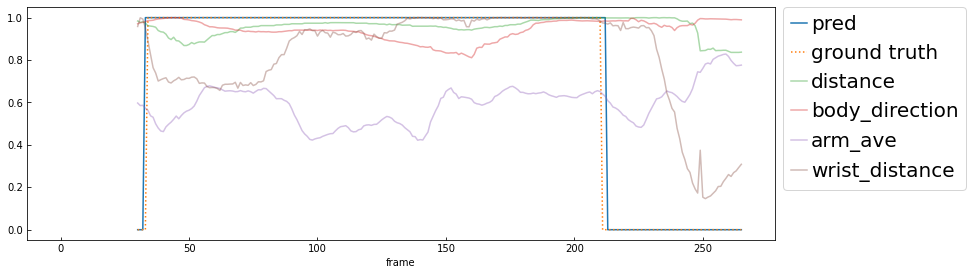

09_001_02_29_18


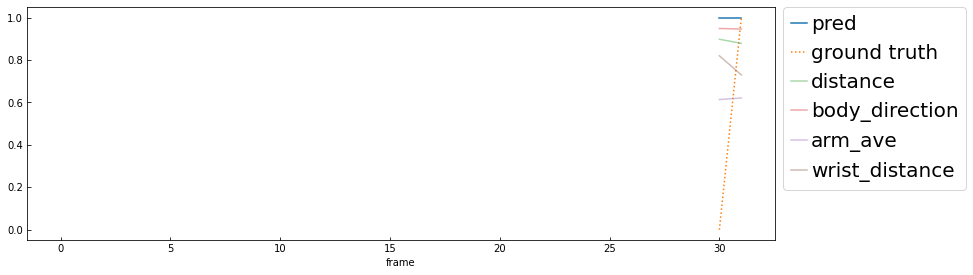

09_002_11_92_99


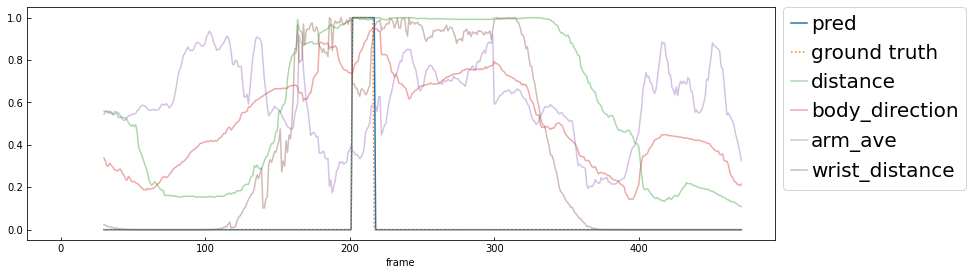

08_002_07_72_85


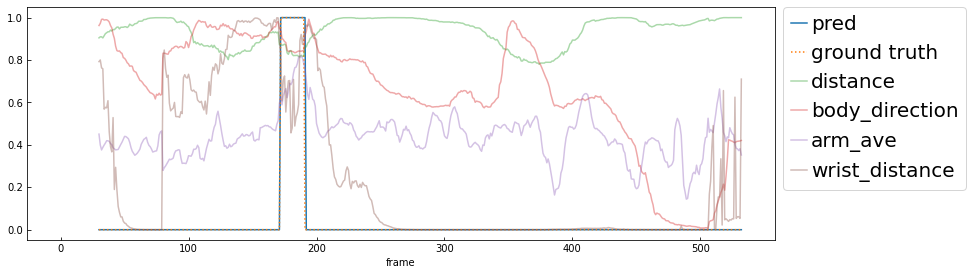

08_002_24_285_289


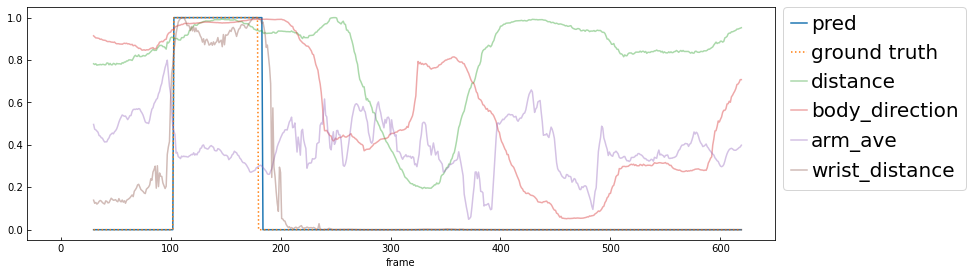

08_001_29_311_312


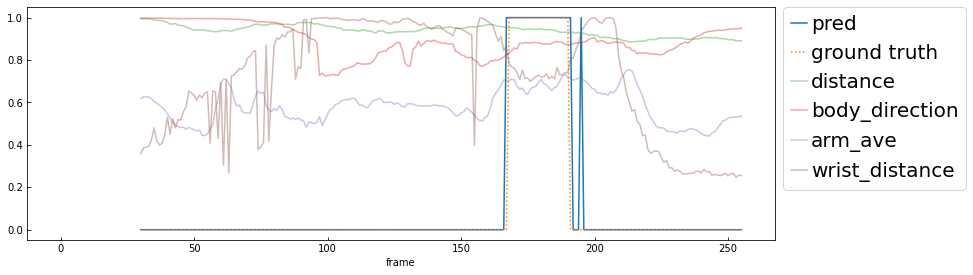

08_001_12_132_134


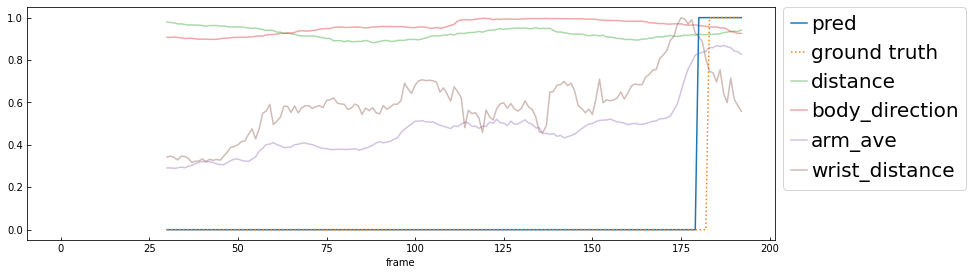

08_002_45_446_480


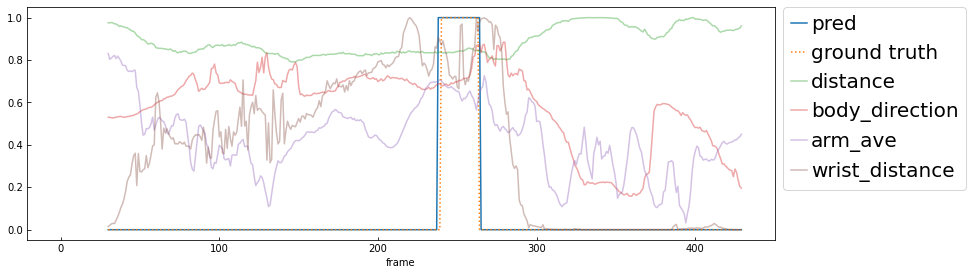

02_001_11_134_140


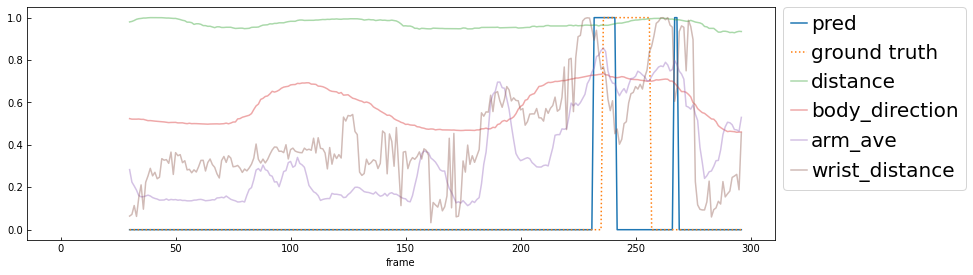

09_001_07_92_96


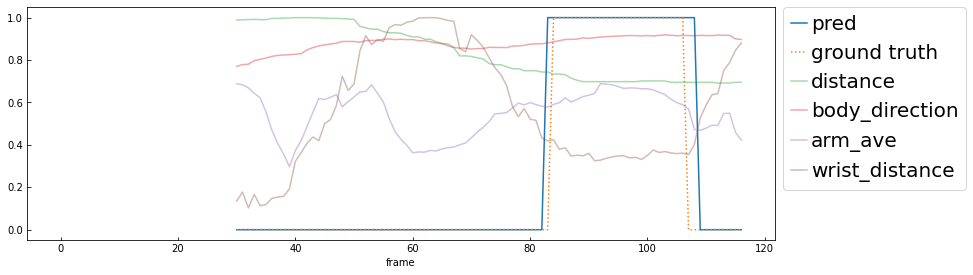

08_001_33_347_348


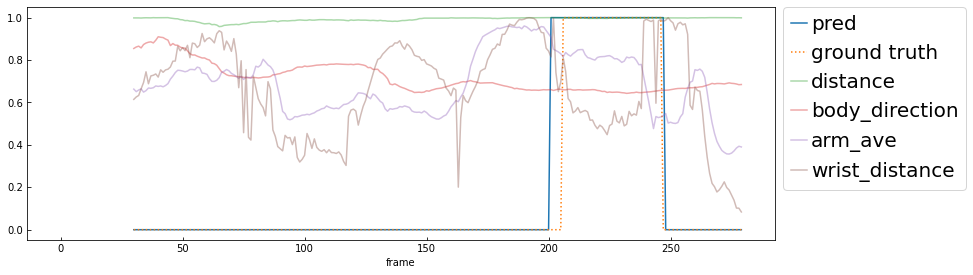

08_002_40_439_446


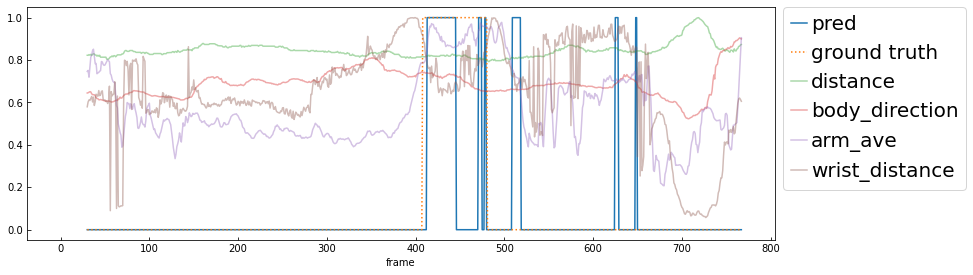

07_001_24_370_375


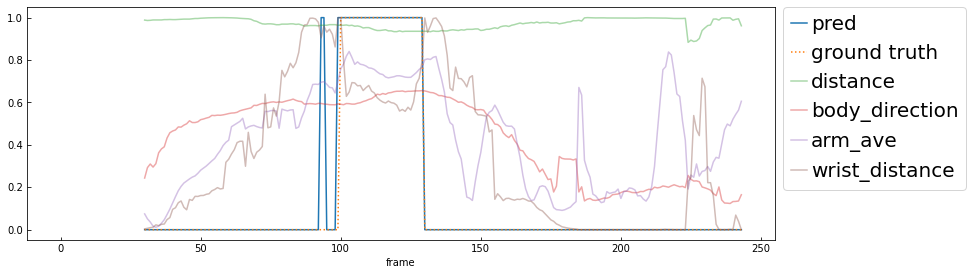

08_002_23_266_279


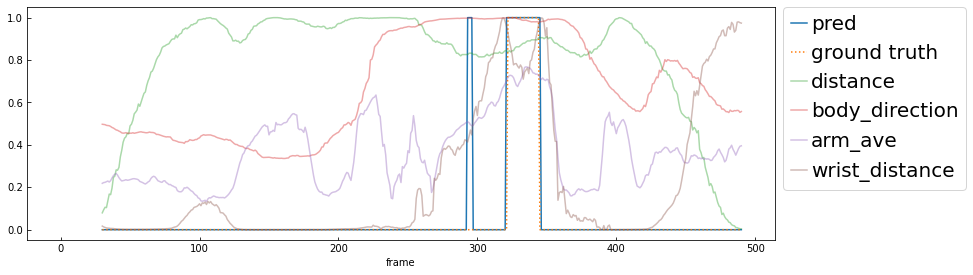

08_002_08_72_98


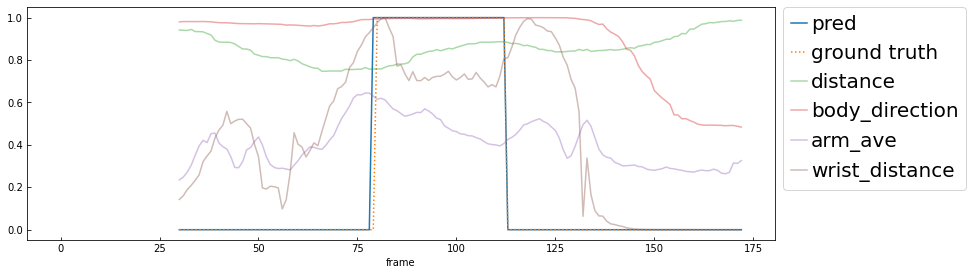

07_001_02_20_18


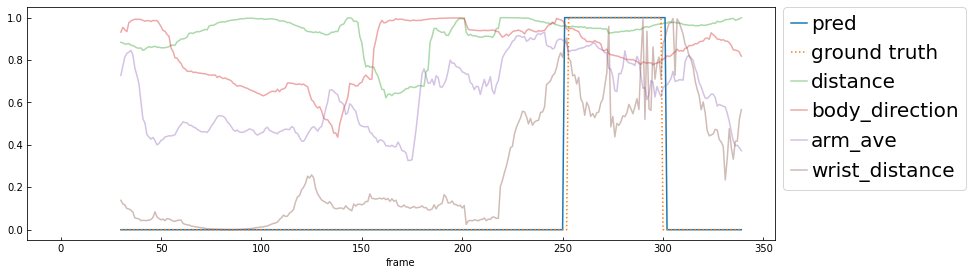

08_002_27_302_328


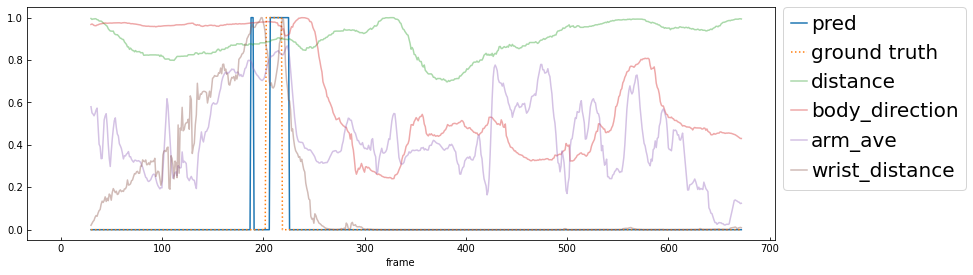

07_001_07_116_121


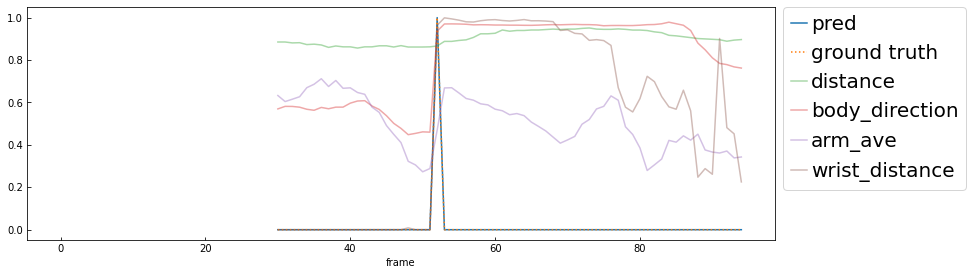

07_001_34_506_505


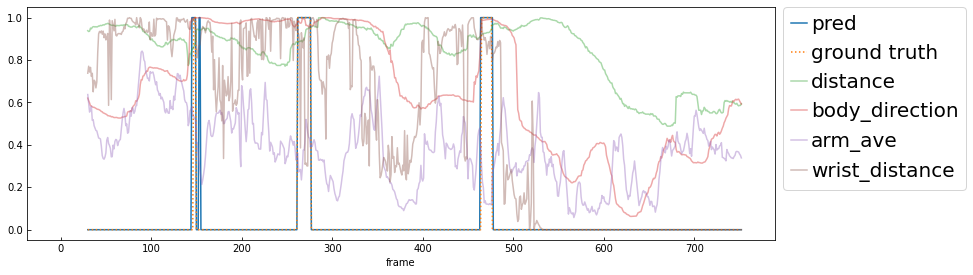

02_001_09_97_104


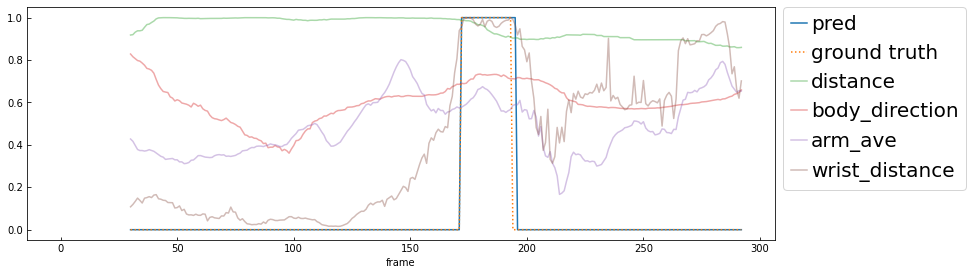

07_001_50_684_672


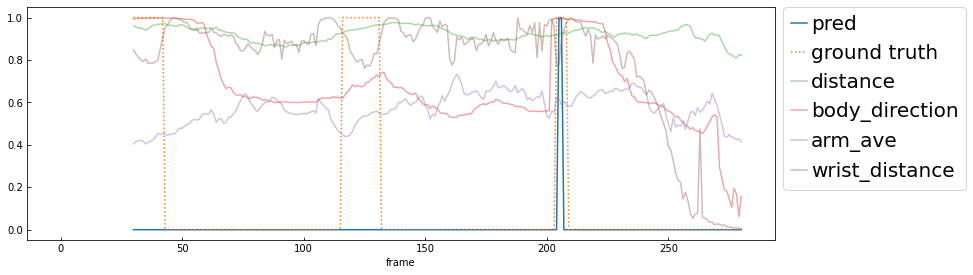

02_001_02_10_11


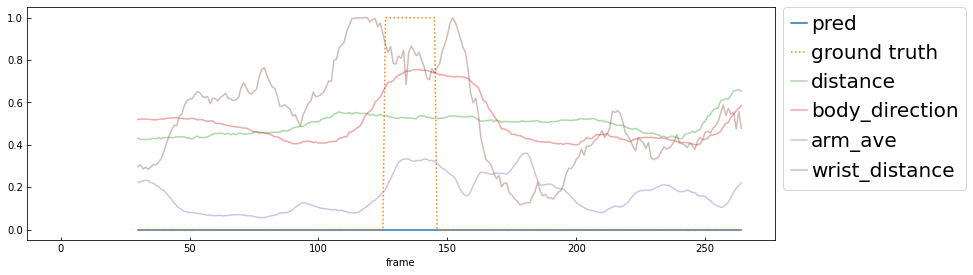

07_001_04_58_50


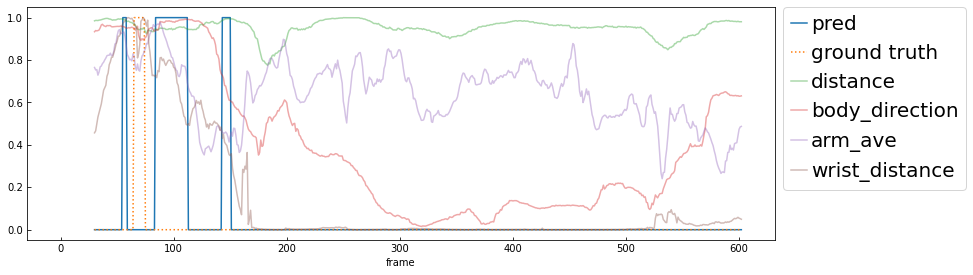

09_002_18_196_193


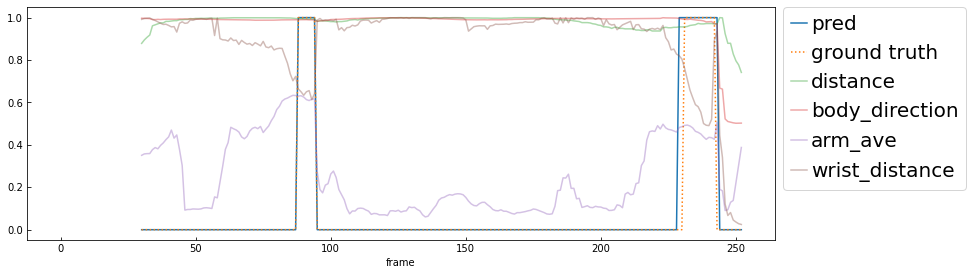

08_001_10_97_99


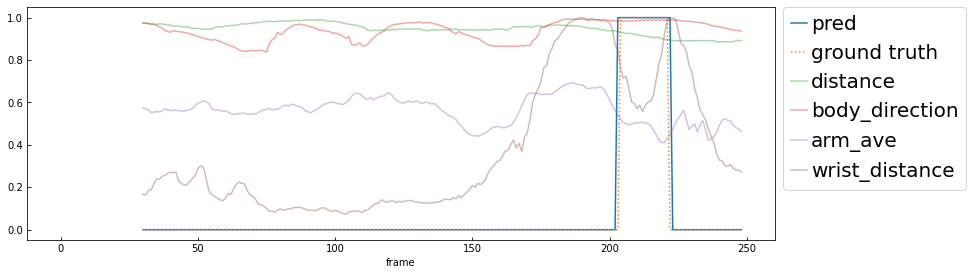

08_001_39_407_401


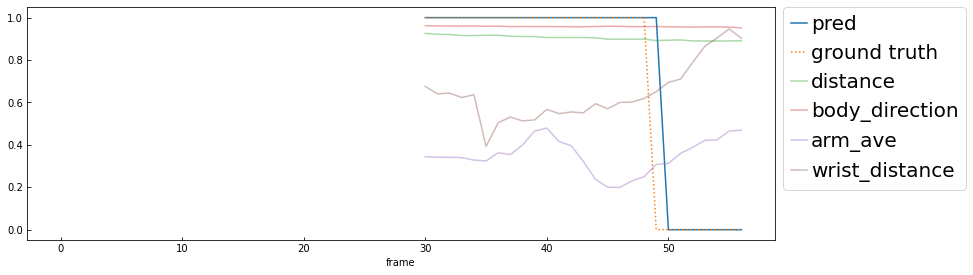

08_002_03_37_41


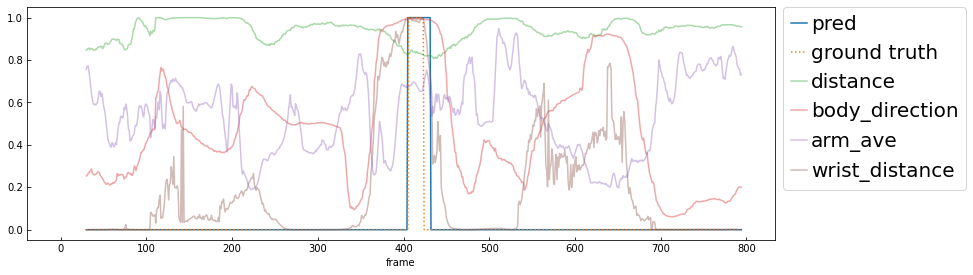

02_001_08_81_85


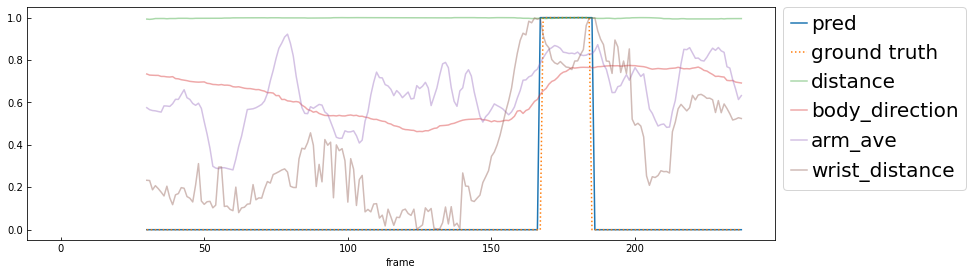

08_002_30_351_353


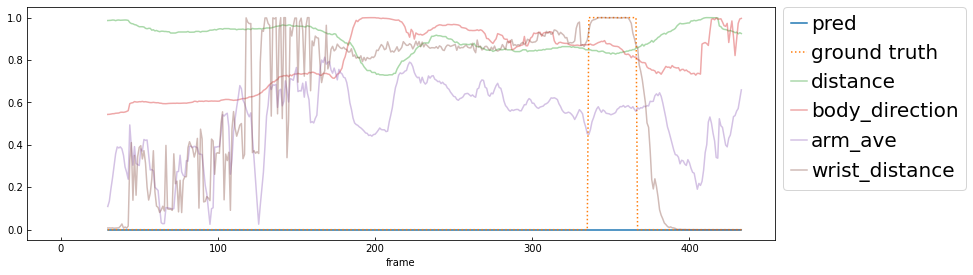

08_002_28_302_333


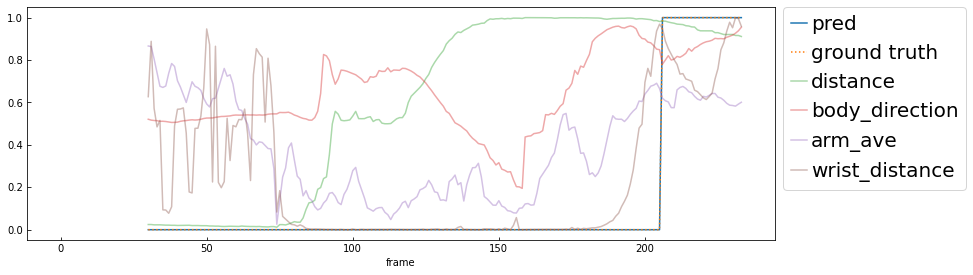

08_001_41_418_419


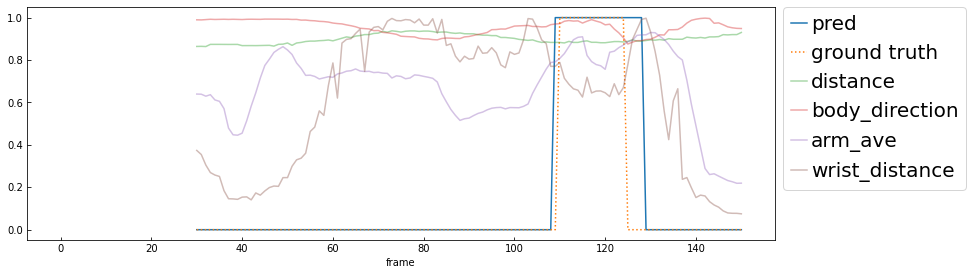

08_002_35_403_404


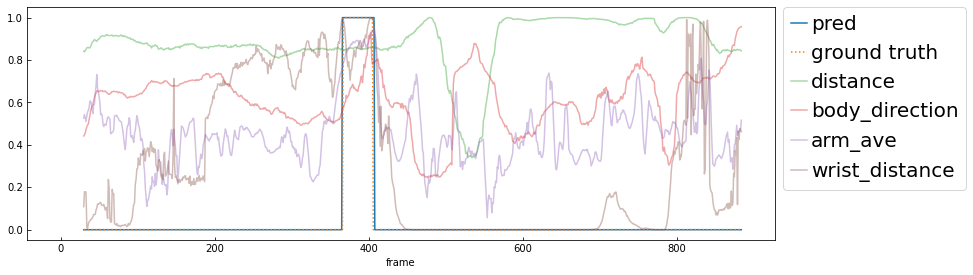

07_001_20_304_333


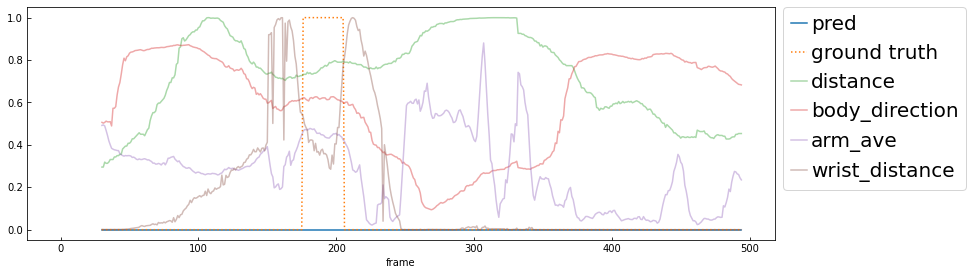

08_002_14_154_159


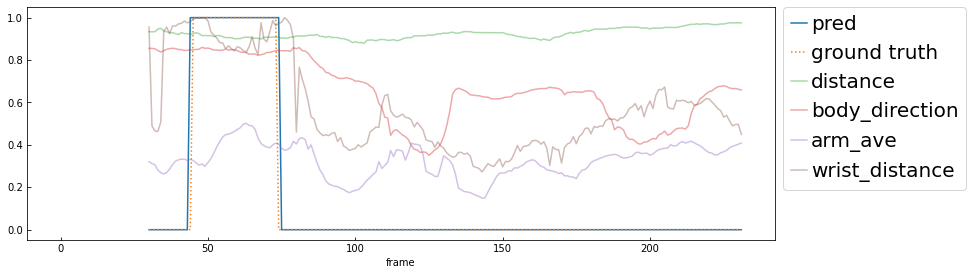

08_002_20_229_249


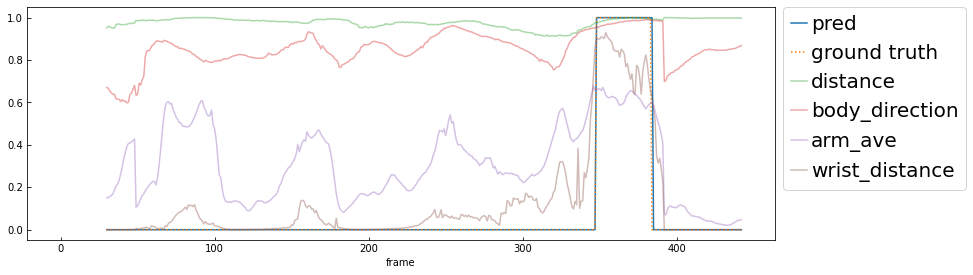

02_001_04_43_42


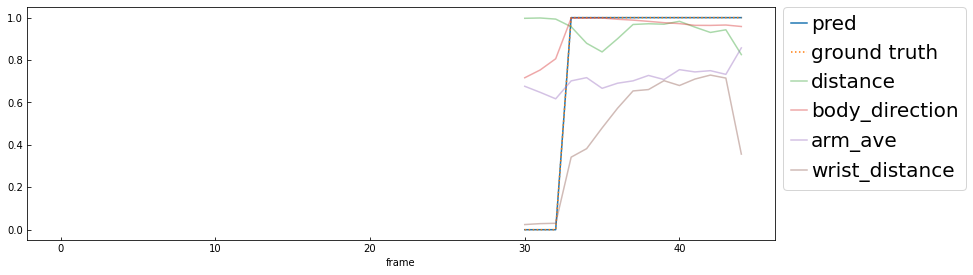

09_002_10_99_101


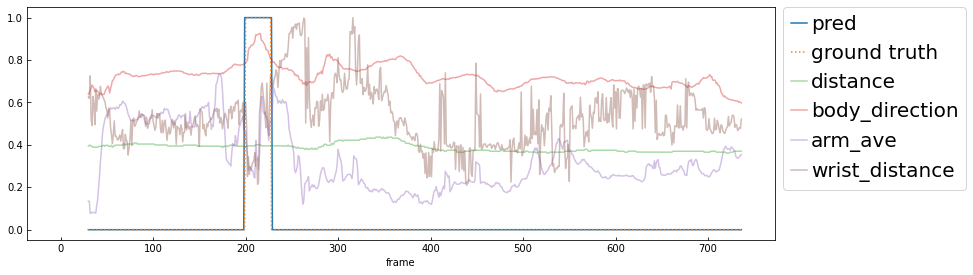

09_001_09_114_116


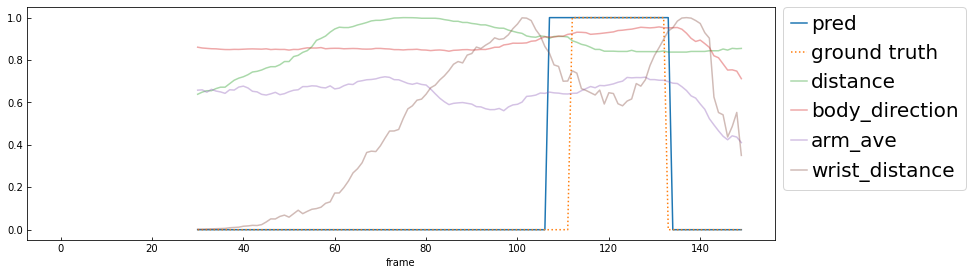

08_002_22_269_266


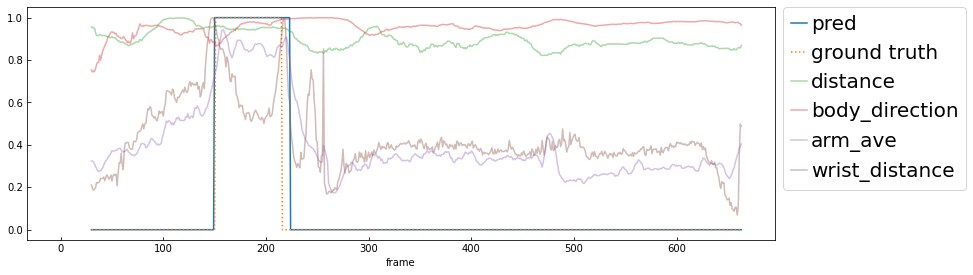

07_001_49_663_672


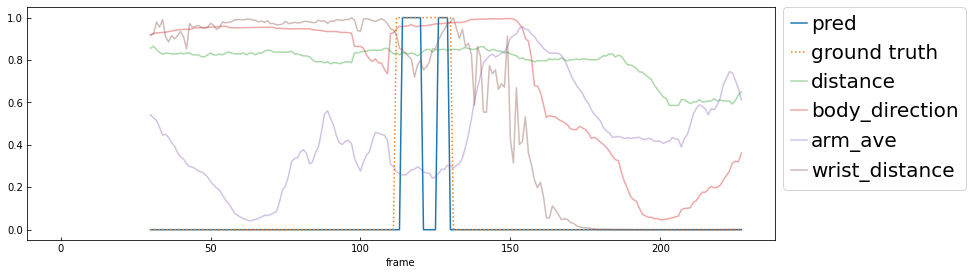

07_001_26_404_405


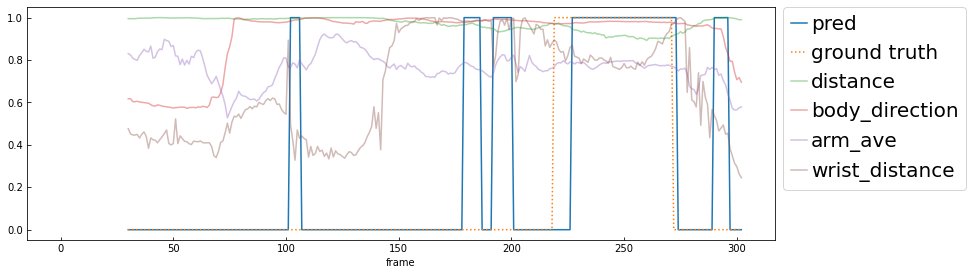

02_001_05_47_51


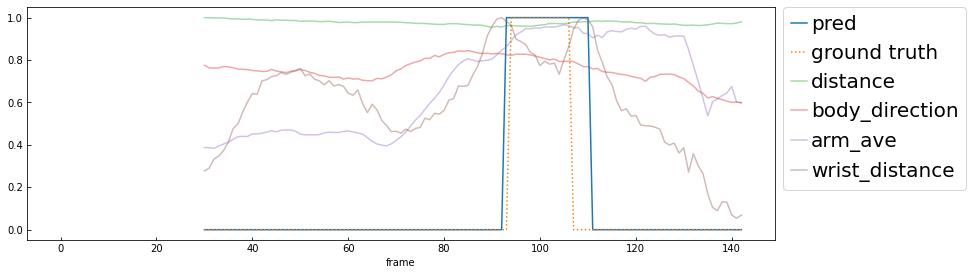

08_001_30_316_317


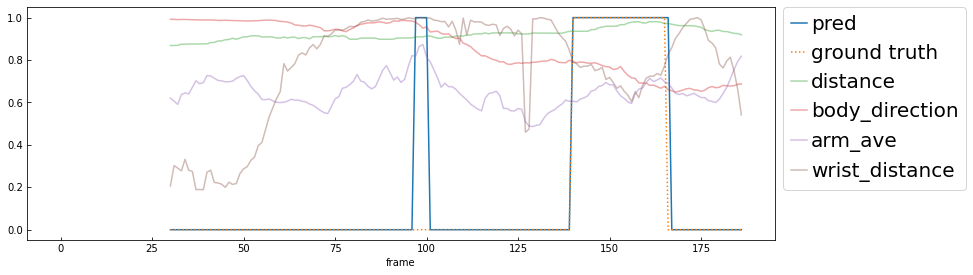

08_001_11_111_112


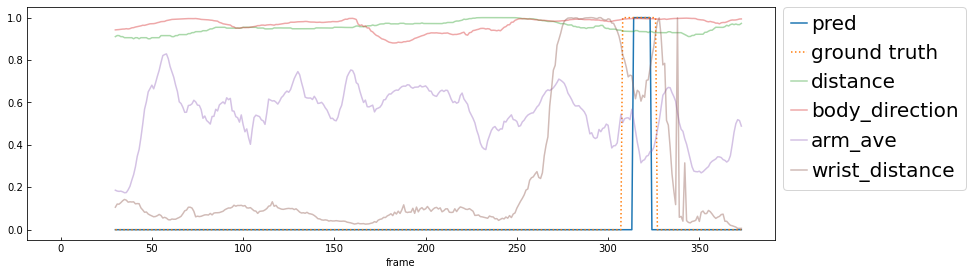

08_002_46_446_480


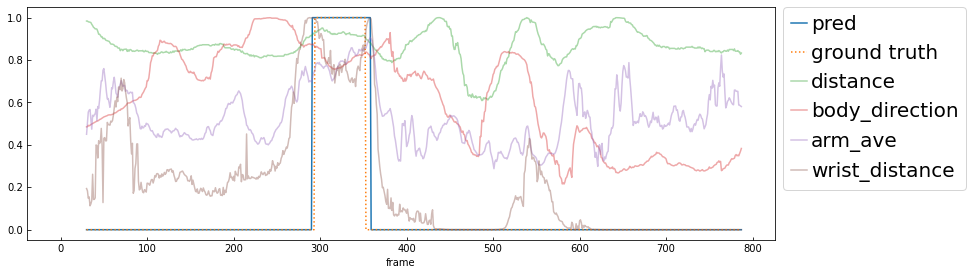

08_002_33_362_344


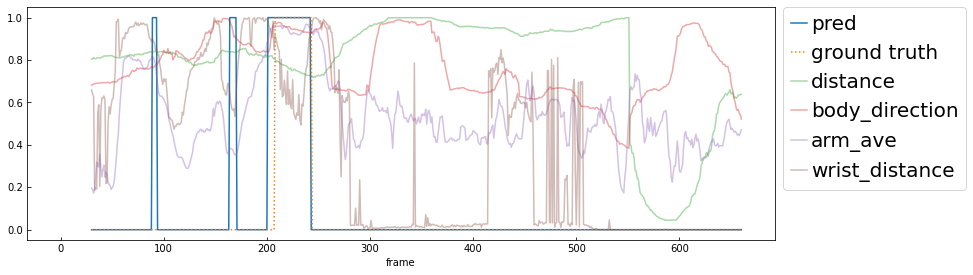

07_001_17_265_285


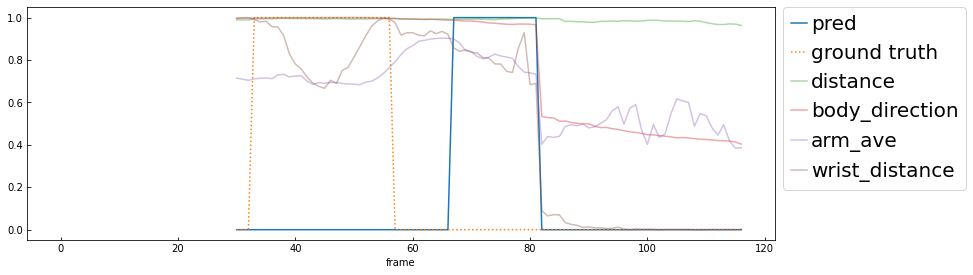

07_001_42_617_623


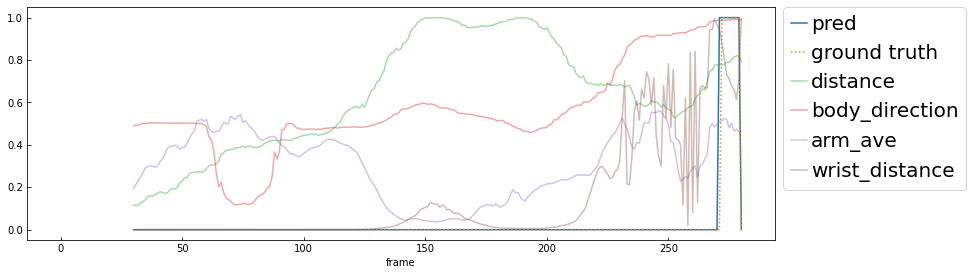

09_001_02_18_29


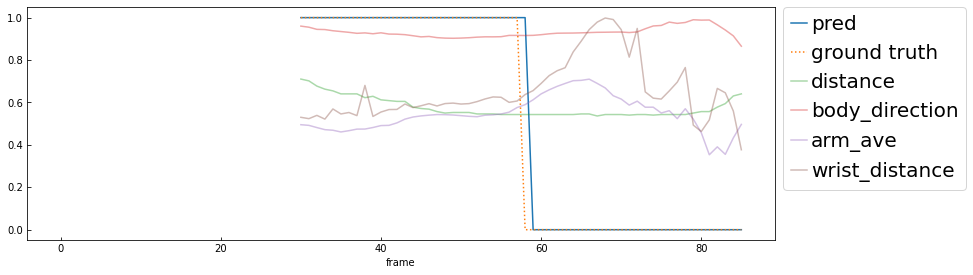

08_001_21_221_223


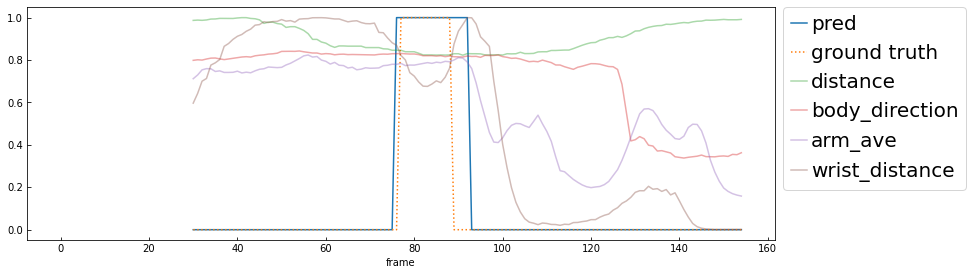

08_001_16_173_176


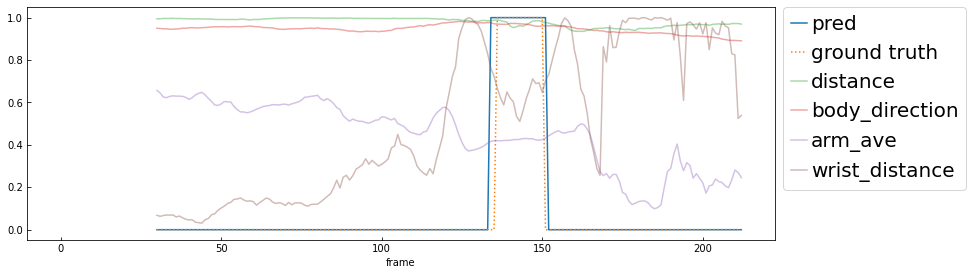

08_001_40_414_409


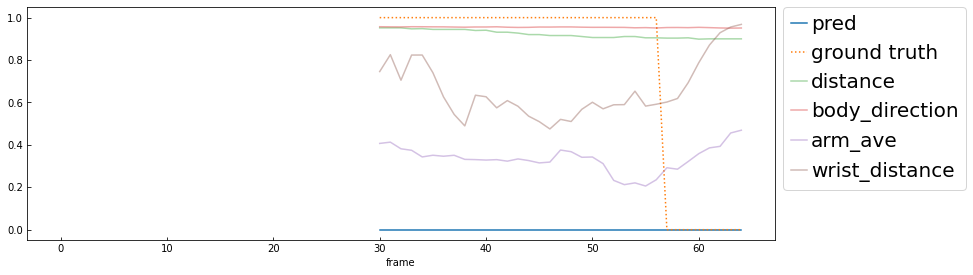

08_002_18_217_221


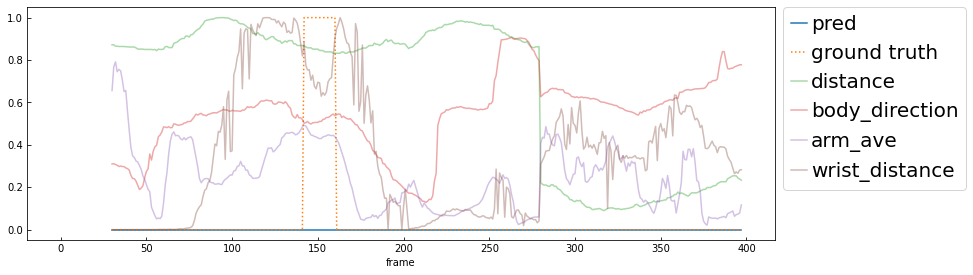

08_002_05_52_61


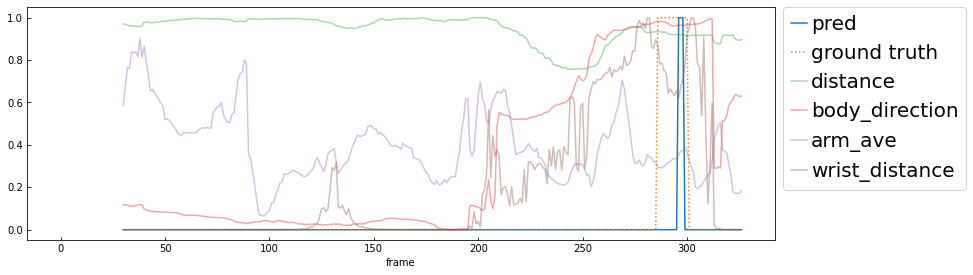

08_001_01_3_6


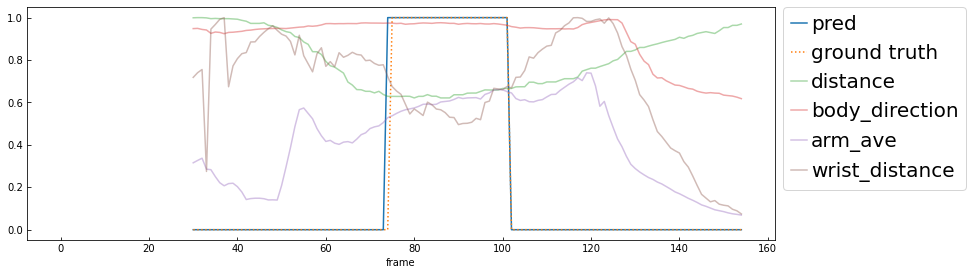

08_002_32_362_344


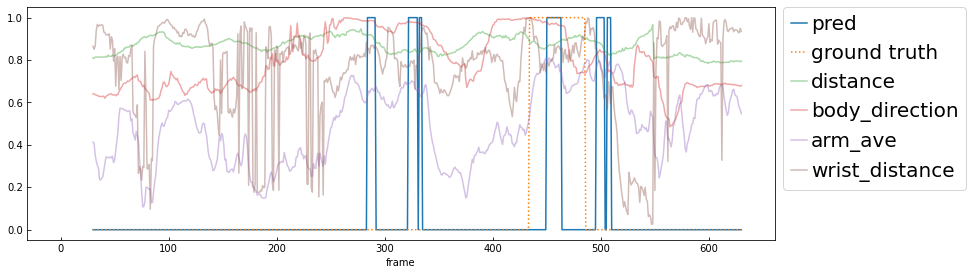

07_001_05_54_79


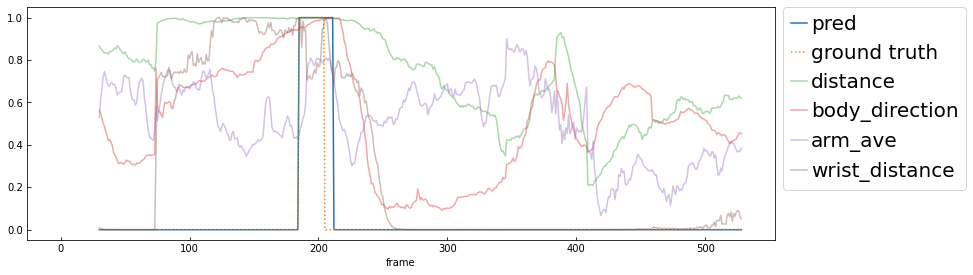

07_001_21_297_317


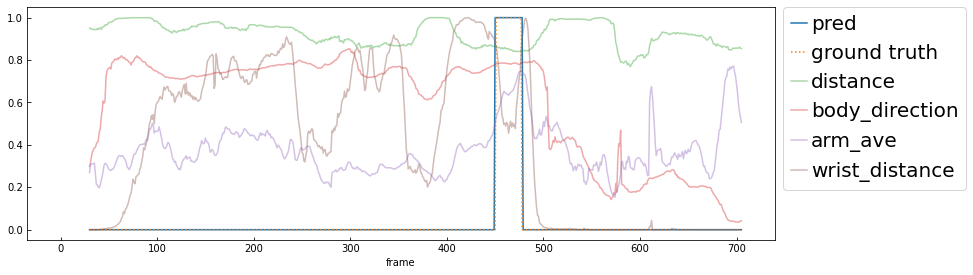

09_001_08_102_105


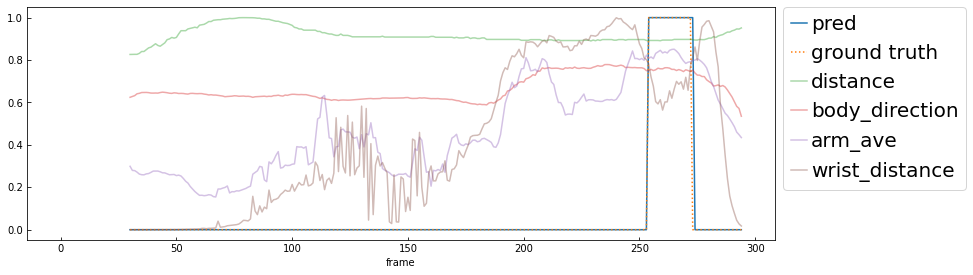

02_001_22_289_295


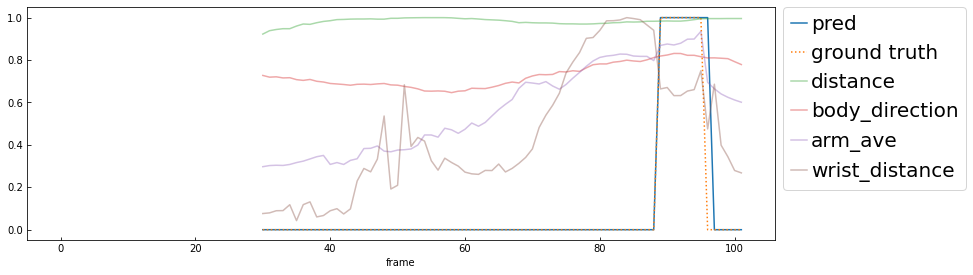

07_001_39_543_588


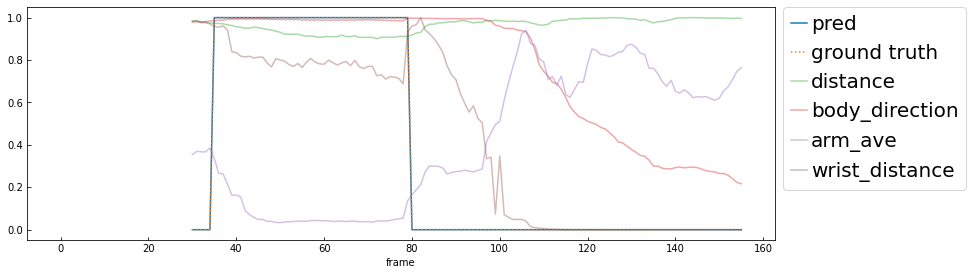

08_001_18_189_191


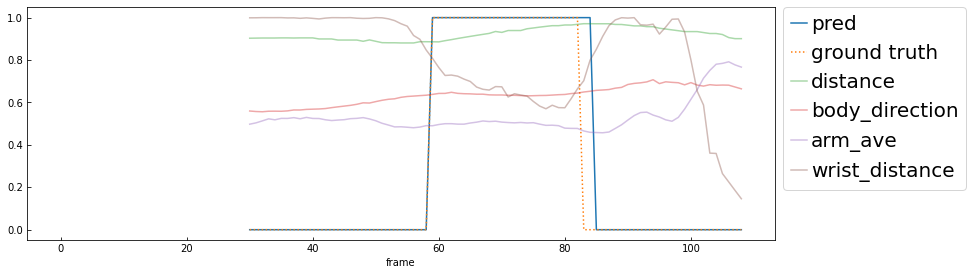

09_002_06_63_50


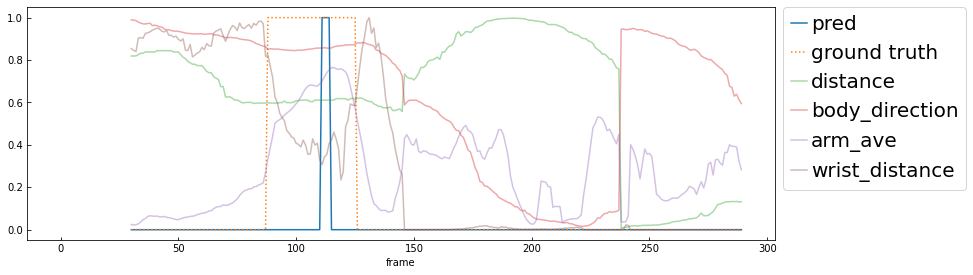

08_001_38_392_393


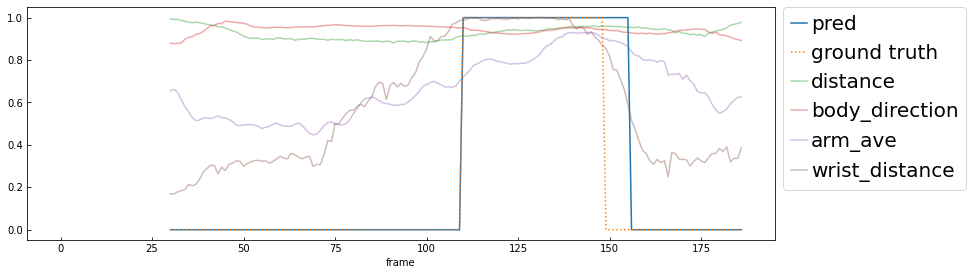

08_002_38_403_404


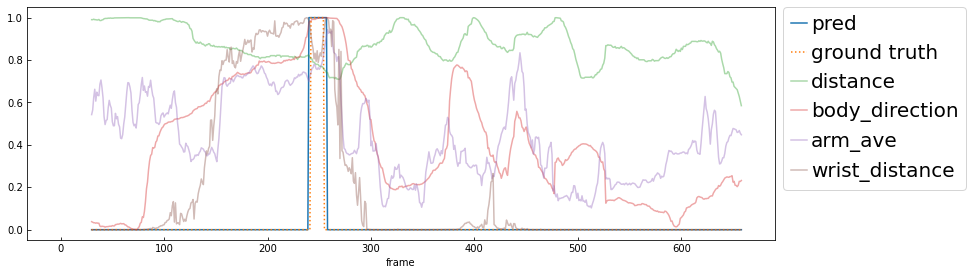

08_002_06_71_72


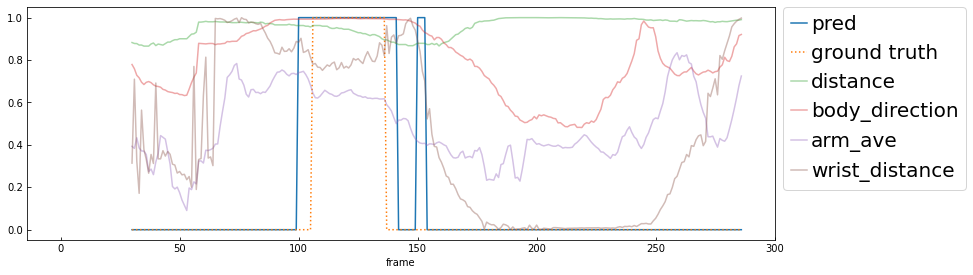

08_001_36_376_377


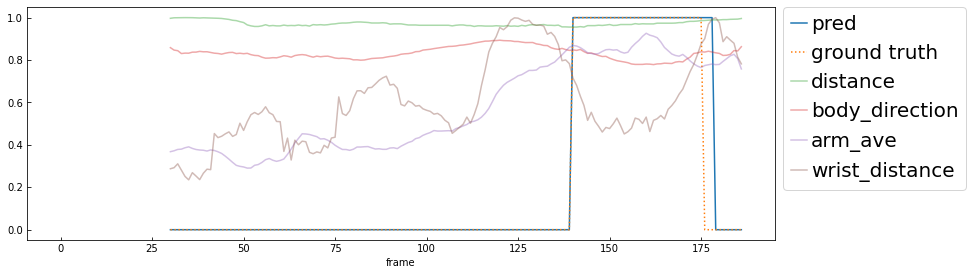

07_001_13_217_219


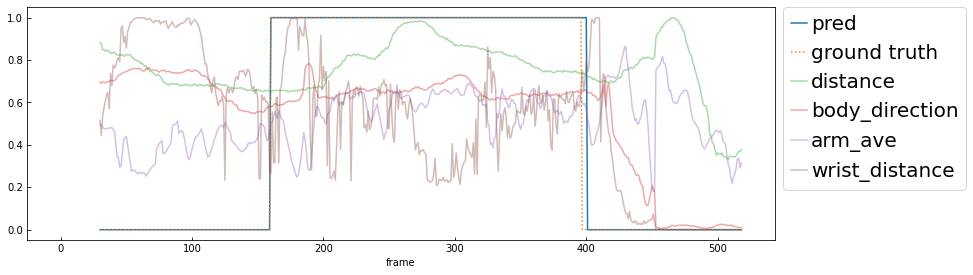

07_001_31_476_461


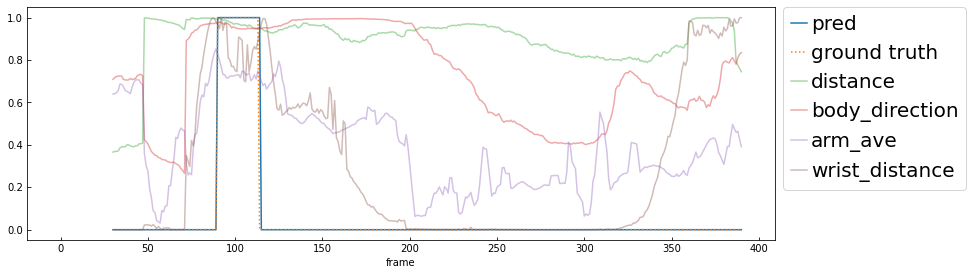

09_001_01_1_8


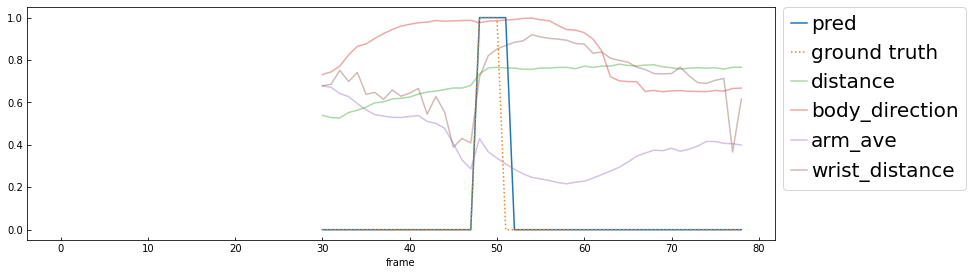

07_001_16_267_252


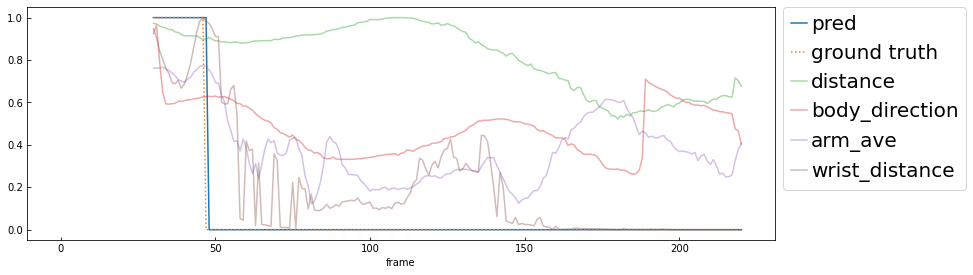

07_001_39_588_543


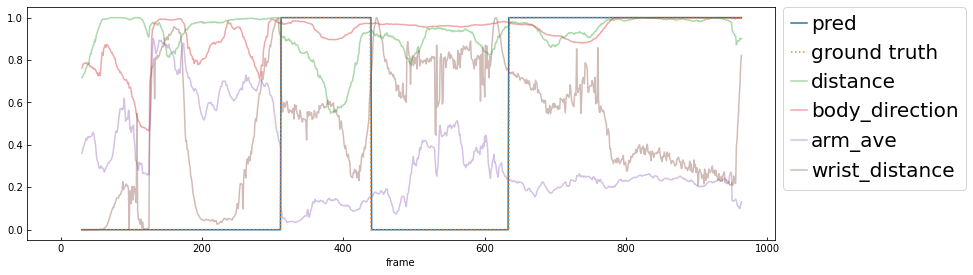

08_002_04_52_50


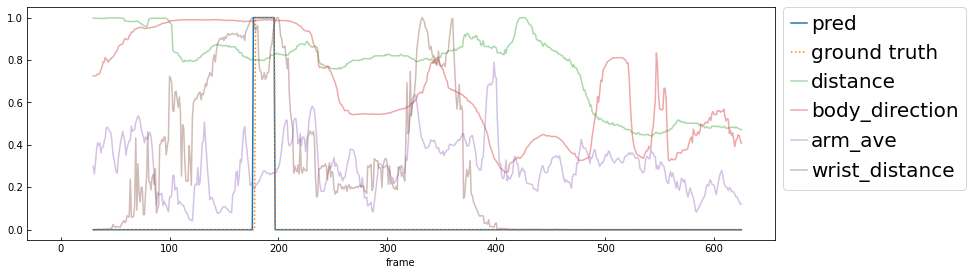

09_002_04_28_26


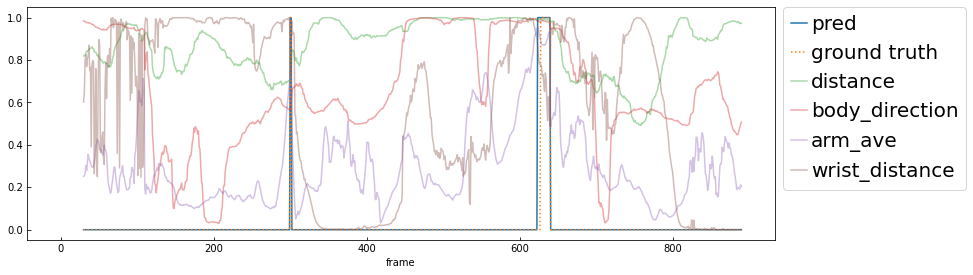

08_002_29_344_333


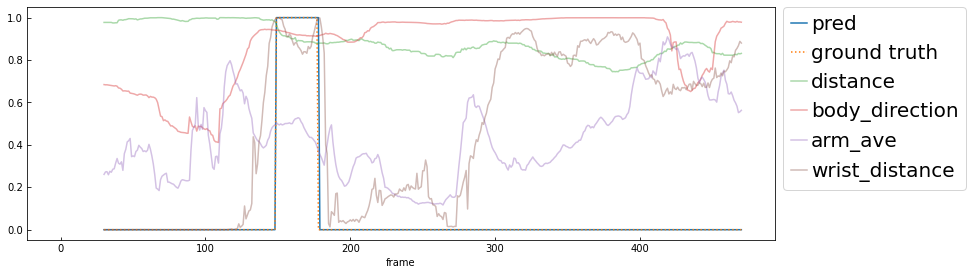

02_001_02_10_13


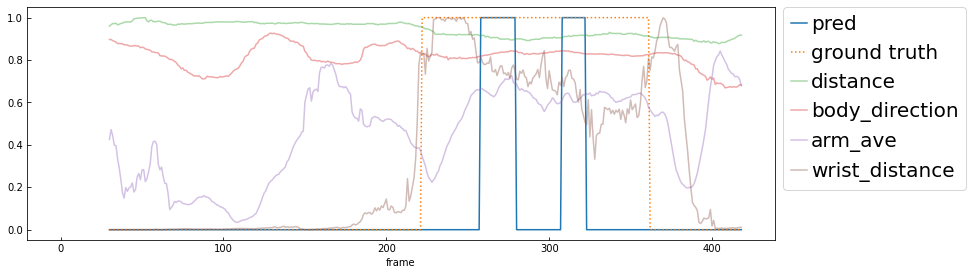

07_001_43_632_633


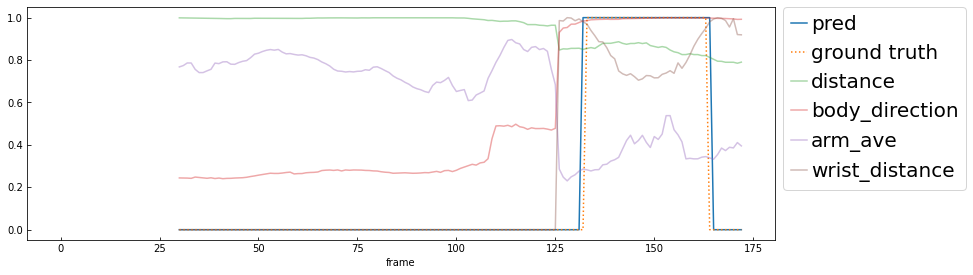

07_001_26_405_415


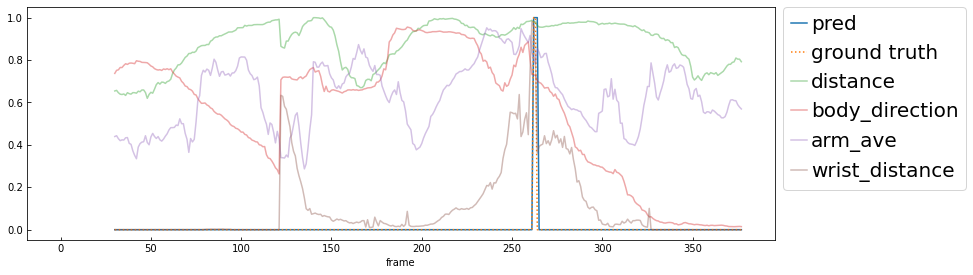

07_001_28_429_425


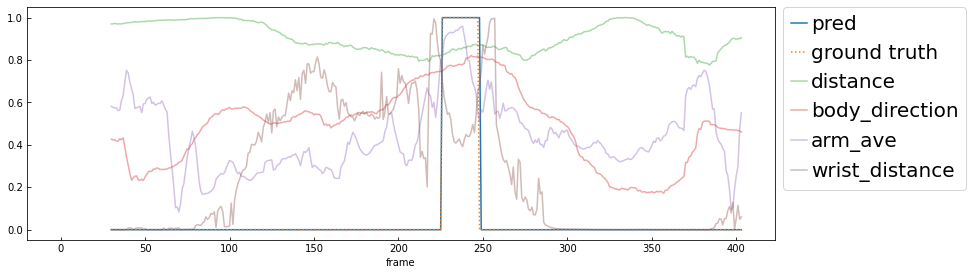

08_002_26_302_308


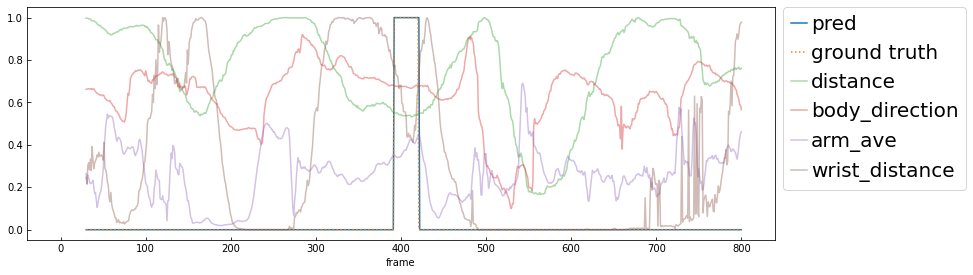

08_001_17_182_183


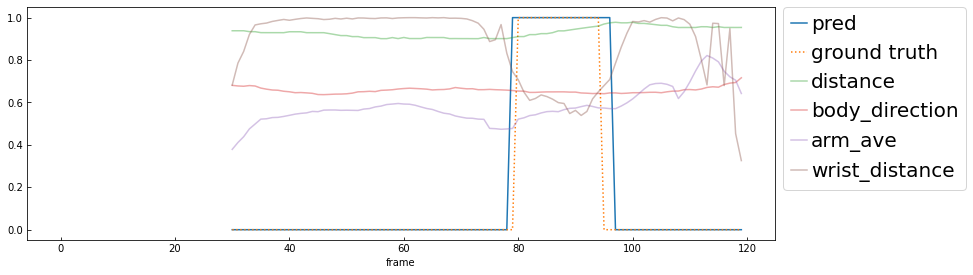

08_002_01_10_7


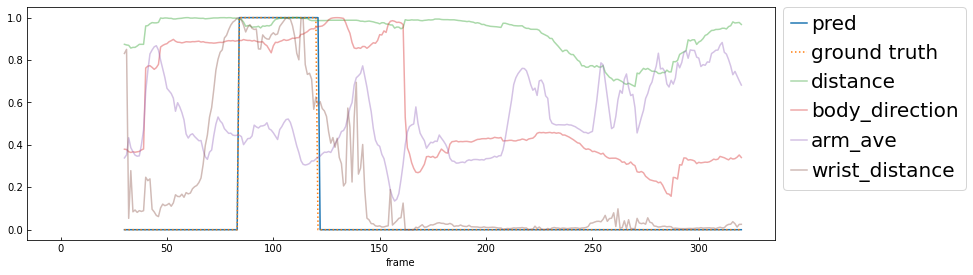

07_001_14_232_230


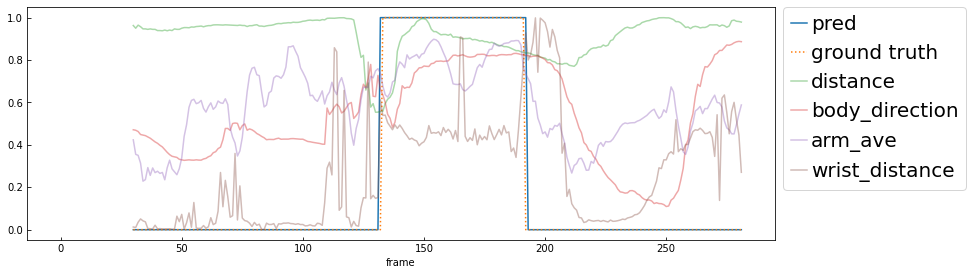

02_001_10_125_119


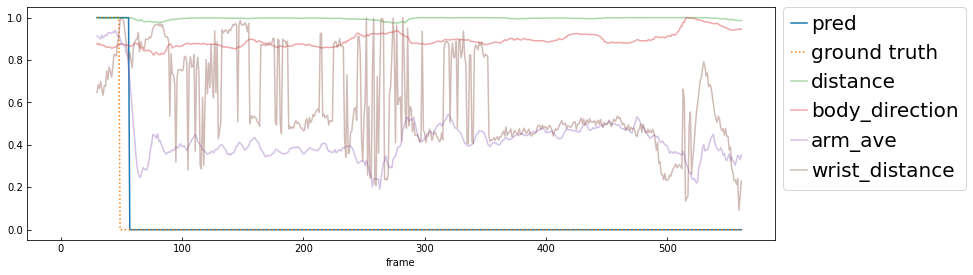

08_002_25_302_297


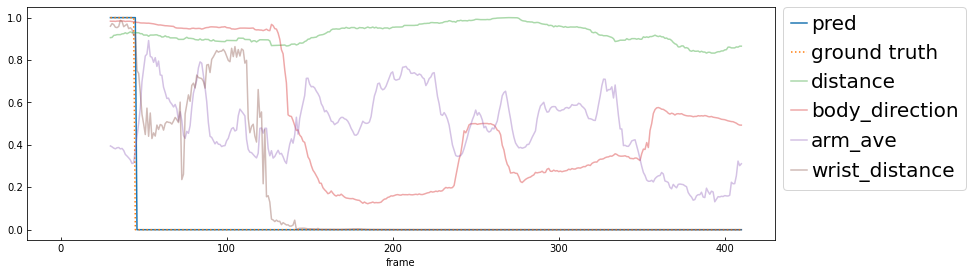

07_001_07_121_116


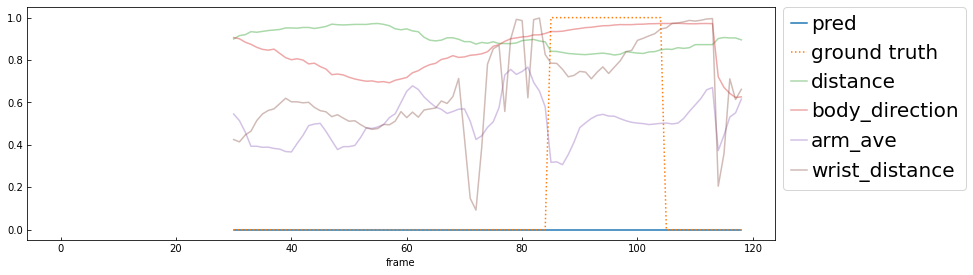

07_001_11_167_158


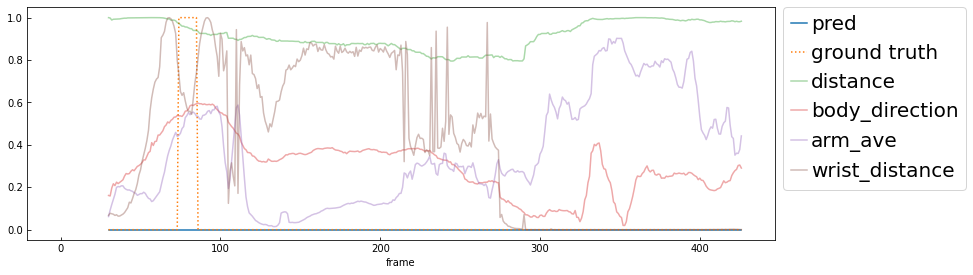

09_001_01_8_1


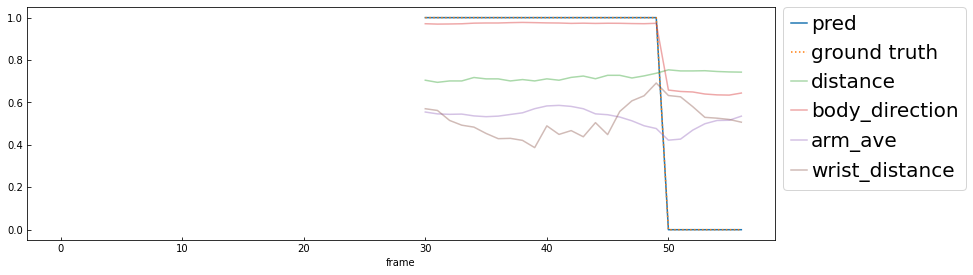

08_001_06_56_61


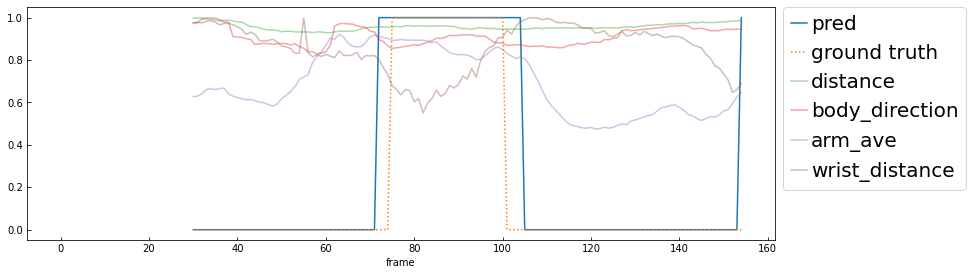

08_002_43_439_446


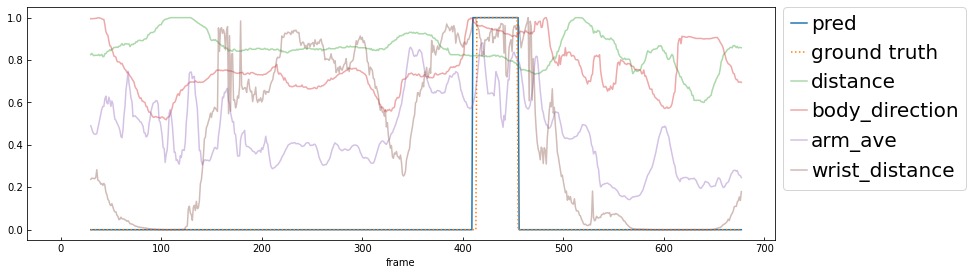

07_001_47_663_669


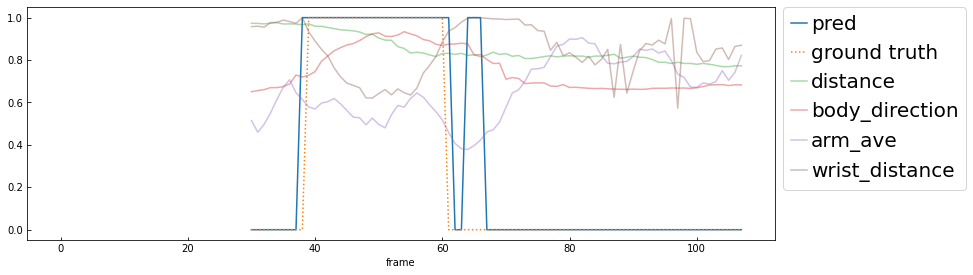

09_001_04_60_59


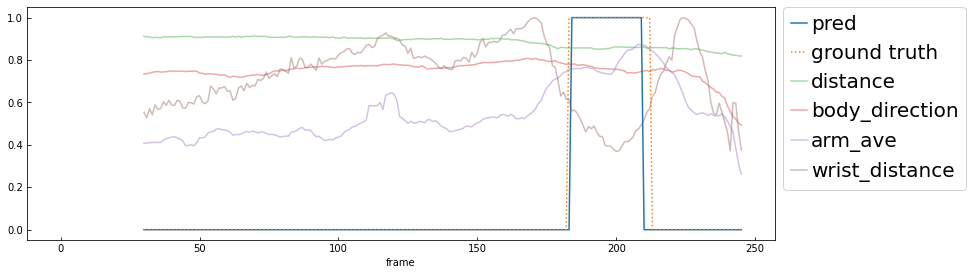

02_001_15_202_191


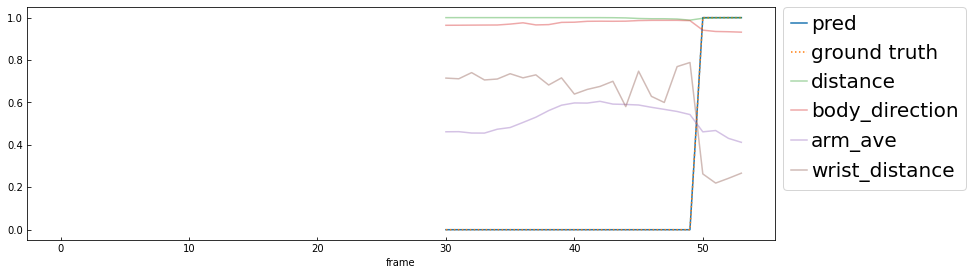

07_001_32_489_491


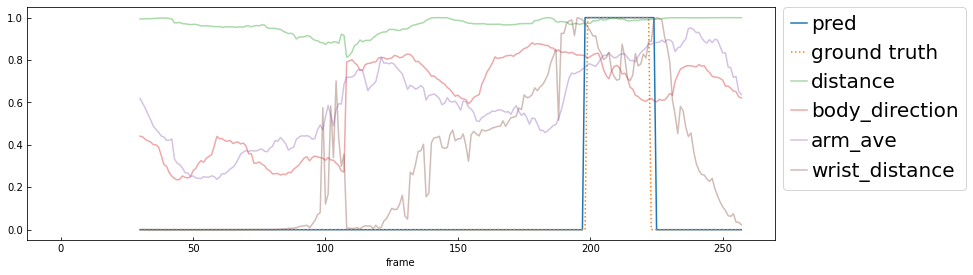

08_002_16_165_182


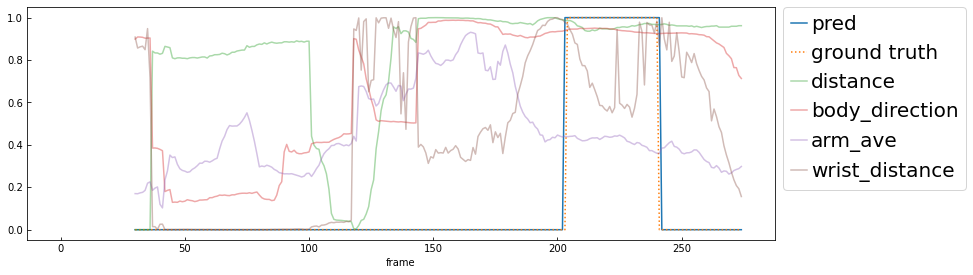

08_002_06_72_71


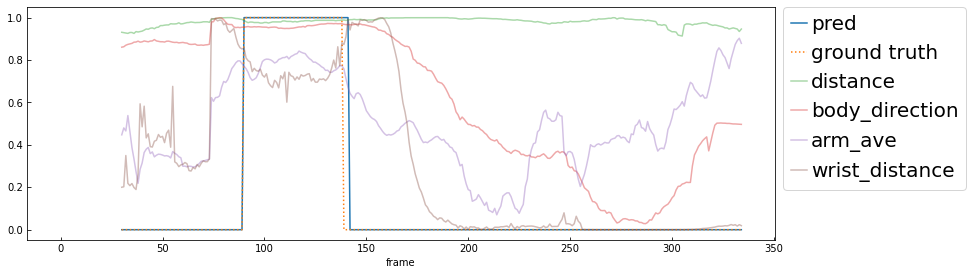

09_002_01_4_6


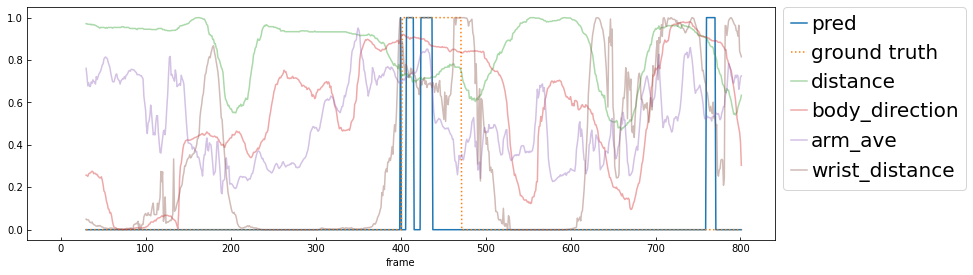

08_001_27_292_285


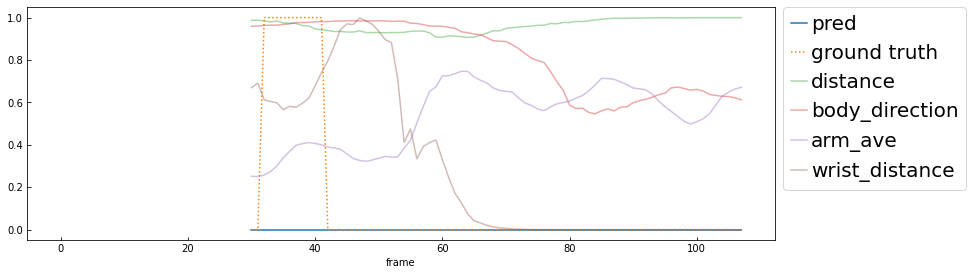

08_002_37_403_404


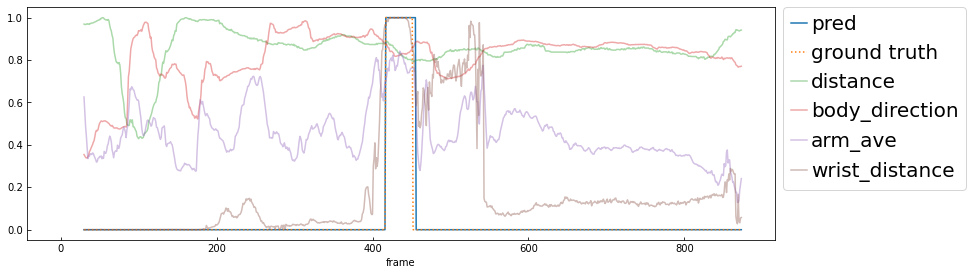

07_001_10_167_158


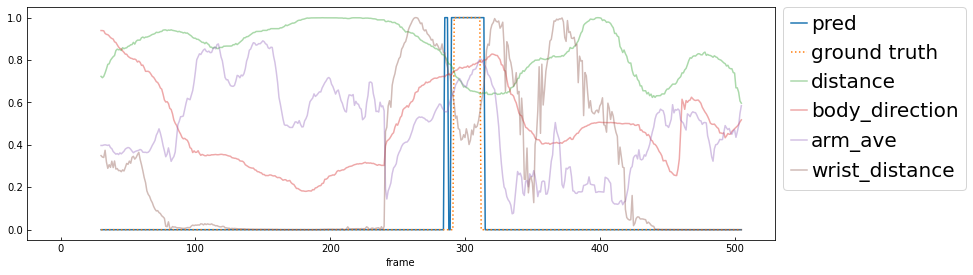

07_001_09_153_158


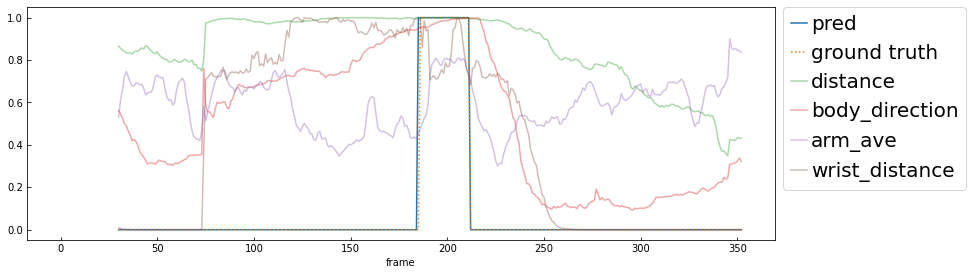

08_001_26_273_278


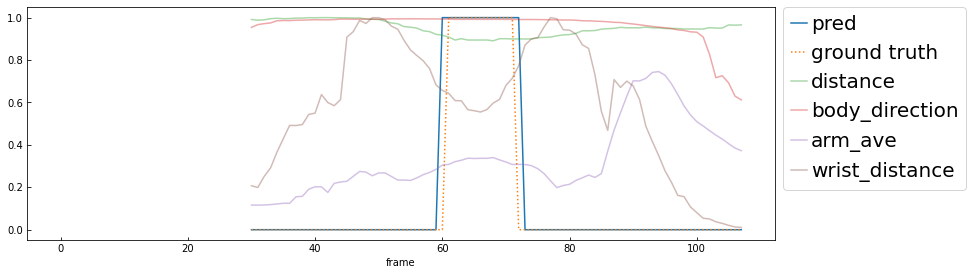

07_001_48_672_663


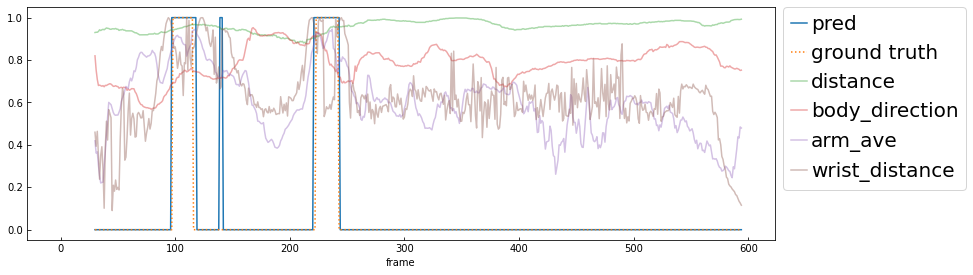

08_002_34_396_390


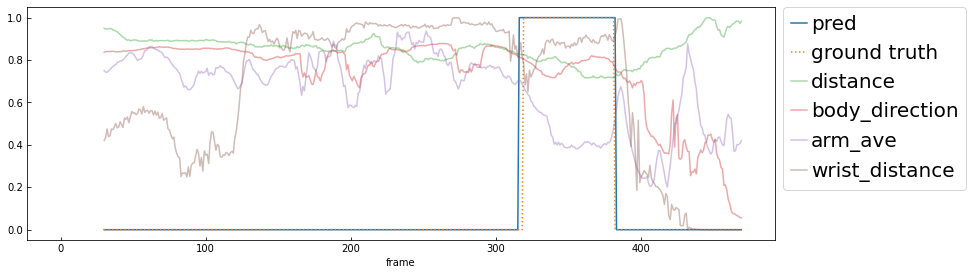

08_001_13_141_142


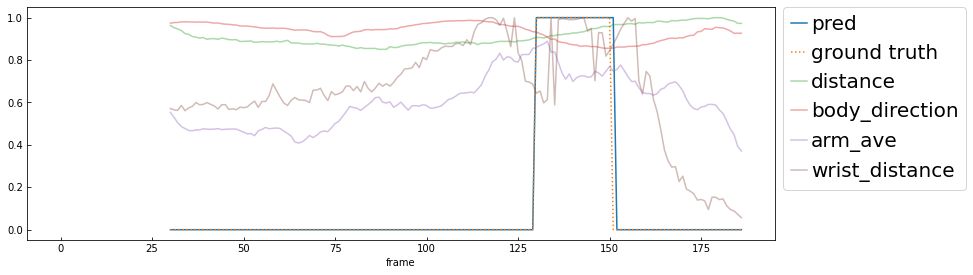

08_002_31_362_344


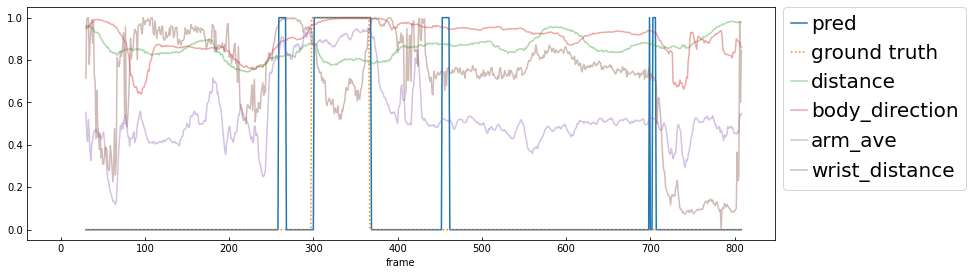

07_001_41_588_617


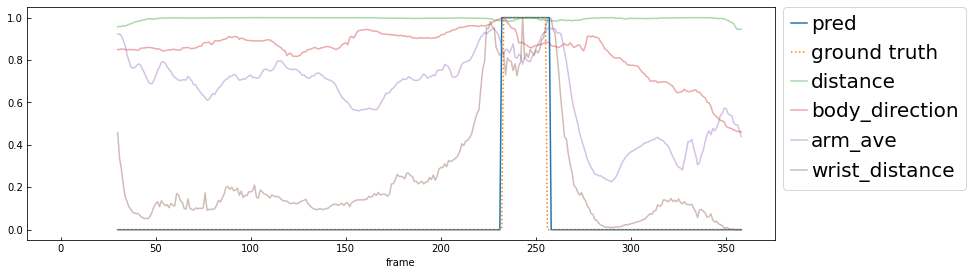

08_001_03_26_32


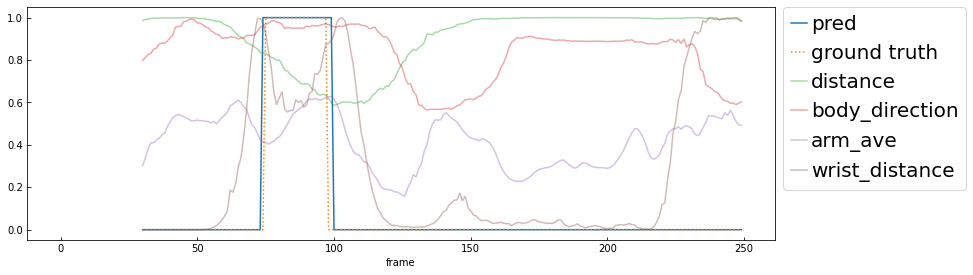

09_002_13_137_92


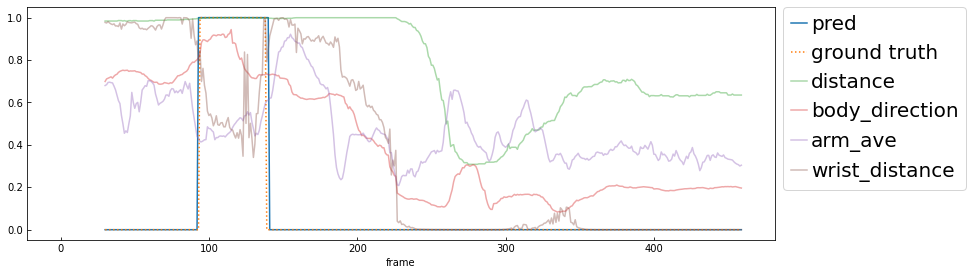

08_001_08_73_74


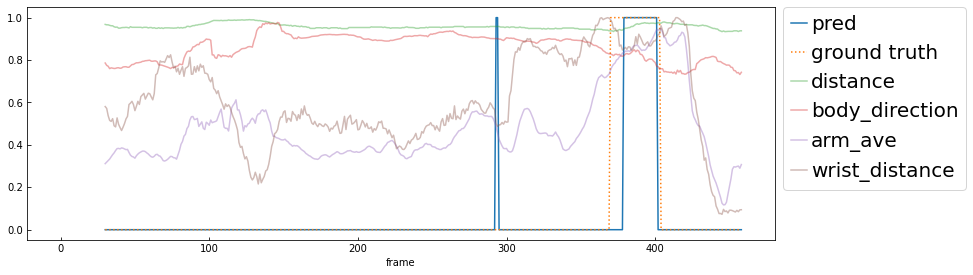

08_001_37_385_384


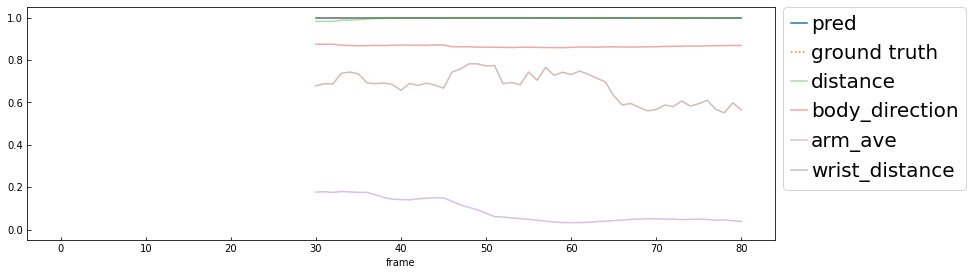

09_002_16_176_189


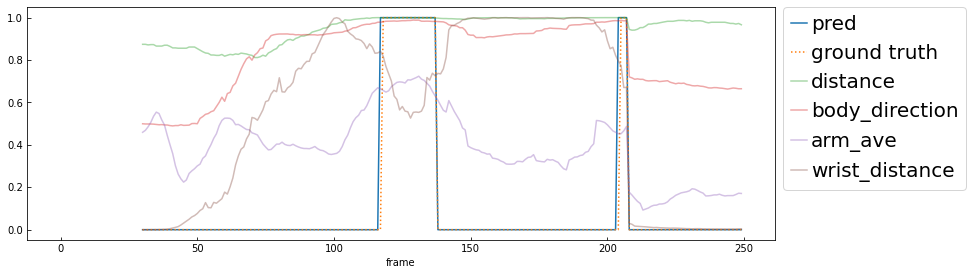

08_002_39_403_439


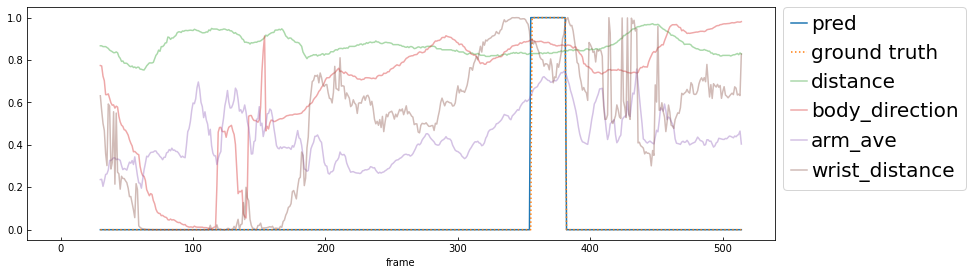

08_001_37_384_385


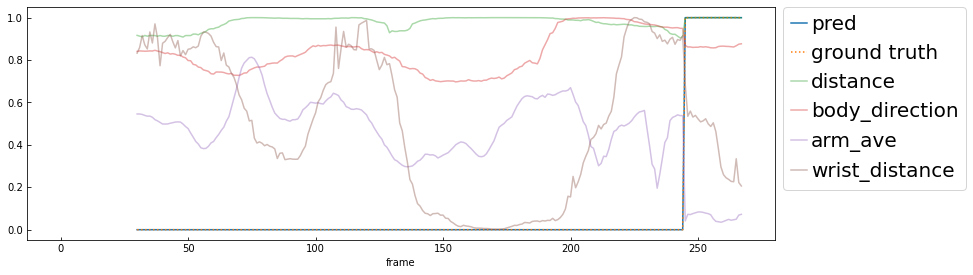

02_001_06_58_61


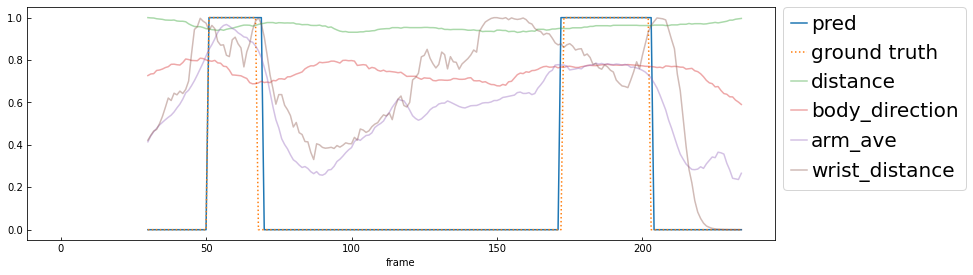

08_002_41_439_446


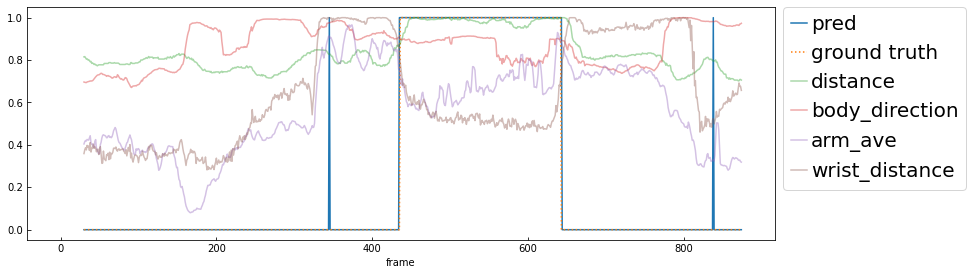

08_002_44_446_473


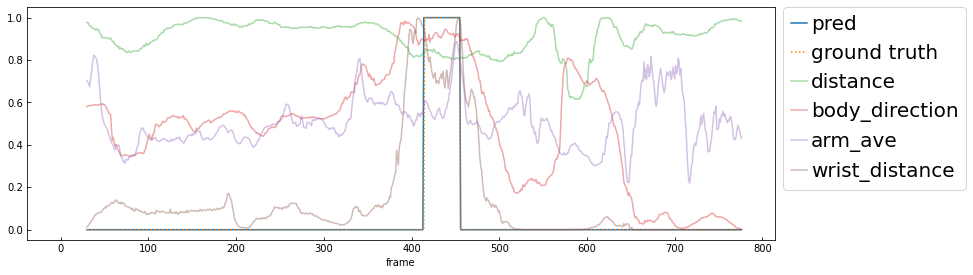

08_002_12_125_129


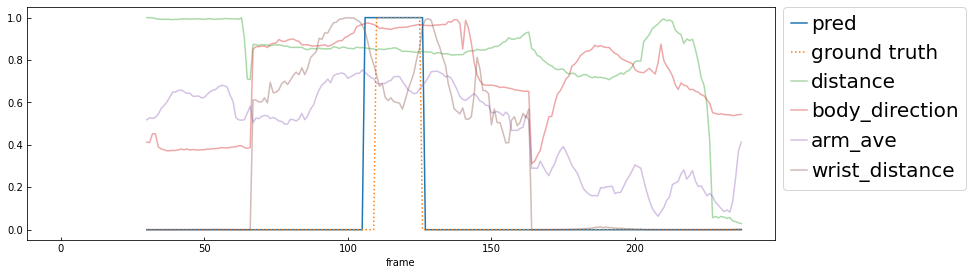

07_001_19_308_304


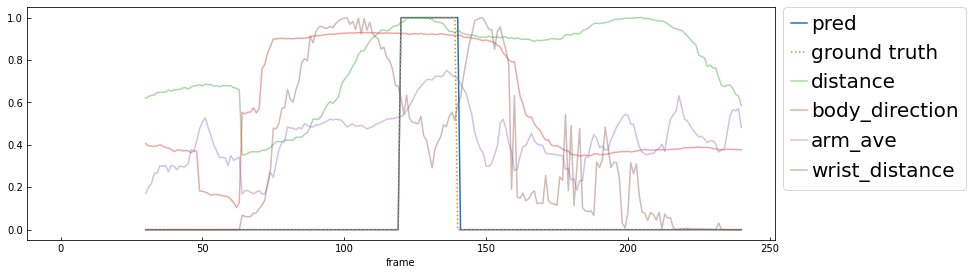

08_002_17_206_182


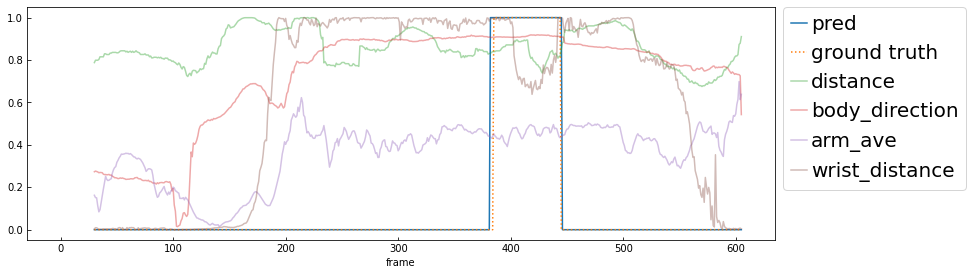

07_001_33_506_489


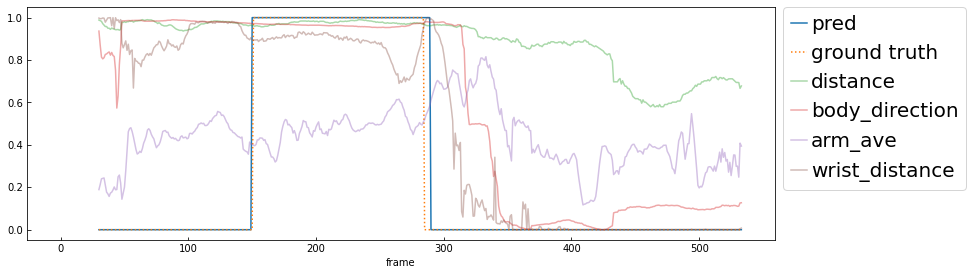

08_001_19_198_201


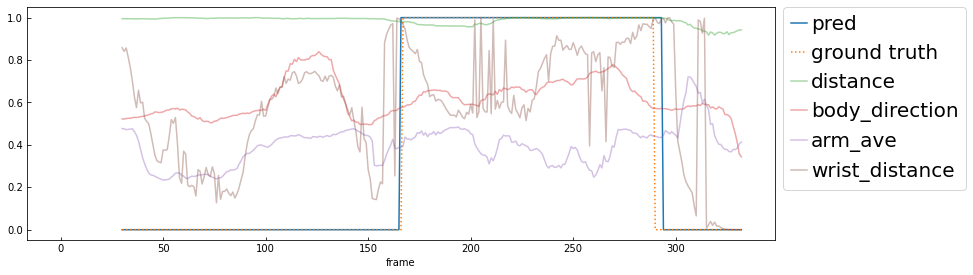

02_001_15_191_202


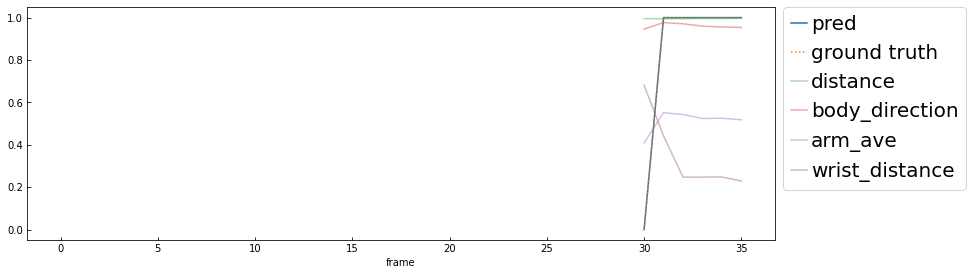

07_001_44_632_633


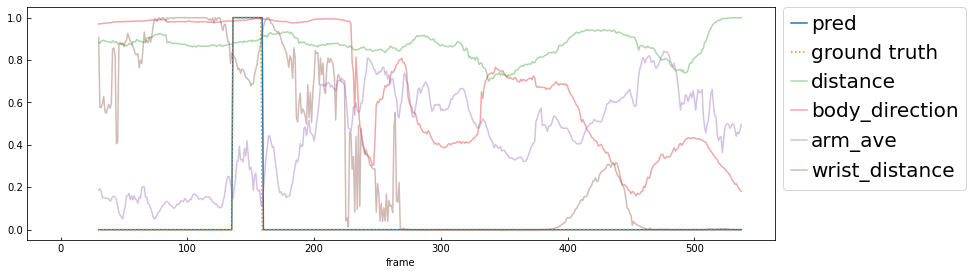

09_002_17_196_193


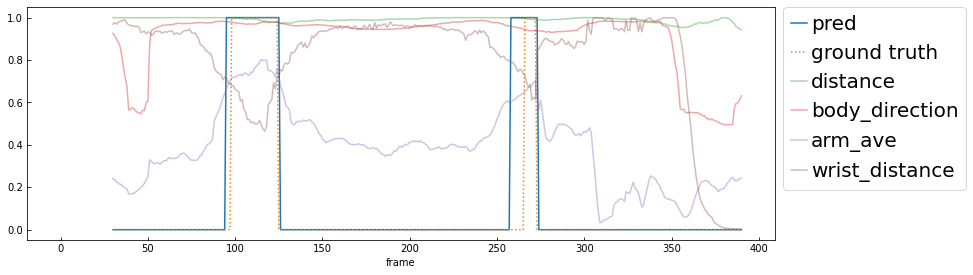

02_001_20_268_266


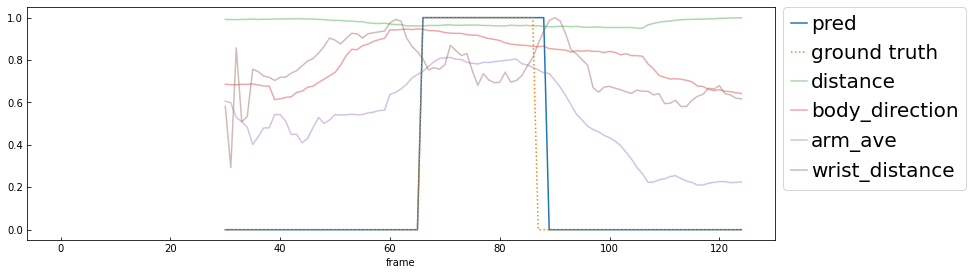

09_002_14_155_158


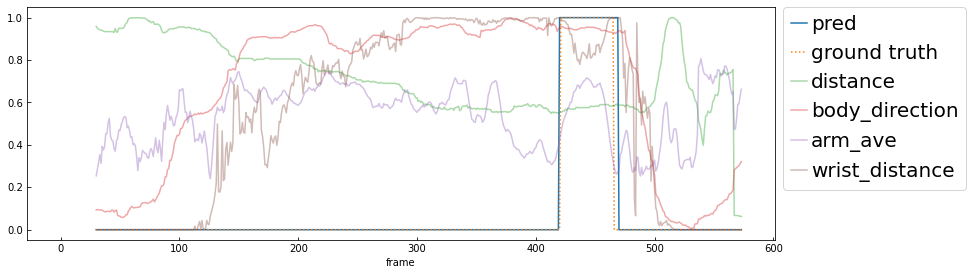

08_001_35_365_363


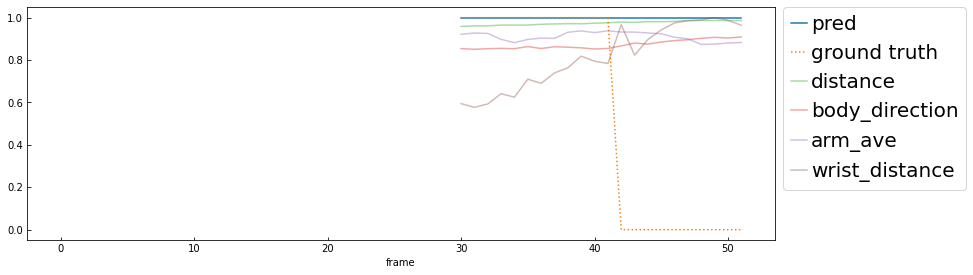

09_001_03_40_45


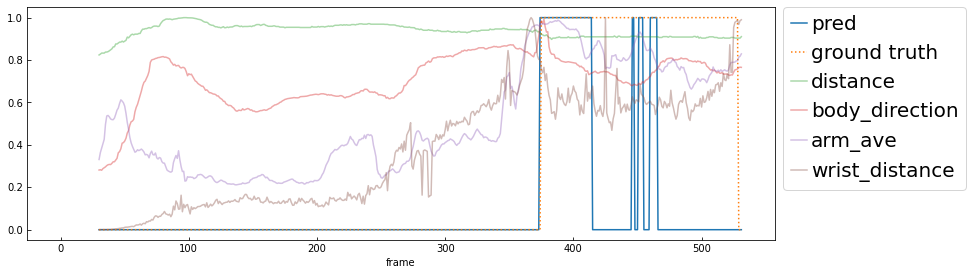

08_001_34_356_357


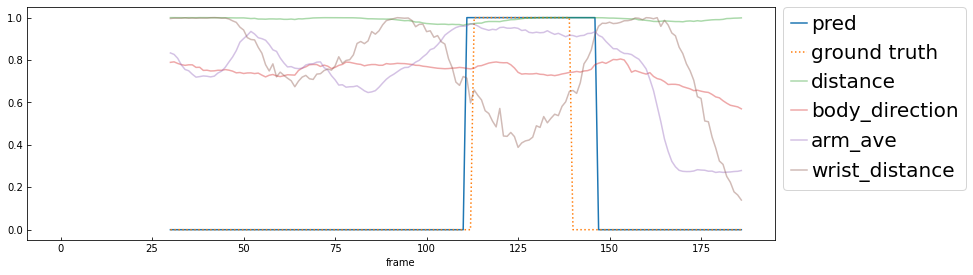

In [20]:
y_all_train = []
pred_all_train = []
y_eve_train = []
pred_eve_train = []

model.eval()
with torch.no_grad():
    for key in train_keys:
        x_lst = np.array(x_dict[key])
        y_lst = y_dict[key]
        
        x, _ = create_sequence(x_lst, y_lst, seq_len, size)
        x = torch.Tensor(np.array(x)).float().to(device)
        
        if len(x) == 0:
            continue

        pred = model(x)
        pred = pred.max(1)[1]
        pred = pred.cpu().numpy()

        x_lst = x_lst[seq_len - 1:]
        y_lst = y_lst[seq_len - 1:]
            
        y_all_train += y_lst
        pred_all_train += pred.tolist()
        y_eve_train.append(1 in y_lst)
        pred_eve_train.append(1 in pred.tolist())
        
        if 1 not in y_lst:
            continue
            
        print(key)
        path = None
        if key in save_keys:
            path = os.path.join("data", "image", "passing", f"rnn_test_{key}.pdf")
        plot(x_lst, y_lst, pred, seq_len, path=path)

In [21]:
print('accuracy: {:.3f}'.format(accuracy_score(y_all_train, pred_all_train)))
print('precision: {:.3f}'.format(precision_score(y_all_train, pred_all_train)))
print('recall: {:.3f}'.format(recall_score(y_all_train, pred_all_train)))
print('f1_score: {:.3f}'.format(f1_score(y_all_train, pred_all_train)))

accuracy: 0.998
precision: 0.795
recall: 0.871
f1_score: 0.832


In [22]:
# per event
print('accuracy: {:.3f}'.format(accuracy_score(y_eve_train, pred_eve_train)))
print('precision: {:.3f}'.format(precision_score(y_eve_train, pred_eve_train)))
print('recall: {:.3f}'.format(recall_score(y_eve_train, pred_eve_train)))
print('f1_score: {:.3f}'.format(f1_score(y_eve_train, pred_eve_train)))

accuracy: 0.982
precision: 0.547
recall: 0.941
f1_score: 0.692


## テストデータ

In [23]:
save_keys = [
    '08_03_2_5',
]

02_001_21_288_287


/tmp/ipykernel_3033440/3688248503.py:14: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:210.)
  x = torch.Tensor(x).float().to(device)


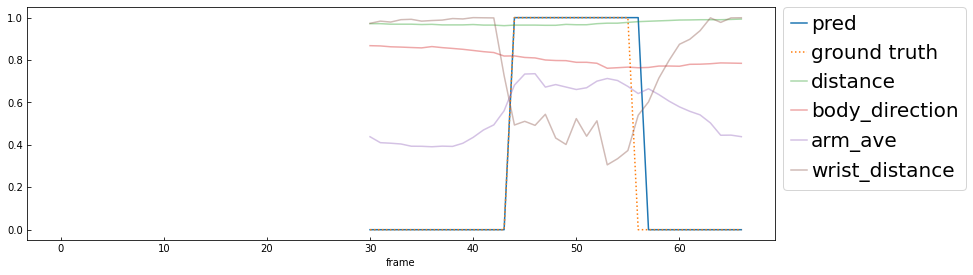

09_002_09_94_92


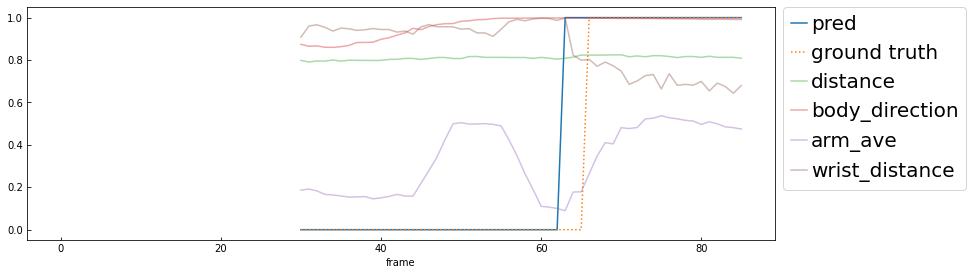

09_001_06_82_85


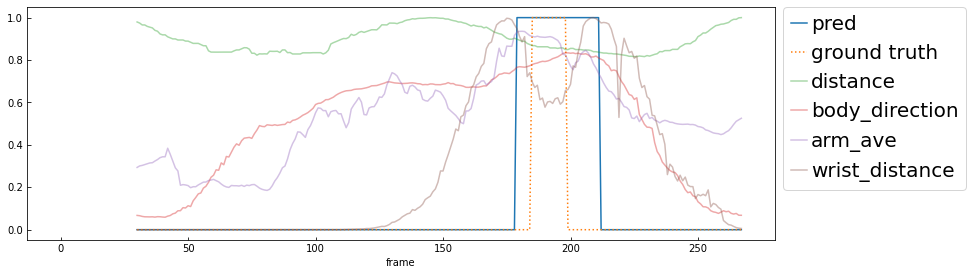

07_001_23_356_367


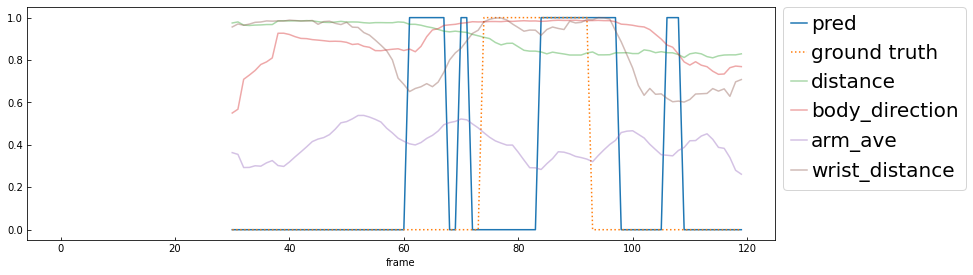

09_002_15_176_178


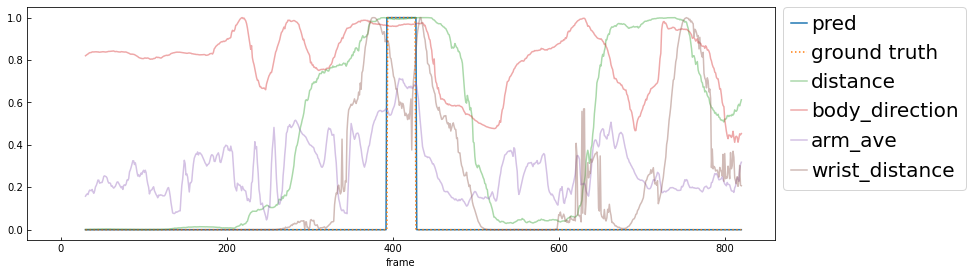

08_001_09_91_89


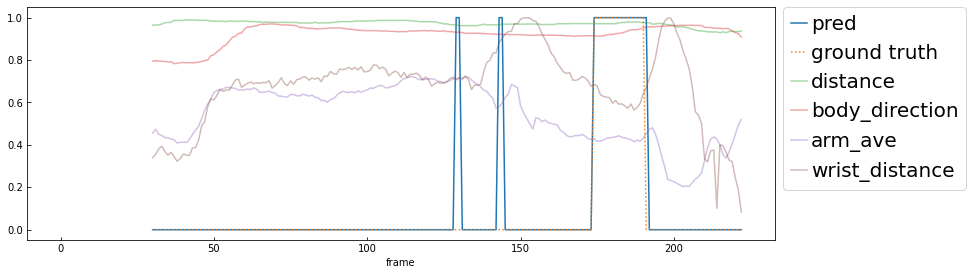

08_002_36_403_404


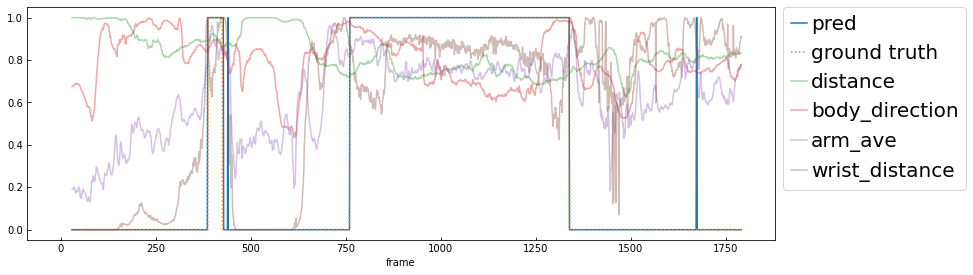

08_002_41_444_454


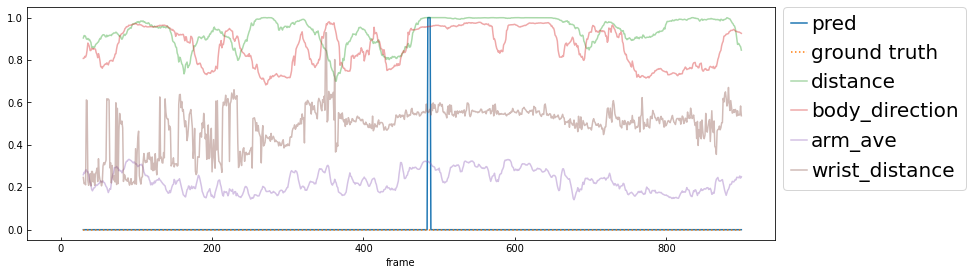

09_002_02_18_8


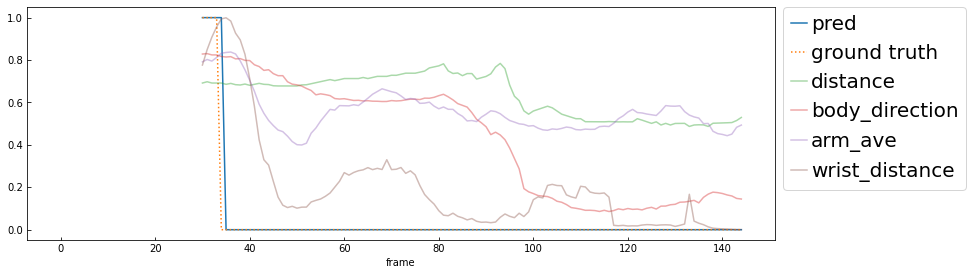

09_002_02_8_18


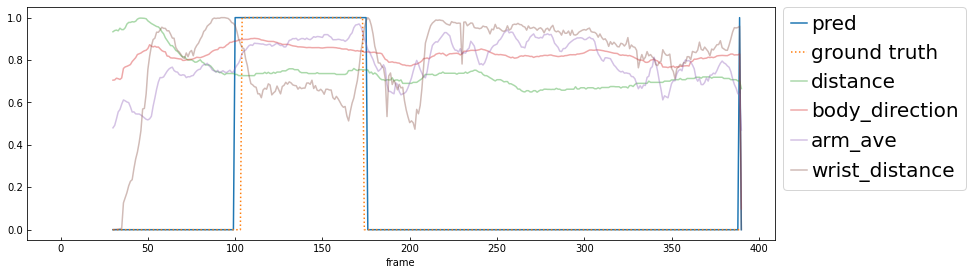

08_001_01_3_2


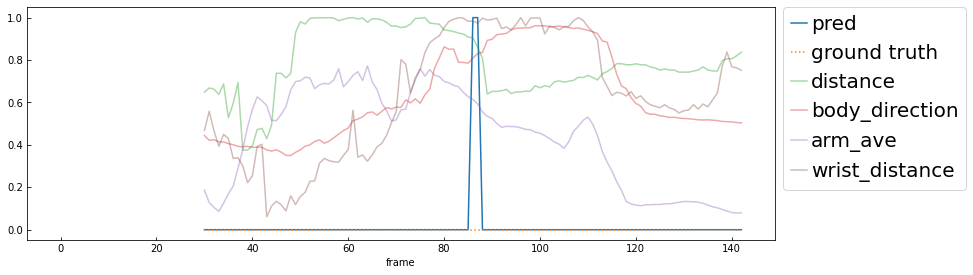

07_001_20_297_317


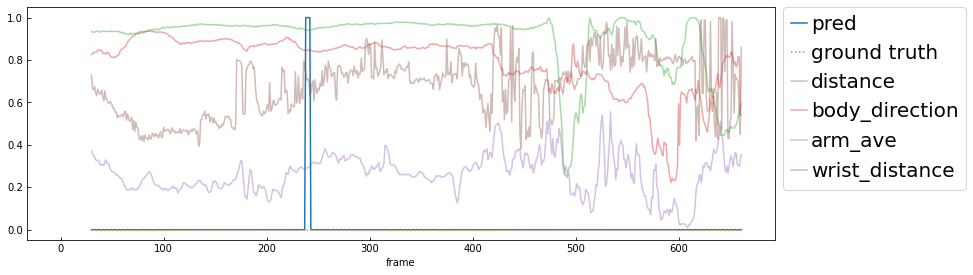

02_001_03_27_31


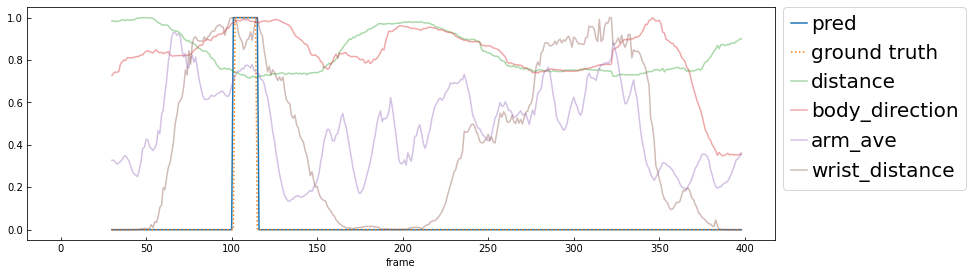

08_001_05_49_51


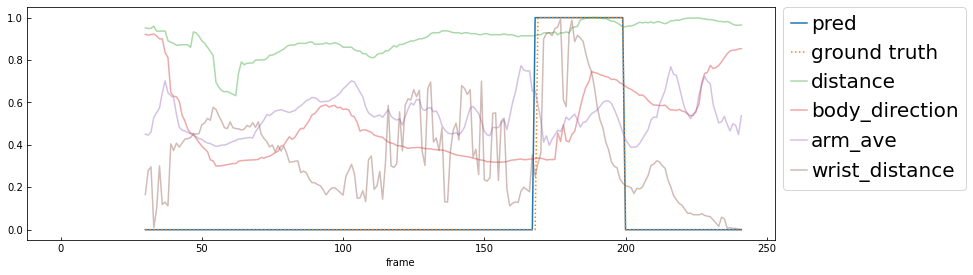

08_002_06_49_72


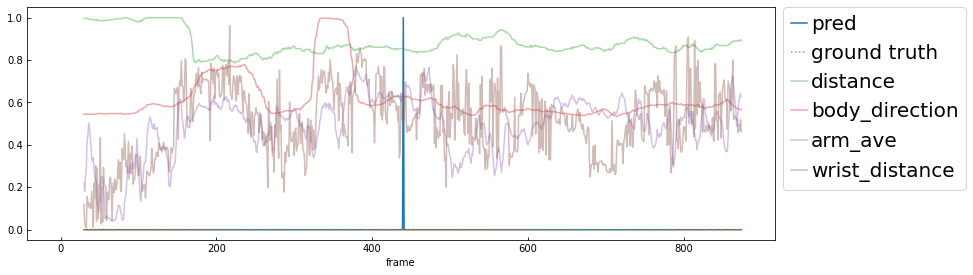

08_001_07_67_69


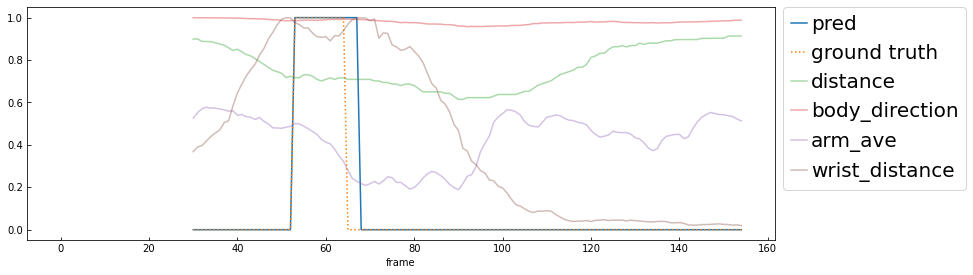

08_002_02_10_30


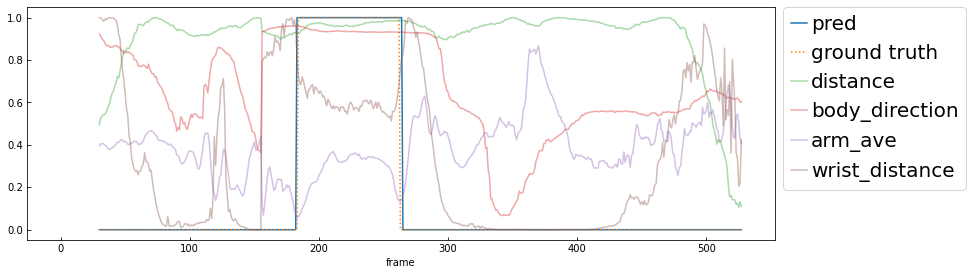

07_001_36_505_543


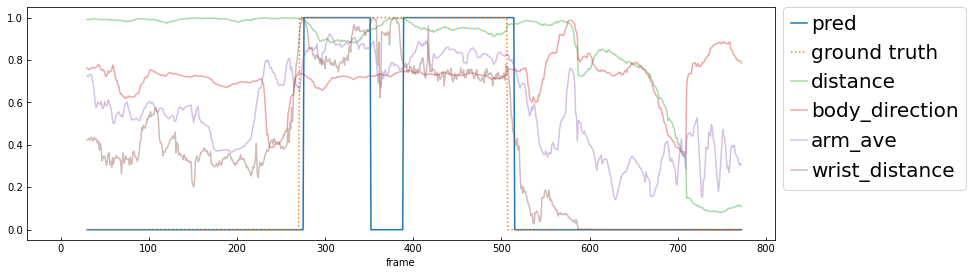

09_001_08_103_105


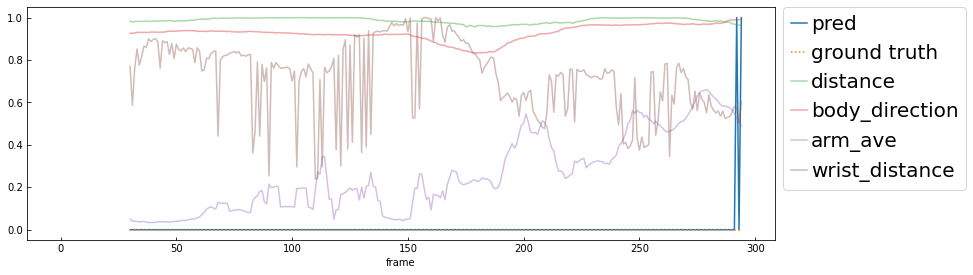

02_001_13_166_167


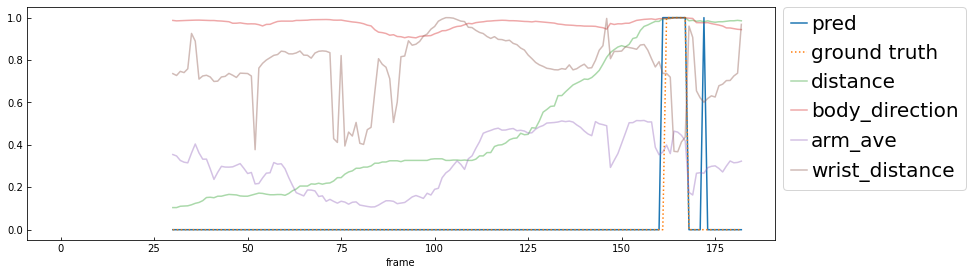

08_002_45_446_479


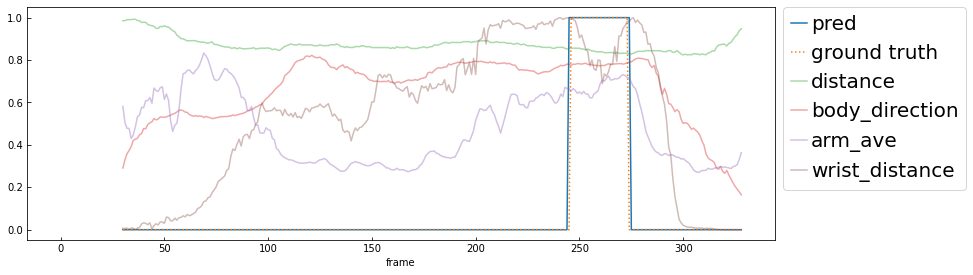

08_001_31_327_334


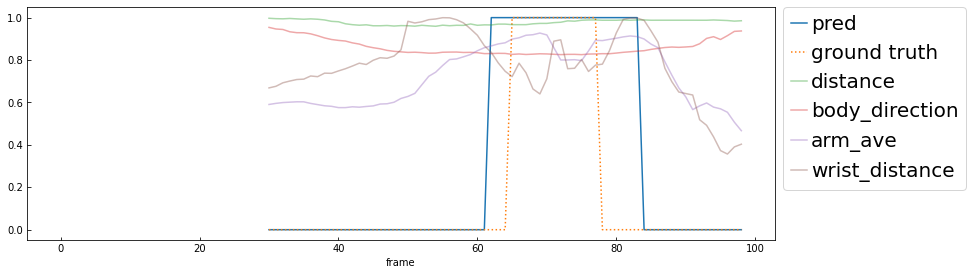

07_001_22_356_297


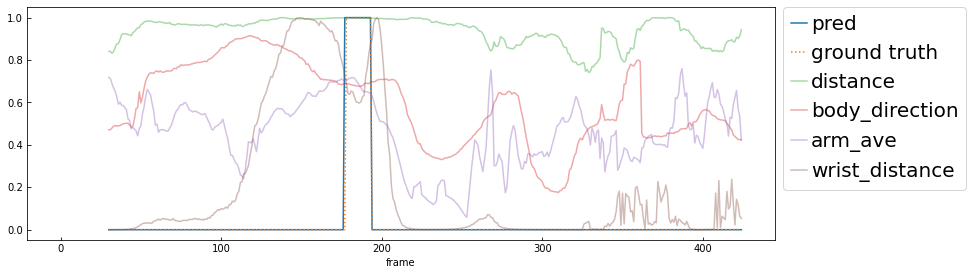

07_001_38_588_543


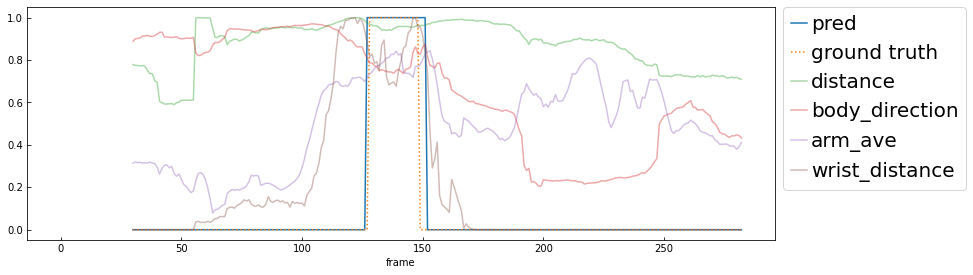

09_002_13_116_130


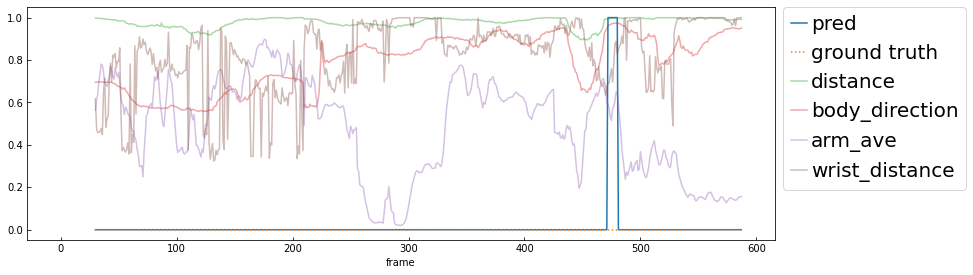

07_001_40_588_543


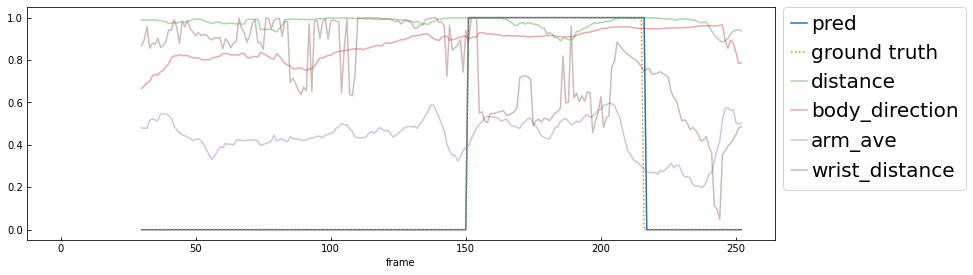

07_001_35_506_505


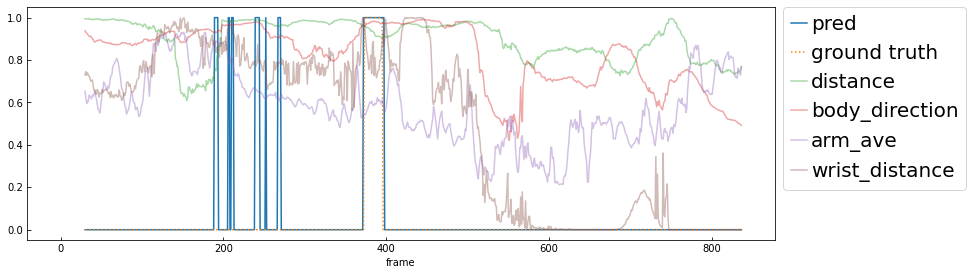

02_001_18_247_251


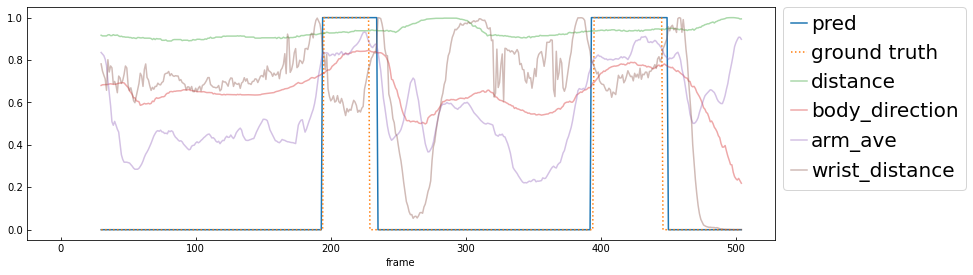

08_001_23_237_242


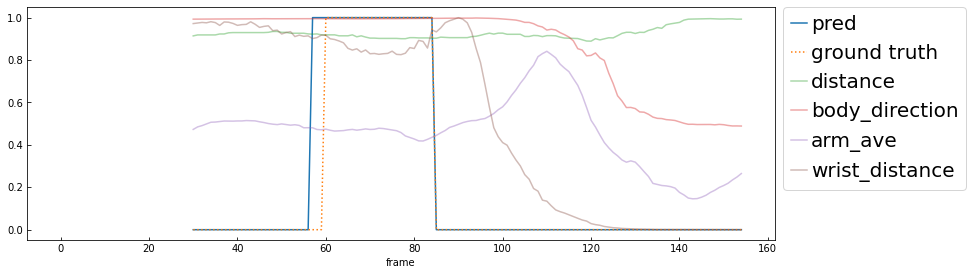

09_002_07_75_60


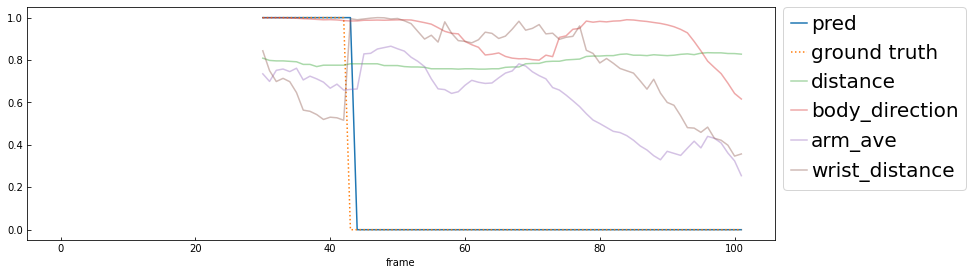

07_001_37_543_565


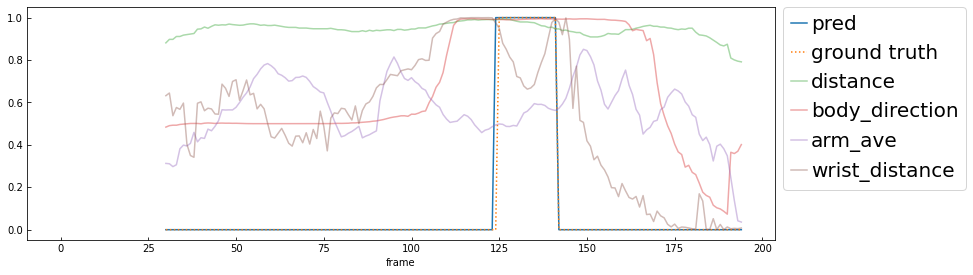

08_002_02_10_29


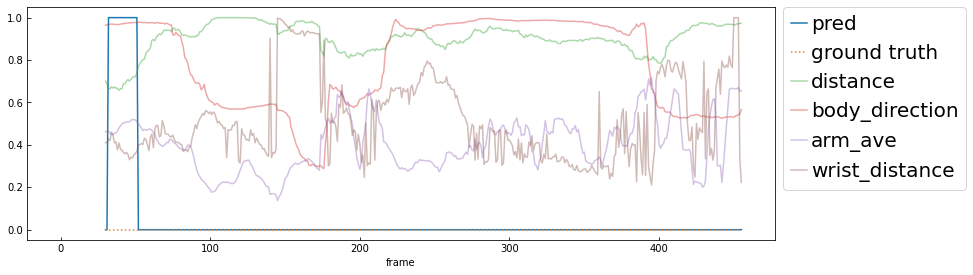

08_002_13_147_126


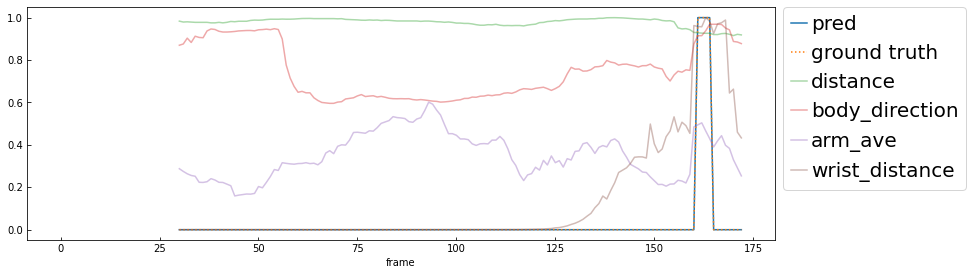

09_002_13_92_140


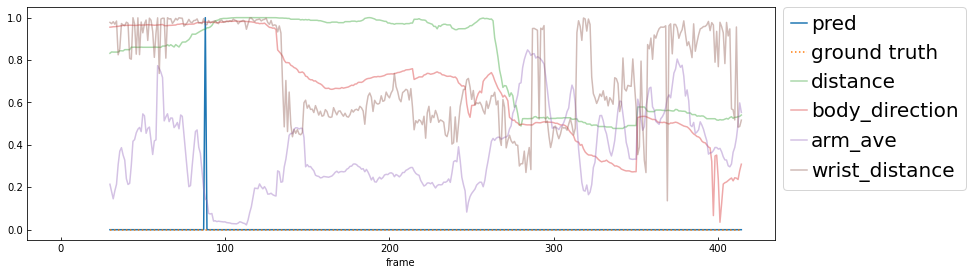

08_002_10_72_110


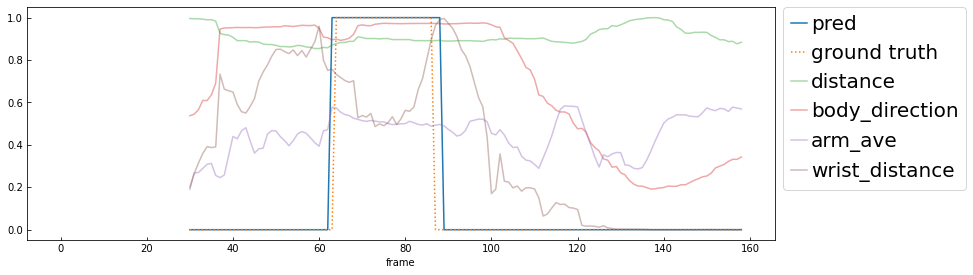

09_001_04_56_62


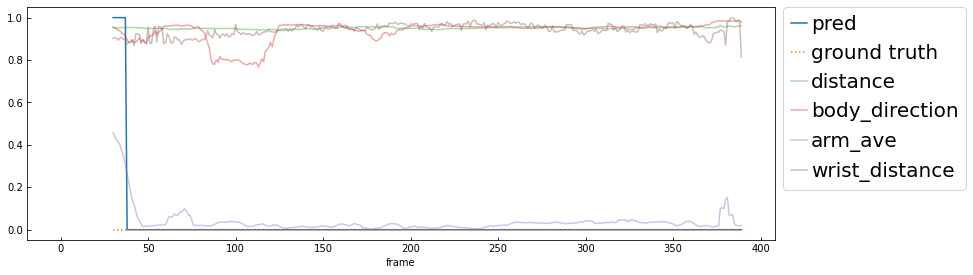

07_001_12_195_191


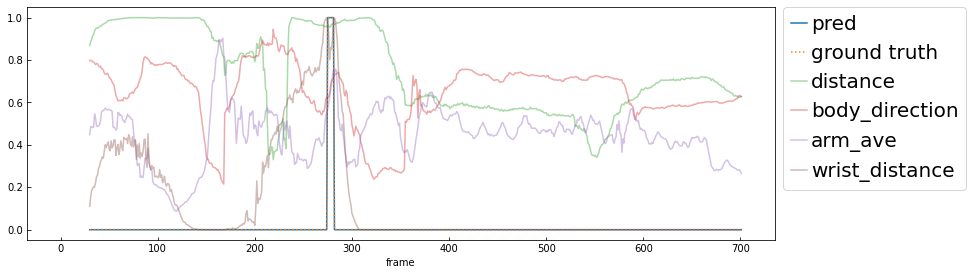

08_002_03_44_37


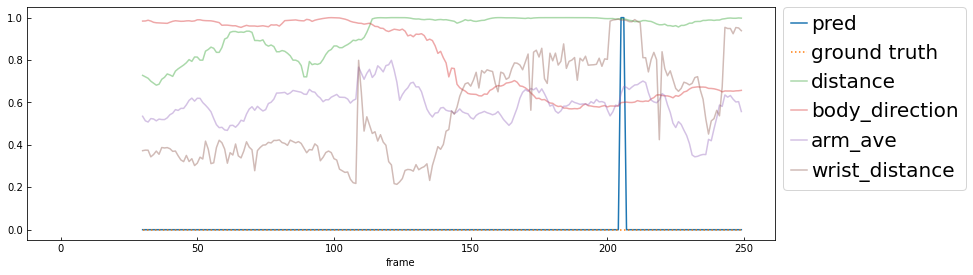

08_002_11_118_125


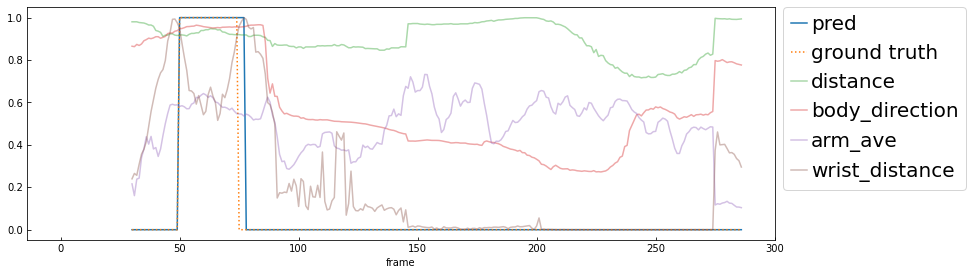

08_002_15_154_153


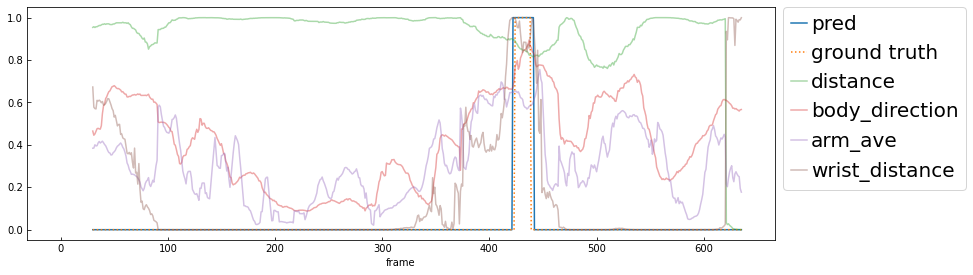

07_001_46_652_651


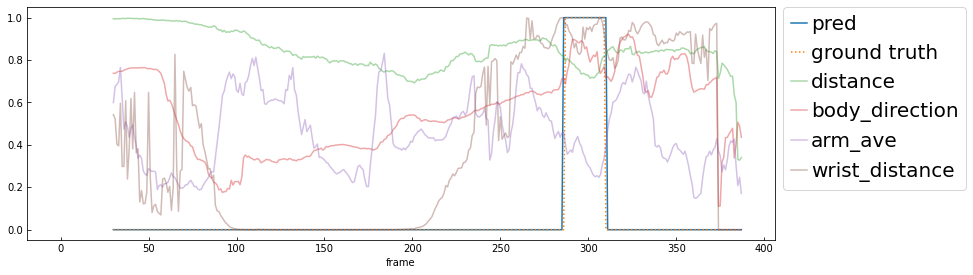

07_001_33_506_483


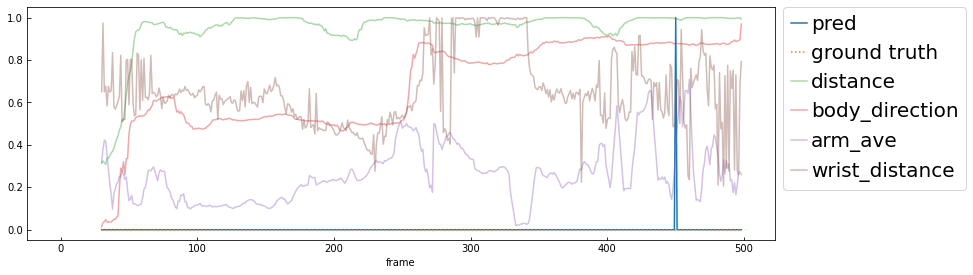

08_001_25_261_266


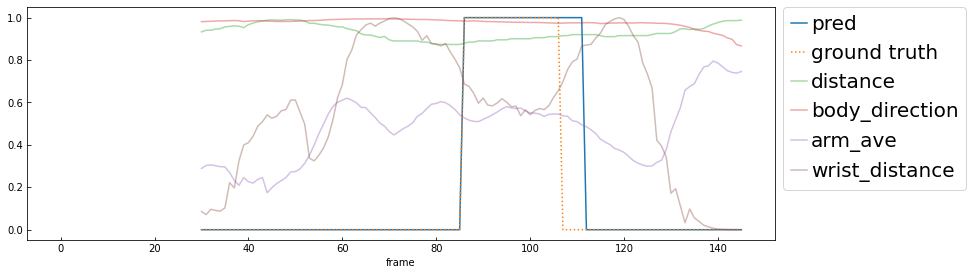

02_001_20_268_270


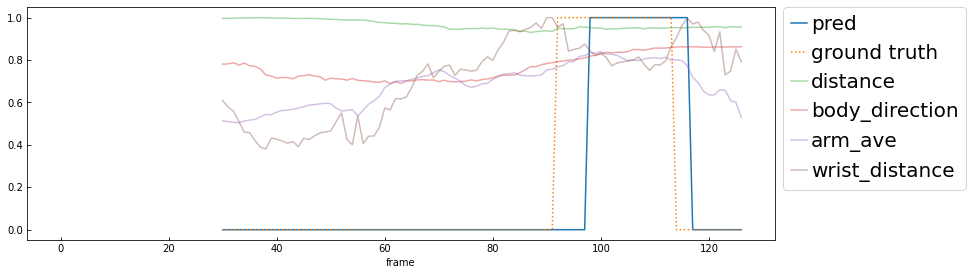

07_001_29_453_436


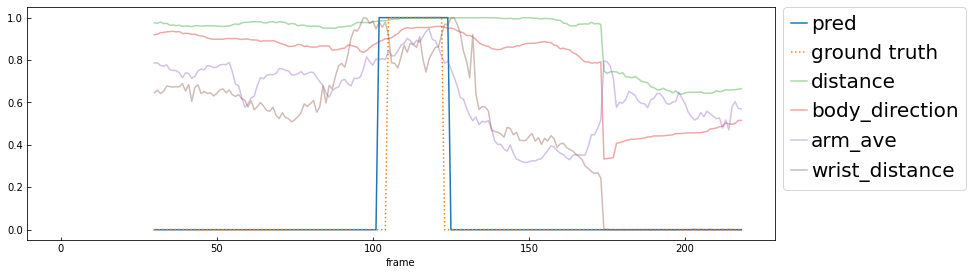

07_001_25_390_392


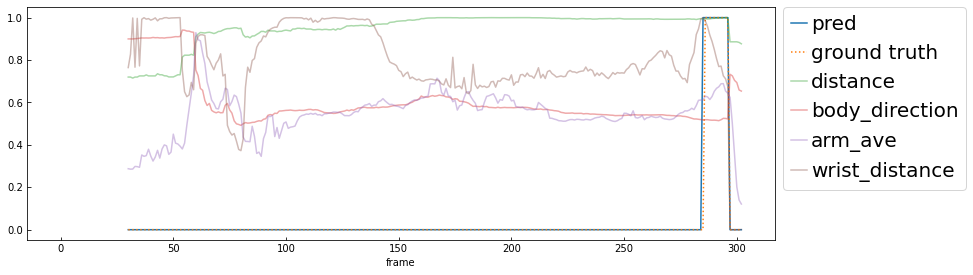

02_001_10_119_120


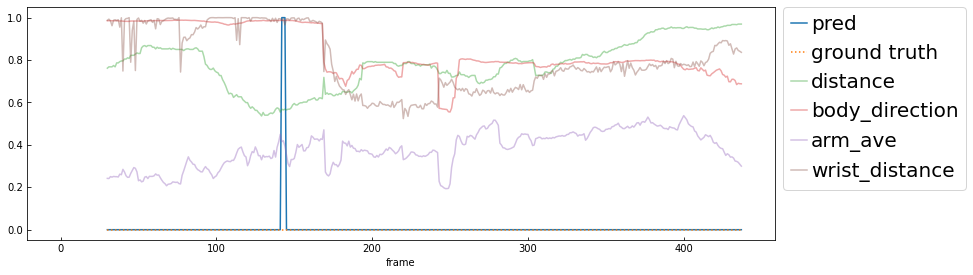

08_002_11_121_117


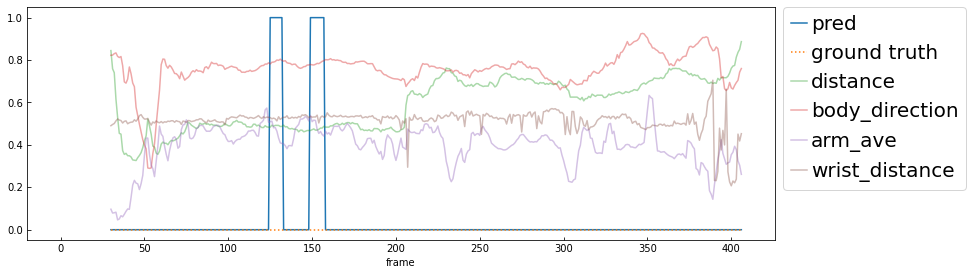

08_001_25_262_266


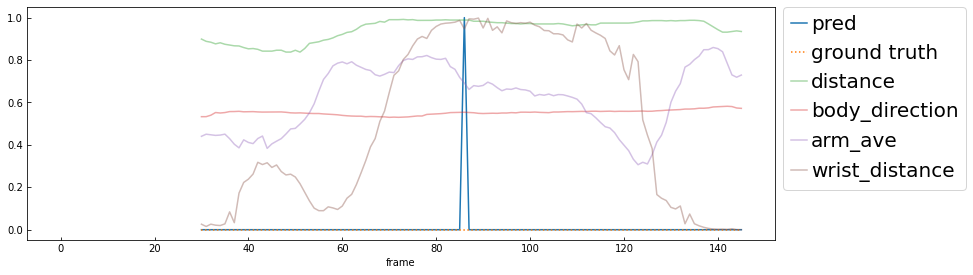

08_001_39_403_405


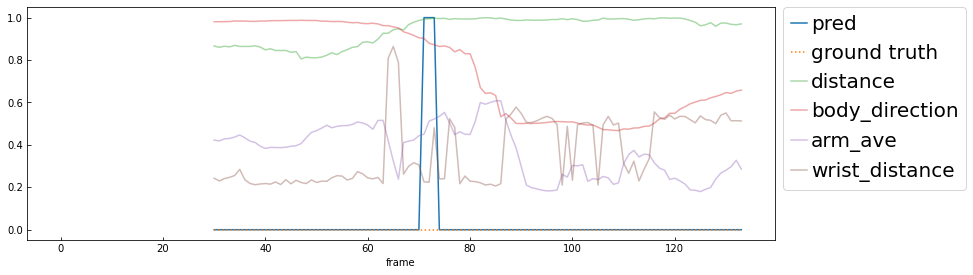

08_002_36_397_412


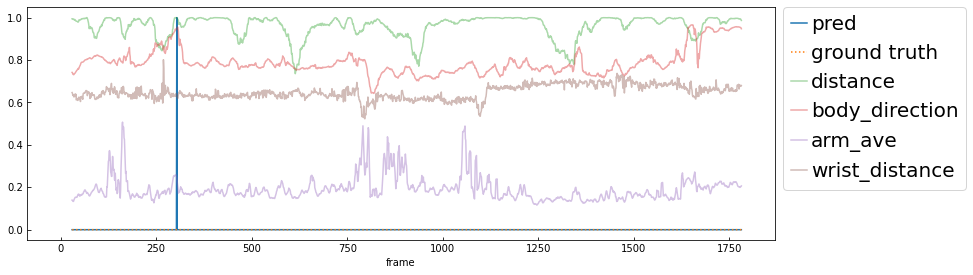

09_002_09_60_87


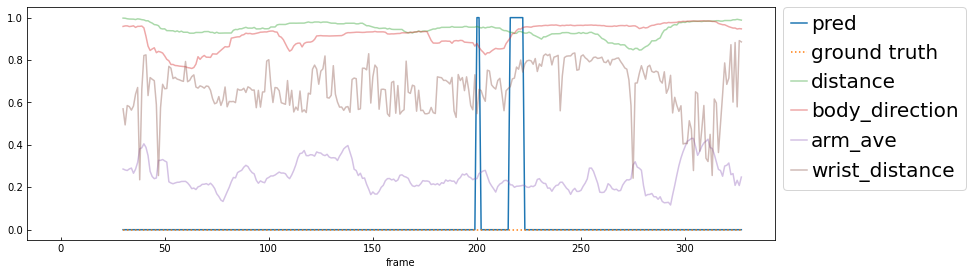

02_001_11_134_136


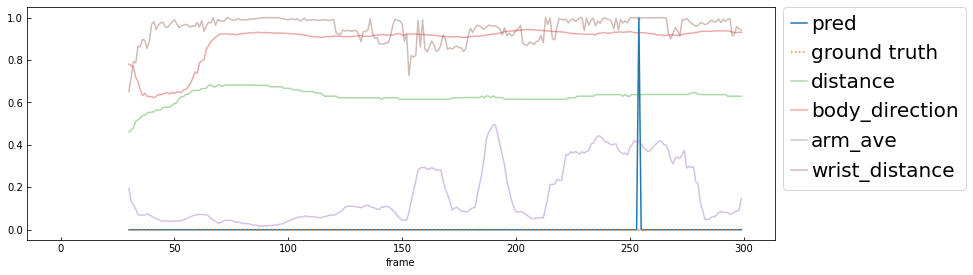

02_001_08_83_86


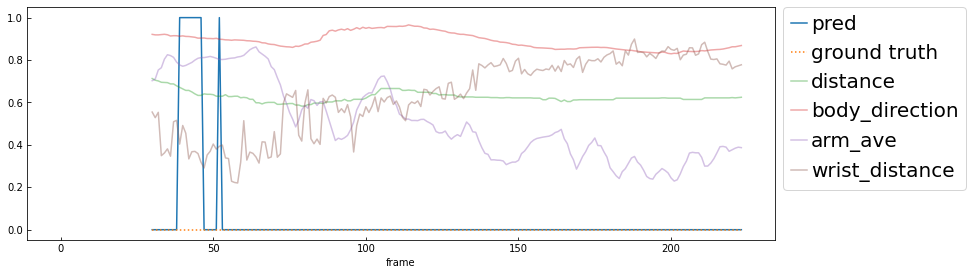

08_001_15_163_164


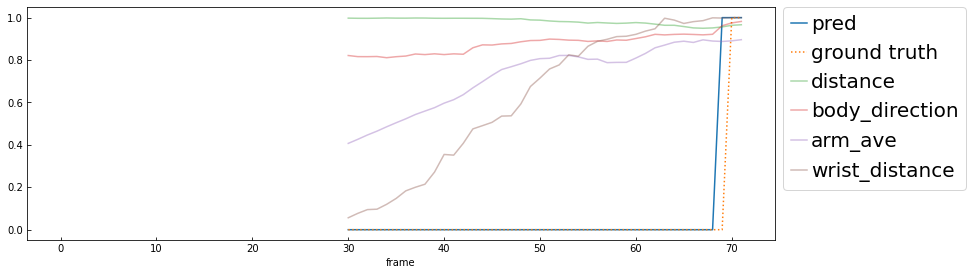

09_001_05_78_75


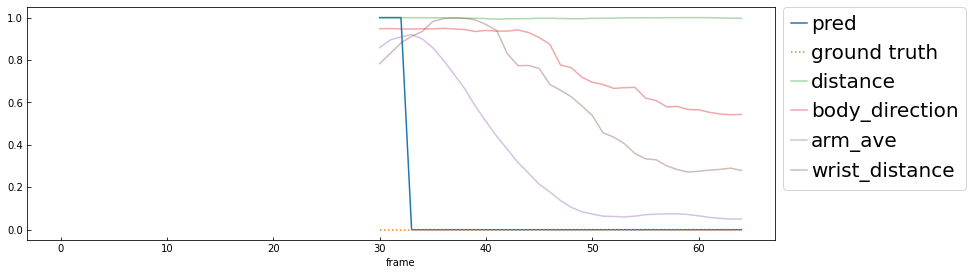

02_001_23_304_309


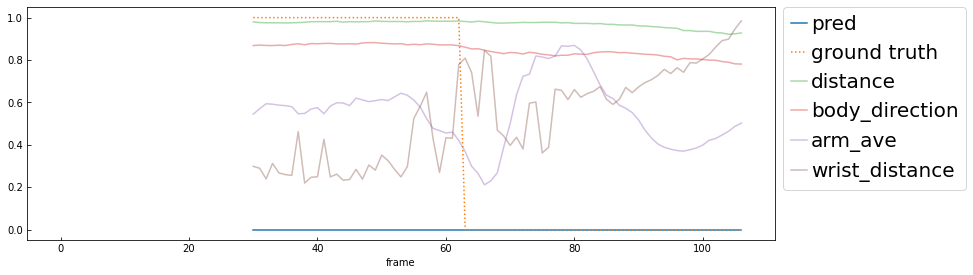

02_001_19_259_262


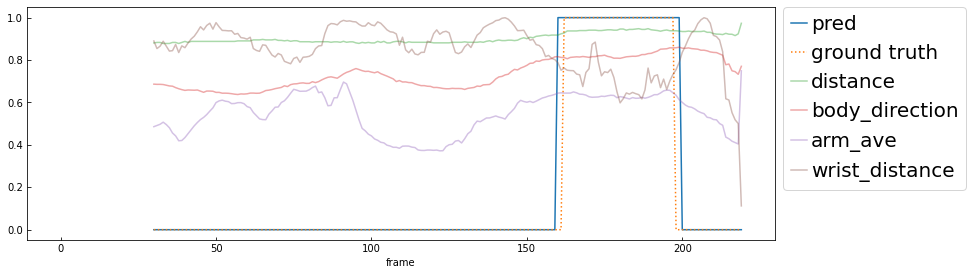

08_002_21_243_245


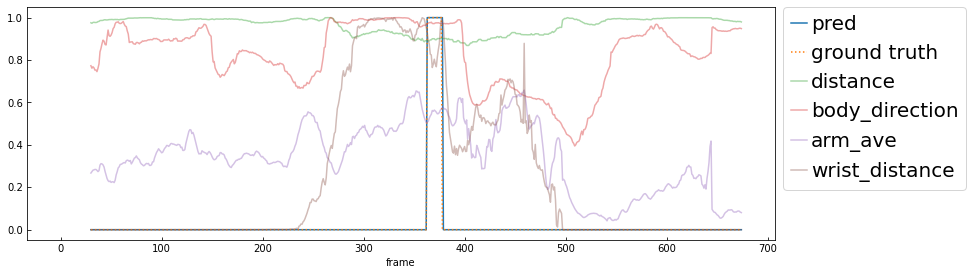

08_002_09_72_102


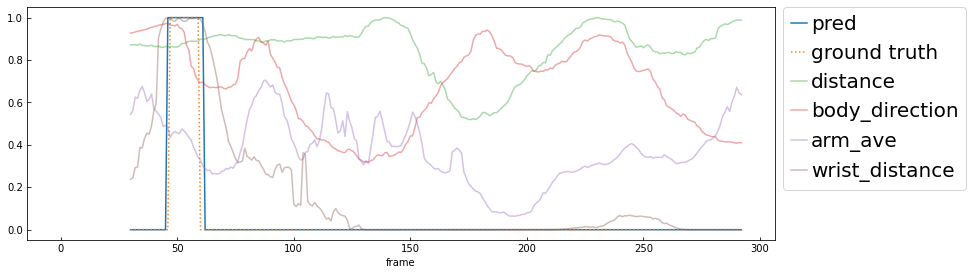

07_001_03_33_28


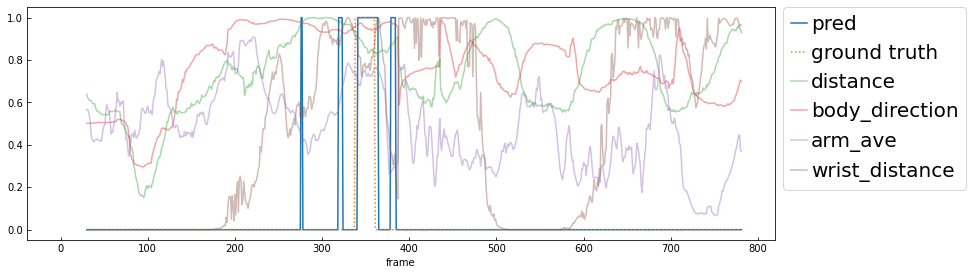

09_001_04_60_58


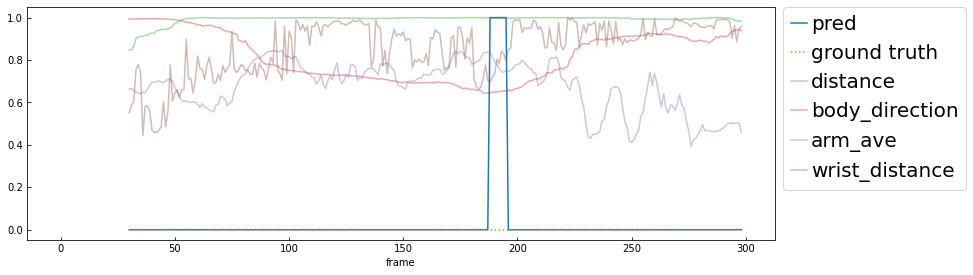

09_002_02_21_22


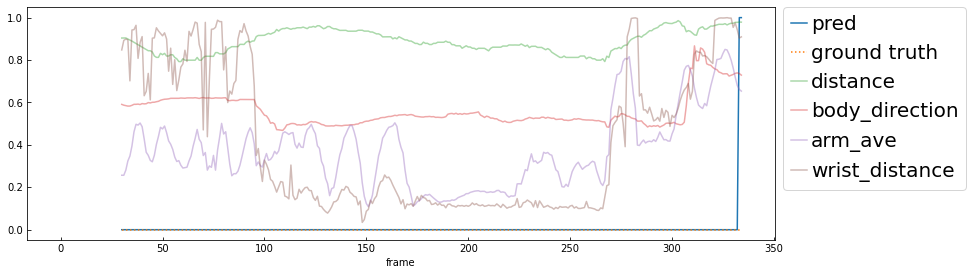

08_002_42_439_446


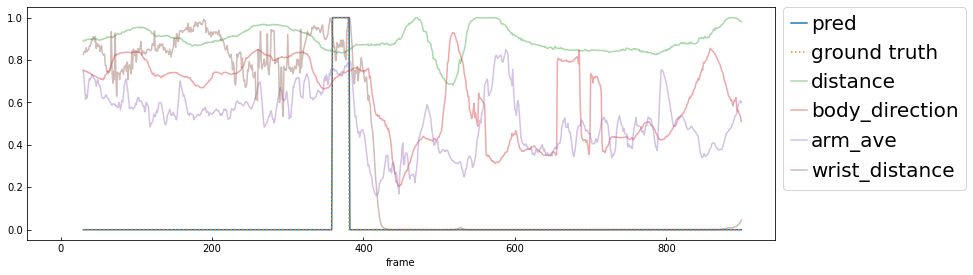

08_001_20_210_215


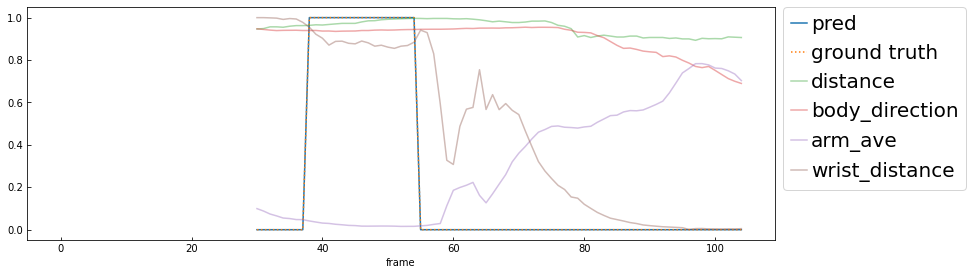

08_001_24_247_245


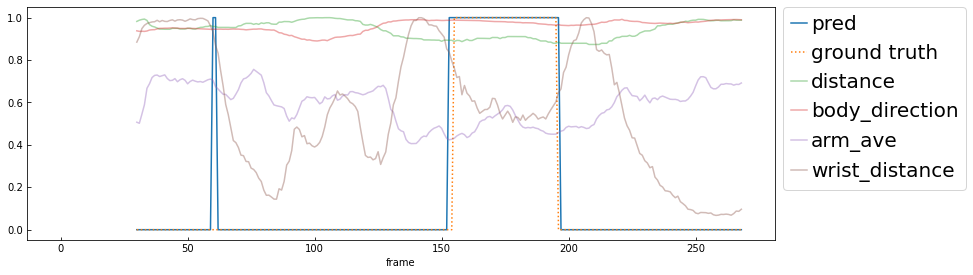

02_001_09_103_104


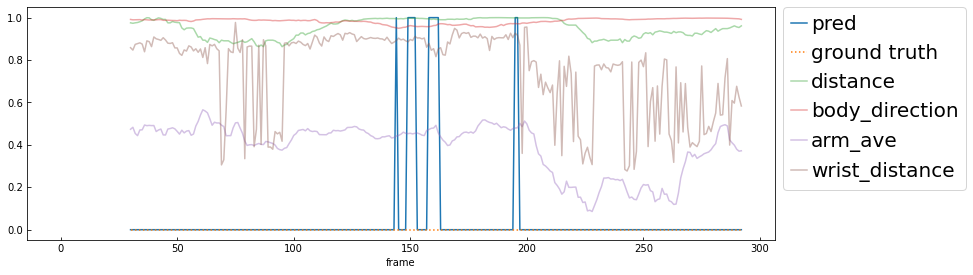

08_002_20_229_241


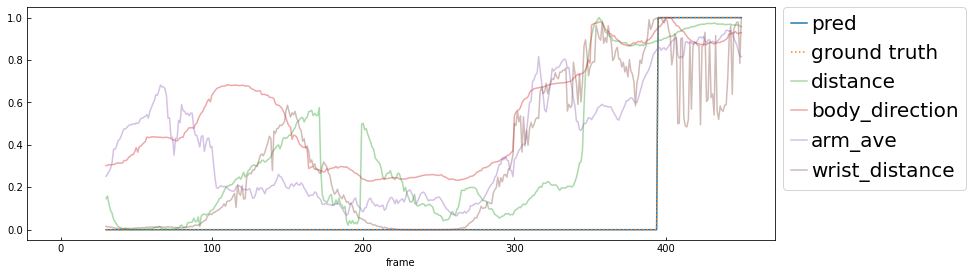

07_001_21_317_350


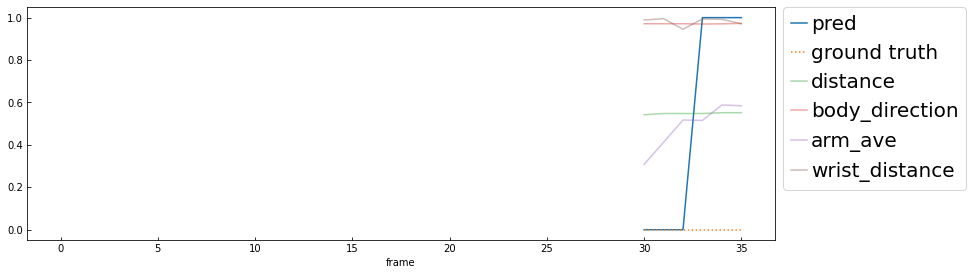

09_002_03_26_27


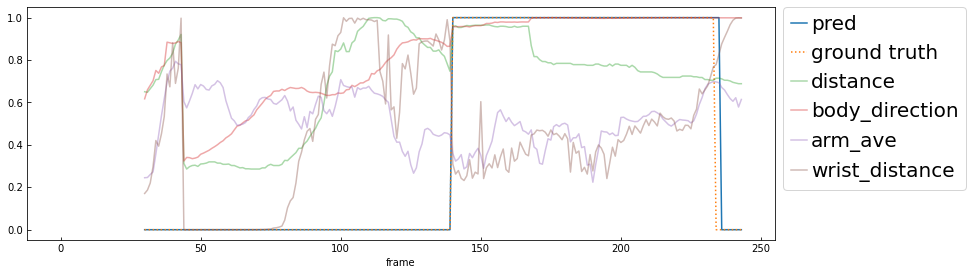

09_001_03_45_37


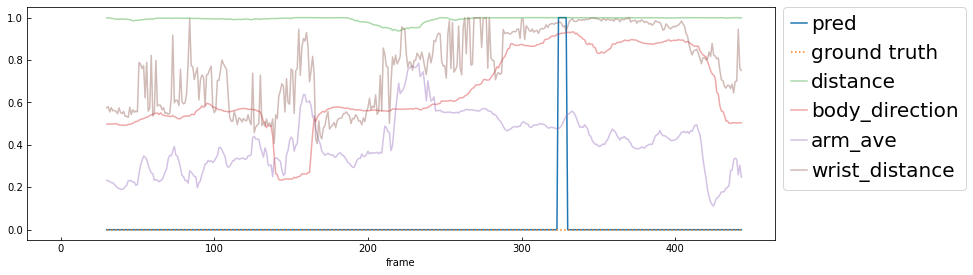

07_001_37_543_569


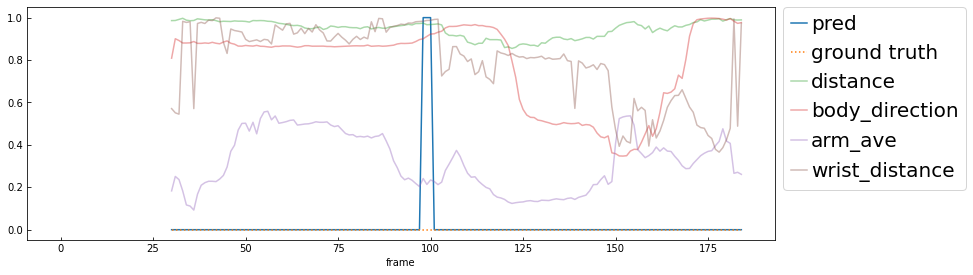

07_001_40_587_596


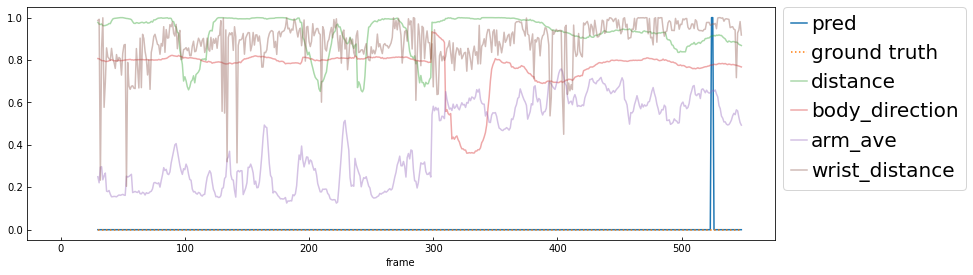

In [24]:
y_all_test = []
pred_all_test = []
y_eve_test = []
pred_eve_test = []
tn, fn = 0, 0

model.eval()
with torch.no_grad():
    for key in test_keys:
        x_lst = np.array(x_dict[key])
        y_lst = y_dict[key]

        x, _ = create_sequence(x_lst, y_lst, seq_len, size)
        x = torch.Tensor(x).float().to(device)

        if len(x) == 0:
            tn += 1
            continue
            
        pred = model(x)
        pred = pred.max(1)[1]
        pred = pred.cpu().numpy()

        x_lst = x_lst[seq_len - 1:]
        y_lst = y_lst[seq_len - 1:]
        
        y_all_test += y_lst
        pred_all_test += pred.tolist()
        y_eve_test.append(1 in y_lst)
        pred_eve_test.append(1 in pred.tolist())
        if 1 not in y_lst:
            if 1 not in pred:
                tn += 1
            else:
                fn += 1
        
        if 1 not in pred and 1 not in y_lst:
            continue
            
        print(key)
        path = None
        if key in save_keys:
            path = os.path.join(common.data_dir, "image", "passing", f"rnn_test_{key}.pdf")
        plot(x_lst, y_lst, pred, seq_len, path=path)

accuracy: 0.999
precision: 0.849
recall: 0.953
f1_score: 0.898


<AxesSubplot:>

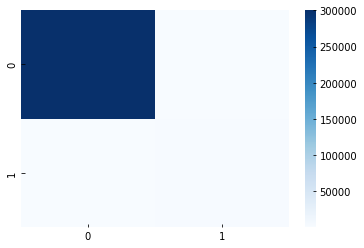

In [25]:
print('accuracy: {:.3f}'.format(accuracy_score(y_all_test, pred_all_test)))
print('precision: {:.3f}'.format(precision_score(y_all_test, pred_all_test)))
print('recall: {:.3f}'.format(recall_score(y_all_test, pred_all_test)))
print('f1_score: {:.3f}'.format(f1_score(y_all_test, pred_all_test)))

cm = confusion_matrix(y_all_test, pred_all_test)
sns.heatmap(cm, cmap='Blues')

accuracy: 0.982
precision: 0.625
recall: 0.978
f1_score: 0.763
true negative: 3161
false negative: 27


<AxesSubplot:>

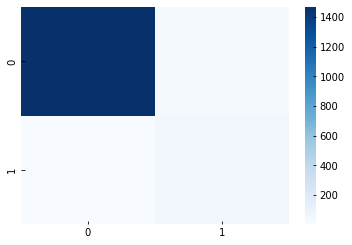

In [26]:
# per event
print('accuracy: {:.3f}'.format(accuracy_score(y_eve_test, pred_eve_test)))
print('precision: {:.3f}'.format(precision_score(y_eve_test, pred_eve_test)))
print('recall: {:.3f}'.format(recall_score(y_eve_test, pred_eve_test)))
print('f1_score: {:.3f}'.format(f1_score(y_eve_test, pred_eve_test)))

print('true negative:', tn)
print('false negative:', fn)

cm = confusion_matrix(y_eve_test, pred_eve_test)
sns.heatmap(cm, cmap='Blues')